In [1]:
from astropy.table import QTable
import numpy as np
from scipy import optimize
from scipy import special
from scipy import interpolate
from scipy import stats
from scipy import linalg
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from calc_XY import calc_XY
import cProfile
import re
import pstats
from pstats import SortKey
import pandas as pd

In [2]:
# return the 2nd-order partial derivatives of J
def secpartial_j(j0, A, B, F, G, u, v, a):
    a_2 = a**2
    r_a = 1/a
    const2 = 1/(2*a*np.sqrt(u**2 - v**2))
    const5 = u - 3*a**2
    # 1st-order partial derivatives of a
    da_dA = (A*a_2 - v*G)*const2; da_dB = (B*a_2 + v*F)*const2
    da_dF = (F*a_2 + v*B)*const2; da_dG = (G*a_2 - v*A)*const2
    # 2nd-order partial derivatives of a
    da_dA2 = const2*(a**2 - 4*(a*da_dA)**2 + 4*a*A*da_dA - G**2) - r_a*da_dA**2
    da_dB2 = const2*(a**2 - 4*(a*da_dB)**2 + 4*a*B*da_dB - F**2) - r_a*da_dB**2
    da_dF2 = const2*(a**2 - 4*(a*da_dF)**2 + 4*a*F*da_dF - B**2) - r_a*da_dF**2
    da_dG2 = const2*(a**2 - 4*(a*da_dG)**2 + 4*a*G*da_dG - A**2) - r_a*da_dG**2
    da_dAdB = const2*(-4*a**2*da_dA*da_dB + 2*a*A*da_dB + 2*a*B*da_dA + G*F) - r_a*da_dA*da_dB     #da_dBdA = da_dAdB
    da_dAdF = const2*(-4*a**2*da_dA*da_dF + 2*a*A*da_dF + 2*a*F*da_dA + G*B) - r_a*da_dA*da_dF     #da_dFdA = da_dAdF
    da_dAdG = const2*(-4*a**2*da_dA*da_dG + 2*a*A*da_dG + 2*a*G*da_dA - A*G - v) - r_a*da_dA*da_dG #da_dGdA = da_dAdG
    da_dBdF = const2*(-4*a**2*da_dB*da_dF + 2*a*B*da_dF + 2*a*F*da_dB - B*F + v) - r_a*da_dB*da_dF #da_dFdB = da_dBdF
    da_dBdG = const2*(-4*a**2*da_dB*da_dG + 2*a*B*da_dG + 2*a*G*da_dB + A*F) - r_a*da_dB*da_dG     #da_dGdB = da_dBdG
    da_dFdG = const2*(-4*a**2*da_dF*da_dG + 2*a*F*da_dG + 2*a*G*da_dF + A*B) - r_a*da_dF*da_dG     #da_dGdF = da_dFdG
    # 1st-order partial derivatives of J
    dj_dA = (a*A + const5*da_dA)*2*j0**2; dj_dB = (a*B + const5*da_dB)*2*j0**2
    dj_dF = (a*F + const5*da_dF)*2*j0**2; dj_dG = (a*G + const5*da_dG)*2*j0**2
    # 2nd-order partial derivatives of J
    dj_dA2 = 2*j0**2*(2*A*da_dA + a - 6*a*da_dA**2 + const5*da_dA2) + 2*dj_dA**2/j0
    dj_dB2 = 2*j0**2*(2*B*da_dB + a - 6*a*da_dB**2 + const5*da_dB2) + 2*dj_dB**2/j0
    dj_dF2 = 2*j0**2*(2*F*da_dF + a - 6*a*da_dF**2 + const5*da_dF2) + 2*dj_dF**2/j0
    dj_dG2 = 2*j0**2*(2*G*da_dG + a - 6*a*da_dG**2 + const5*da_dG2) + 2*dj_dG**2/j0
    dj_dAdB = 2*j0**2*(A*da_dB + B*da_dA - 6*a*da_dA*da_dB + const5*da_dAdB) + 2*dj_dA*dj_dB/j0 # dj_dBdA = dj_dAdB
    dj_dAdF = 2*j0**2*(A*da_dF + F*da_dA - 6*a*da_dA*da_dF + const5*da_dAdF) + 2*dj_dA*dj_dF/j0 # dj_dFdA = dj_dAdF
    dj_dAdG = 2*j0**2*(A*da_dG + G*da_dA - 6*a*da_dA*da_dG + const5*da_dAdG) + 2*dj_dA*dj_dG/j0 # dj_dGdA = dj_dAdG
    dj_dBdF = 2*j0**2*(B*da_dF + F*da_dB - 6*a*da_dB*da_dF + const5*da_dBdF) + 2*dj_dB*dj_dF/j0 # dj_dFdB = dj_dBdF
    dj_dBdG = 2*j0**2*(B*da_dG + G*da_dB - 6*a*da_dB*da_dG + const5*da_dBdG) + 2*dj_dB*dj_dG/j0 # dj_dGdB = dj_dBdG
    dj_dFdG = 2*j0**2*(F*da_dG + G*da_dF - 6*a*da_dF*da_dG + const5*da_dFdG) + 2*dj_dF*dj_dG/j0 # dj_dGdF = dj_dFdG
    return np.array([[dj_dA2,dj_dAdB,dj_dAdF,dj_dAdG], [dj_dAdB,dj_dB2,dj_dBdF,dj_dBdG], 
                          [dj_dAdF,dj_dBdF,dj_dF2,dj_dFdG], [dj_dAdG,dj_dBdG,dj_dFdG,dj_dG2]])

In [3]:
# take into account the thresholds of a and sin^2i in Taylor expansion
def mod_secpartial_j(j0, A, B, F, G, u, v, a, da):
    # gradients of a, u, v with respect to A, B, F, G
    grada = np.array([a**2*A - v*G, a**2*B + v*F, a**2*F + v*B, a**2*G - v*A])
    grada /= 2*a*np.sqrt(u**2 - v**2)

    TI = np.array([A, B, F, G])   # gradu
    gradv = np.array([G, -F, -B, A])

    # Hessian of u, v with respect to A, B, F, G
    hessu = np.identity(4)
    hessv = np.zeros((4, 4))
    hessv[0, 3] = hessv[3, 0] = 1
    hessv[1, 2] = hessv[2, 1] = -1

    # Hessian of a with respect to A, B, F, G
    hessa = -(u*TI - v*gradv)/(u**2 - v**2)*grada[:, np.newaxis]
    hessa += 0.5/np.sqrt(u**2 - v**2)*(grada*TI[:, np.newaxis]
                                 + a*np.identity(4)
                                 - 1/a*gradv*gradv[:, np.newaxis]
                                 + v/a**2*grada*gradv[:, np.newaxis]
                                 - v/a*hessv)
    
    # Gradient of J
    gradJ = (-3*j0/(a + da) - 4*u*j0**2*((a + da)/a)**3)*grada
    gradJ += 2*(j0/a)**2*(a + da)**3*TI
    
    # Hessian of J
    hessJ = (-3*j0/(a + da) - 4*u*j0**2*(a + da)**3/a**3)*hessa
    hessJ += 2*(j0/a)**2*(a + da)**3*hessu
    hessJ -= 3*j0/(a + da)*(gradJ/j0 - grada/(a + da))*grada[:, np.newaxis]
    hessJ -= 4*u*j0**2*((a + da)/a)**3*(TI/u + 2*gradJ/j0 -3*da*grada/(a*(a + da)))*grada[:, np.newaxis]
    hessJ += 2*(j0/a)**2*(a + da)**3*(2*gradJ/j0 + grada*(a - 2*da)/(a*(a + da)))*TI[:, np.newaxis]
    
    return hessJ

In [4]:
# take into account the thresholds of a and sin^2i in Taylor expansion, for log-uniform priors of a
def mod_secpartial_j_logunia(j0, A, B, F, G, u, v, a, da):
    # gradients of a, u, v with respect to A, B, F, G
    grada = np.array([a**2*A - v*G, a**2*B + v*F, a**2*F + v*B, a**2*G - v*A])
    grada /= 2*a*np.sqrt(u**2 - v**2)

    TI = np.array([A, B, F, G])   # gradu
    gradv = np.array([G, -F, -B, A])

    # Hessian of u, v with respect to A, B, F, G
    hessu = np.identity(4)
    hessv = np.zeros((4, 4))
    hessv[0, 3] = hessv[3, 0] = 1
    hessv[1, 2] = hessv[2, 1] = -1

    # Hessian of a with respect to A, B, F, G
    hessa = -(u*TI - v*gradv)/(u**2 - v**2)*grada[:, np.newaxis]
    hessa += 0.5/np.sqrt(u**2 - v**2)*(grada*TI[:, np.newaxis]
                                 + a*np.identity(4)
                                 - 1/a*gradv*gradv[:, np.newaxis]
                                 + v/a**2*grada*gradv[:, np.newaxis]
                                 - v/a*hessv)
    
    # Gradient of J
    gradJ = (-4*j0/(a + da) - 4*u*j0**2*(a + da)**4/a**3)*grada
    gradJ += 2*(j0/a)**2*(a + da)**4*TI
    
    # Hessian of J
    hessJ = (-4*j0/(a + da) - 4*u*j0**2*(a + da)**4/a**3)*hessa
    hessJ += 2*(j0/a)**2*(a + da)**4*hessu
    hessJ -= 4*j0/(a + da)*(gradJ/j0 - grada/(a + da))*grada[:, np.newaxis]
    hessJ -= 4*u*j0**2*(a + da)**4/a**3*(TI/u + 2*gradJ/j0 + (a - 3*da)*grada/(a*(a + da)))*grada[:, np.newaxis]
    hessJ += 2*(j0/a)**2*(a + da)**4*(2*gradJ/j0 + grada*2*(a - da)/(a*(a + da)))*TI[:, np.newaxis]
    
    return hessJ

In [5]:
# computing the likelihood by expanding the reciprocal of the Jacobian determinant
# with a Taylor series about the best-fit value J_0 up to the second order
# det(sqrt(Cov_9x9))*(J_0 + 0.5*(p-p_0)^T*Cov_4x4*(p-p_0))
# with different thresholds for the semimajor axis and sin^2i
# General
def like_taylor(tp, per, ecc, t, coef_skeleton, snr, sigw, a_th, sinsqi_th):    
    X, Y = calc_XY(t, t.shape[0], tp, per, ecc)
    coef_matrix = coef_skeleton.copy()
    coef_matrix[-4, :] *= X
    coef_matrix[-3, :] *= Y
    coef_matrix[-2, :] *= X
    coef_matrix[-1, :] *= Y
   
    coef = np.linalg.lstsq(coef_matrix.T, snr, rcond=None)[0]
    chisq = np.sum((snr - coef@coef_matrix)**2)
    
    # compute the marginalization factor over nine linear parameters
    inv_cov_pre = coef_matrix@coef_matrix.T # inverse of covariance matrix
    norm_pre = np.sqrt(np.linalg.det(np.linalg.inv(inv_cov_pre)))
    
    
    # compute the best-fit Jacobian determinant (zeroth-order) to account for the priors of the Campbell elements
    B, G, A, F = coef[-4:]
    u = 0.5*(A**2 + B**2 + F**2 + G**2)
    v = A*G - B*F
    # set floors on sin(i) and sma to avoid a singularity
    # floors of 1e-2 in sin(i)^2 and the typical position error divided by sqrt(n)
    a = np.sqrt(u + np.sqrt(u**2 - v**2)) + a_th
    sinsq_i = 2 - 2*u/a**2 + sinsqi_th
    j0 = 1/(sinsq_i*a**3) #flat prior: 3
    
    # compute the second-order terms after integration over the Thiele-Innes constants
    inv_cov = coef_matrix[5:,5:]@coef_matrix[5:,5:].T
    cov = np.linalg.inv(inv_cov) # covariance matrix of four Thiele-Innes constants
    j2 = mod_secpartial_j(j0, A, B, F, G, u, v, a, a_th)
    
    # add boundaries to make sure that the 2nd-order correction do not blow up the Jacobian determinant nor make it negative
    correction = 0.5*np.sum(j2*cov)
    return np.exp(-0.5*chisq), np.exp(-0.5*chisq)*norm_pre*j0, np.exp(-0.5*chisq)*norm_pre*(j0 + np.minimum(np.maximum(correction, 0), j0))
    # count the number of cases that the correction is out of boundaries
#     if correction >= 0 and correction <= j0: 
#         return np.exp(-0.5*chisq), np.exp(-0.5*chisq)*norm_pre*j0, np.exp(-0.5*chisq)*norm_pre*(j0 + correction), 0
#     else:
#         return np.exp(-0.5*chisq), np.exp(-0.5*chisq)*norm_pre*j0, np.exp(-0.5*chisq)*norm_pre*(j0 + np.minimum(np.maximum(correction, 0.0), j0)), 1
        

In [6]:
# General, with log-uniform priors of a
# computing the likelihood by expanding the reciprocal of the Jacobian determinant
# with a Taylor series about the best-fit value J_0 up to the second order
# det(sqrt(Cov_9x9))*(J_0 + 0.5*(p-p_0)^T*Cov_4x4*(p-p_0))
# with different thresholds for the semimajor axis and sin^2i

def like_taylor_logunia(tp, per, ecc, t, coef_skeleton, snr, sigw, a_th, sinsqi_th):    
    X, Y = calc_XY(t, t.shape[0], tp, per, ecc)
    coef_matrix = coef_skeleton.copy()
    coef_matrix[-4, :] *= X
    coef_matrix[-3, :] *= Y
    coef_matrix[-2, :] *= X
    coef_matrix[-1, :] *= Y
   
    coef = np.linalg.lstsq(coef_matrix.T, snr, rcond=None)[0]
    chisq = np.sum((snr - coef@coef_matrix)**2)
    
    # compute the marginalization factor over nine linear parameters
    inv_cov_pre = coef_matrix@coef_matrix.T # inverse of covariance matrix
    norm_pre = np.sqrt(np.linalg.det(np.linalg.inv(inv_cov_pre)))
    
    
    # compute the best-fit Jacobian determinant (zeroth-order) to account for the priors of the Campbell elements
    B, G, A, F = coef[-4:]
    u = 0.5*(A**2 + B**2 + F**2 + G**2)
    v = A*G - B*F
    # set floors on sin(i) and sma to avoid a singularity
    # floors of 1e-2 in sin(i)^2 and the typical position error divided by sqrt(n)
    a = np.sqrt(u + np.sqrt(u**2 - v**2)) + a_th
    sinsq_i = 2 - 2*u/a**2 + sinsqi_th
    j0 = 1/(sinsq_i*a**3)          #flat prior of a
    j0_logunia = 1/(sinsq_i*a**4)  #log-uniform prior of a: 1/a
    
    # compute the second-order terms after integration over the Thiele-Innes constants
    inv_cov = coef_matrix[5:,5:]@coef_matrix[5:,5:].T
    cov = np.linalg.inv(inv_cov) # covariance matrix of four Thiele-Innes constants
    j2 = mod_secpartial_j(j0, A, B, F, G, u, v, a, a_th)
    j2_logunia = mod_secpartial_j_logunia(j0, A, B, F, G, u, v, a, a_th)
    
    # add boundaries to make sure that the 2nd-order correction do not blow up the Jacobian determinant nor make it negative
    correction = 0.5*np.sum(j2*cov)
    correction_logunia = 0.5*np.sum(j2_logunia*cov)
    
    return np.exp(-0.5*chisq),np.exp(-0.5*chisq)*norm_pre*j0,np.exp(-0.5*chisq)*norm_pre*(j0 + np.minimum(np.maximum(correction, 0), j0)),np.exp(-0.5*chisq)*norm_pre*j0_logunia,np.exp(-0.5*chisq)*norm_pre*(j0_logunia + np.minimum(np.maximum(correction_logunia, 0), j0_logunia))
  

In [7]:
# compute the likelihood of the maximum likelihood approach
def like_old(tp, per, ecc, t, coef_skeleton, snr, sigw):    
    X, Y = calc_XY(t, t.shape[0], tp, per, ecc)
    coef_matrix = coef_skeleton.copy()
    coef_matrix[-4, :] *= X
    coef_matrix[-3, :] *= Y
    coef_matrix[-2, :] *= X
    coef_matrix[-1, :] *= Y
   
    coef = np.linalg.lstsq(coef_matrix.T, snr, rcond=None)[0]
    chisq = np.sum((snr - coef@coef_matrix)**2)
    
    return np.exp(-0.5*chisq)

In [8]:
# compute the likelihood of the marginalization approach without Taylor expansion
def like_no_exp(tp, per, ecc, t, coef_skeleton, snr, sigw, a_th, sinsqi_th):    
    X, Y = calc_XY(t, t.shape[0], tp, per, ecc)
    coef_matrix = coef_skeleton.copy()
    coef_matrix[-4, :] *= X
    coef_matrix[-3, :] *= Y
    coef_matrix[-2, :] *= X
    coef_matrix[-1, :] *= Y
   
    coef = np.linalg.lstsq(coef_matrix.T, snr, rcond=None)[0]
    chisq = np.sum((snr - coef@coef_matrix)**2)
    
    # compute the marginalization factor over nine linear parameters
    inv_cov_pre = coef_matrix@coef_matrix.T # inverse of covariance matrix
    norm_pre = np.sqrt(np.linalg.det(np.linalg.inv(inv_cov_pre)))
    
    
    # compute the best-fit Jacobian determinant (zeroth-order) to account for the priors of the Campbell elements
    B, G, A, F = coef[-4:]
    u = 0.5*(A**2 + B**2 + F**2 + G**2)
    v = A*G - B*F
    # set floors on sin(i) and sma to avoid a singularity
    # floors of 1e-2 in sin(i)^2 and the typical position error divided by sqrt(n)
    a = np.sqrt(u + np.sqrt(u**2 - v**2)) + a_th
    sinsq_i = 2 - 2*u/a**2 + sinsqi_th
    j0 = 1/(sinsq_i*a**3) #flat prior: 3
    
    return np.exp(-0.5*chisq)*norm_pre*j0

In [9]:
# compute the likelihood of the marginalization approach with Taylor expansion
def like_exp(tp, per, ecc, t, coef_skeleton, snr, sigw, a_th, sinsqi_th):    
    X, Y = calc_XY(t, t.shape[0], tp, per, ecc)
    coef_matrix = coef_skeleton.copy()
    coef_matrix[-4, :] *= X
    coef_matrix[-3, :] *= Y
    coef_matrix[-2, :] *= X
    coef_matrix[-1, :] *= Y
   
    coef = np.linalg.lstsq(coef_matrix.T, snr, rcond=None)[0]
    chisq = np.sum((snr - coef@coef_matrix)**2)
    
    # compute the marginalization factor over nine linear parameters
    inv_cov_pre = coef_matrix@coef_matrix.T # inverse of covariance matrix
    norm_pre = np.sqrt(np.linalg.det(np.linalg.inv(inv_cov_pre)))
    
    
    # compute the best-fit Jacobian determinant (zeroth-order) to account for the priors of the Campbell elements
    B, G, A, F = coef[-4:]
    u = 0.5*(A**2 + B**2 + F**2 + G**2)
    v = A*G - B*F
    # set floors on sin(i) and sma to avoid a singularity
    # floors of 1e-2 in sin(i)^2 and the typical position error divided by sqrt(n)
    a = np.sqrt(u + np.sqrt(u**2 - v**2)) + a_th
    sinsq_i = 2 - 2*u/a**2 + sinsqi_th
    j0 = 1/(sinsq_i*a**3) #flat prior: 3
    
    # compute the second-order terms after integration over the Thiele-Innes constants
    inv_cov = coef_matrix[5:,5:]@coef_matrix[5:,5:].T
    cov = np.linalg.inv(inv_cov) # covariance matrix of four Thiele-Innes constants
    j2 = mod_secpartial_j(j0, A, B, F, G, u, v, a, a_th)
    
    # add boundaries to make sure that the 2nd-order correction do not blow up the Jacobian determinant nor make it negative
    correction = 0.5*np.sum(j2*cov)
    if correction >= 0 and correction <= j0:
        return np.exp(-0.5*chisq)*norm_pre*(j0 + correction), 0
    else:
        return np.exp(-0.5*chisq)*norm_pre*(j0 + np.minimum(np.maximum(correction, 0.0), j0)), 1
        

In [10]:
def create_grid(p_num, ecc_num, tp_num, p_range, ecc_range):
    # store the grids with different numbers of grid points
    p_grid = []
    ecc_grid = []
    tp_grid = []
    for i in range(len(p_num)):
        periods = np.linspace(p_range[0], p_range[1], p_num[i])
        p_grid.append(periods)
    for i in range(len(ecc_num)):
        eccs = np.linspace(ecc_range[0], ecc_range[1], ecc_num[i])
        ecc_grid.append(eccs)
    for i in range(len(tp_num)):
        tps = np.linspace(0, 2*np.pi, tp_num[i])
        tp_grid.append(tps)
    return p_grid, ecc_grid, tp_grid


In [11]:
# (general) find the likelihood distribution of marginalization with Taylor expansion
def taylor_likelihood(tps, periods, eccs, t, coef_skeleton, snr, sigw, a_th, sinsqi_th):
    like_ori = np.zeros((len(periods), len(eccs))) # for the uncorrected likelihood
    like_mrgnlzd_fix = np.zeros((len(periods), len(eccs))) # for the fixed Jacobian determinant
    like_mrgnlzd_expand = np.zeros((len(periods), len(eccs))) # for the Taylor expansion
    for i in range(len(periods)):
        for j in range(len(eccs)):
            like_sub_ori = np.zeros(len(tps))
            like_sub_fix = np.zeros(len(tps))
            like_sub_expand = np.zeros(len(tps))
            for k in range(len(tps)):
                like_sub_ori[k], like_sub_fix[k], like_sub_expand[k] = like_taylor(tps[k], periods[i], eccs[j], t, coef_skeleton, snr, sigw, a_th, sinsqi_th)
            like_ori[i, j] = np.sum(like_sub_ori)
            like_mrgnlzd_fix[i, j] = np.sum(like_sub_fix)
            like_mrgnlzd_expand[i, j] = np.sum(like_sub_expand)    
    return like_ori, like_mrgnlzd_fix, like_mrgnlzd_expand 

In [12]:
# (general, 1/a prior) find the likelihood distribution of marginalization with Taylor expansion, including log-uniform priors of a
def taylor_likelihood_logunia(tps, periods, eccs, t, coef_skeleton, snr, sigw, a_th, sinsqi_th):
    like_ori = np.zeros((len(periods), len(eccs))) # for the uncorrected likelihood
    like_mrgnlzd_fix_flat = np.zeros((len(periods), len(eccs))) # for the fixed Jacobian determinant
    like_mrgnlzd_expand_flat = np.zeros((len(periods), len(eccs))) # for the Taylor expansion
    like_mrgnlzd_fix_loguni = np.zeros((len(periods), len(eccs))) # for the fixed Jacobian determinant, 1/a prior
    like_mrgnlzd_expand_loguni = np.zeros((len(periods), len(eccs))) # for the Taylor expansion, 1/a prior
    for i in range(len(periods)):
        for j in range(len(eccs)):
            like_sub_ori = np.zeros(len(tps))
            like_sub_fix_flat = np.zeros(len(tps))
            like_sub_expand_flat = np.zeros(len(tps))
            like_sub_fix_loguni = np.zeros(len(tps))
            like_sub_expand_loguni = np.zeros(len(tps))
            for k in range(len(tps)):
                like_sub_ori[k], like_sub_fix_flat[k], like_sub_expand_flat[k], like_sub_fix_loguni[k], like_sub_expand_loguni[k] = like_taylor_logunia(tps[k], periods[i], eccs[j], t, coef_skeleton, snr, sigw, a_th, sinsqi_th)
            like_ori[i, j] = np.sum(like_sub_ori)
            like_mrgnlzd_fix_flat[i, j] = np.sum(like_sub_fix_flat)
            like_mrgnlzd_expand_flat[i, j] = np.sum(like_sub_expand_flat) 
            like_mrgnlzd_fix_loguni[i, j] = np.sum(like_sub_fix_loguni)
            like_mrgnlzd_expand_loguni[i, j] = np.sum(like_sub_expand_loguni) 
    return like_ori, like_mrgnlzd_fix_flat, like_mrgnlzd_expand_flat, like_mrgnlzd_fix_loguni, like_mrgnlzd_expand_loguni


In [13]:
# find the likelihood distribution of maximum likelihood approach
def likedis_ori(tps, periods, eccs, t, coef_skeleton, snr, sigw):
    like_ori = np.zeros((len(periods), len(eccs))) # for the uncorrected likelihood
    for i in range(len(periods)):
        for j in range(len(eccs)):
            like_sub_ori = np.zeros(len(tps))
            for k in range(len(tps)):
                like_sub_ori[k] = like_old(tps[k], periods[i], eccs[j], t, coef_skeleton, snr, sigw)
            like_ori[i, j] = np.sum(like_sub_ori)  
    return like_ori


In [14]:
# find the likelihood distribution of marginalization without Taylor expansion
def likedis_no_exp(tps, periods, eccs, t, coef_skeleton, snr, sigw, a_th, sinsqi_th):
    like_mrgnlzd_fix = np.zeros((len(periods), len(eccs))) # for the fixed Jacobian determinant
    for i in range(len(periods)):
        for j in range(len(eccs)):
            like_sub_fix = np.zeros(len(tps))
            for k in range(len(tps)):
                like_sub_fix[k] = like_no_exp(tps[k], periods[i], eccs[j], t, coef_skeleton, snr, sigw, a_th, sinsqi_th)
            like_mrgnlzd_fix[i, j] = np.sum(like_sub_fix)
    return like_mrgnlzd_fix

In [15]:
# find the likelihood distribution of marginalization with Taylor expansion
def likedis_exp(tps, periods, eccs, t, coef_skeleton, snr, sigw, a_th, sinsqi_th):
    like_mrgnlzd_expand = np.zeros((len(periods), len(eccs))) # for the Taylor expansion
    outbound = 0
    for i in range(len(periods)):
        for j in range(len(eccs)):
            like_sub_expand = np.zeros(len(tps))
            for k in range(len(tps)):
                like_sub_expand[k], count = like_exp(tps[k], periods[i], eccs[j], t, coef_skeleton, snr, sigw, a_th, sinsqi_th)
                outbound += count
            like_mrgnlzd_expand[i, j] = np.sum(like_sub_expand)    
    return like_mrgnlzd_expand, outbound

In [16]:
# compute the confidence interval contours
def confint(like, periods, eccs):
    dA = (periods[1] - periods[0])*(eccs[1] - eccs[0])
    x, y = np.meshgrid(periods, eccs)

    # Uniform weights for Riemann sum
    weights = np.ones(x.shape)*dA

    # Flatten the likelihood
    flatlike = like.T.flatten()
    sort = np.argsort(flatlike)
    flatlike = flatlike[sort]
    flatwgts = weights.flatten()[sort]

    # Compute CDF
    cumprob = np.cumsum(flatlike*flatwgts)

    # Empirical normalization for CDF 
    cumprob /= cumprob[-1]

    _, unique = np.unique(flatlike, return_index=True)
    interpd = interpolate.interp1d(cumprob[unique], (flatlike)[unique], kind='linear')

    # pval corresponding to 1 Gaussian sigma
    nsig = np.asarray([3, 2, 1])
    pval = special.erfc(nsig/np.sqrt(2))
    levels = interpd(pval)
    print("The 1-sigma likelihood contour is at value of", levels[2])
    print("The 2-sigma likelihood contour is at value of", levels[1])
    print("The 3-sigma likelihood contour is at value of", levels[0])
    
    return levels

In [17]:
def chisq_diff(chisq, coef_ske5p, snr):
    chisq_5p = np.linalg.lstsq(coef_ske5p.T, snr, rcond=None)[1][0]
    return chisq_5p - chisq - 7

In [18]:
# find a function of semimajor axis with S/R as independent variable
def modified_a(a_input, per, om_input, Om_input, cosi_input, tp_input, ecc_input, noise_seed, t, coef_skeleton, coef_ske5p, sigw):    
    decent_a = []
    estimate_snr = []
    X, Y = calc_XY(t, t.shape[0], tp_input, per, ecc_input)
    coef_matrix = coef_skeleton.copy()
    coef_matrix[-4, :] *= X
    coef_matrix[-3, :] *= Y
    coef_matrix[-2, :] *= X
    coef_matrix[-1, :] *= Y
    for i in range(len(a_input)):
        A = a_input[i]*(np.cos(Om_input)*np.cos(om_input) - np.sin(Om_input)*np.sin(om_input)*cosi_input)
        B = a_input[i]*(np.sin(Om_input)*np.cos(om_input) + np.cos(Om_input)*np.sin(om_input)*cosi_input)
        F = a_input[i]*(-np.cos(Om_input)*np.sin(om_input) - np.sin(Om_input)*np.cos(om_input)*cosi_input)
        G = a_input[i]*(-np.sin(Om_input)*np.sin(om_input) + np.cos(Om_input)*np.cos(om_input)*cosi_input)
        snr = (B*X*sintheta + G*Y*sintheta + A*X*costheta + F*Y*costheta + noise_seed)/sigw #normalized measurements
    
        chisq = np.linalg.lstsq(coef_matrix.T, snr, rcond=None)[1][0]
        diff = chisq_diff(chisq, coef_ske5p, snr)
        print(diff)
        if diff >= 0:
            decent_a.append(a_input[i])
            # estimate the "effective" SNR
            estimate_snr.append(np.sqrt(diff))
    return interpolate.interp1d(estimate_snr, decent_a, kind='cubic')

In [19]:
# compute the best-fit values of the semi-major axis and sin^2i 
def bestfit_a_sin2i(tp, per, ecc, t, coef_skeleton, snr, sigw):
    X, Y = calc_XY(t, t.shape[0], tp, per, ecc)
    coef_matrix = coef_skeleton.copy()
    coef_matrix[-4, :] *= X
    coef_matrix[-3, :] *= Y
    coef_matrix[-2, :] *= X
    coef_matrix[-1, :] *= Y
   
    coef = np.linalg.lstsq(coef_matrix.T, snr, rcond=None)[0]
    
    B, G, A, F = coef[-4:]
    u = 0.5*(A**2 + B**2 + F**2 + G**2)
    v = A*G - B*F
    a = np.sqrt(u + np.sqrt(u**2 - v**2))
    return a, 2 - 2*u/a**2

## V 1298 Tau

In [53]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_v1298tau = QTable.read('./data/scan_law_par/v1298T_trunc.csv')

# fill time-series variables
juld = gaia_scan_v1298tau['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# fill scanning law parameter variables
theta = gaia_scan_v1298tau['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_v1298tau['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

## HIP 71898

In [55]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hip71898 = QTable.read('./data/scan_law_par/hip71898_trunc.csv')

# grab the obs. time
juld = gaia_scan_hip71898['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hip71898['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hip71898['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## HD 159062

In [57]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hd159062 = QTable.read('./data/scan_law_par/hd159062_trunc.csv')

# grab the obs. time
juld = gaia_scan_hd159062['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hd159062['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hd159062['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## HD 4747

In [59]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hd4747 = QTable.read('./data/scan_law_par/hd4747_trunc.csv')

# grab the obs. time
juld = gaia_scan_hd4747['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hd4747['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hd4747['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## rho01 Cnc

In [20]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_rho01cnc = QTable.read('./data/scan_law_par/rho01cnc_trunc.csv')

# grab the obs. time
juld = gaia_scan_rho01cnc['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_rho01cnc['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_rho01cnc['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## HD 1237 

In [22]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hd1237 = QTable.read('./data/scan_law_par/hd1237_trunc.csv')

# grab the obs. time
juld = gaia_scan_hd1237['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hd1237['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hd1237['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## HD 79210

In [24]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hd79210 = QTable.read('./data/scan_law_par/hd79210_trunc.csv')

# grab the obs. time
juld = gaia_scan_hd79210['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hd79210['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hd79210['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## HD 97101

In [26]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hd97101 = QTable.read('./data/scan_law_par/hd97101_trunc.csv')

# grab the obs. time
juld = gaia_scan_hd97101['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hd97101['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hd97101['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## HD 13445

In [28]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hd13445 = QTable.read('./data/scan_law_par/hd13445_trunc.csv')

# grab the obs. time
juld = gaia_scan_hd13445['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hd13445['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hd13445['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## hatp32

In [30]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hatp32 = QTable.read('./data/scan_law_par/hatp32_trunc.csv')

# grab the obs. time
juld = gaia_scan_hatp32['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hatp32['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hatp32['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## hatp33

In [33]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hatp33 = QTable.read('./data/scan_law_par/hatp33_trunc.csv')

# grab the obs. time
juld = gaia_scan_hatp33['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hatp33['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hatp33['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## HD 101930

In [35]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hd101930 = QTable.read('./data/scan_law_par/hd101930_trunc.csv')

# grab the obs. time
juld = gaia_scan_hd101930['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hd101930['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hd101930['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## HD 102365

In [38]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hd102365 = QTable.read('./data/scan_law_par/hd102365_trunc.csv')

# grab the obs. time
juld = gaia_scan_hd102365['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hd102365['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hd102365['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## HD 106515

In [20]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hd106515 = QTable.read('./data/scan_law_par/hd106515_trunc.csv')

# grab the obs. time
juld = gaia_scan_hd106515['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hd106515['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hd106515['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## HD 109271

In [22]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hd109271 = QTable.read('./data/scan_law_par/hd109271_trunc.csv')

# grab the obs. time
juld = gaia_scan_hd109271['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hd109271['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hd109271['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

## HD109749

In [24]:
# Read data file with scanning law parameters (angles and parallax factors)
gaia_scan_hd109749 = QTable.read('./data/scan_law_par/hd109749_trunc.csv')

# grab the obs. time
juld = gaia_scan_hd109749['ObservationTimeAtBarycentre[BarycentricJulianDateInTCB]']
ref_ep = 2457389.0 # Reference Epoch (J2016.0)
t = (juld - ref_ep)/365.25 # in Julian years from 2016.0

# grab scanning law parameter variables
theta = gaia_scan_hd109749['scanAngle[rad]']
costheta = np.cos(theta)
sintheta = np.sin(theta)
parfac = gaia_scan_hd109749['parallaxFactorAlongScan']

sigw = np.ones(len(theta))*5e-5

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]

-1.5726445518289864
3.1364472155246403
10.259697949227188
19.797107649278672
31.74867631567892
46.11440394842835
62.894290547526424
82.08833611297347
103.69654064476948
127.71890414291425
154.15542660740817
183.00610803825103
214.27094843544268
247.94994779898295
284.0431061288723
322.55042342511064
363.4718996876979
406.8075349166339
452.5573291119194
500.7212822735531
551.2993944015361
604.2916654958681
659.6980955565483
717.5186845835783
777.7534325769567
840.4023395366842
905.4654054627604
972.9426303551862
1042.8340142139593
1115.1395570390828
1189.8592588305546
1266.9931195883757
1346.5411393125446
1428.503318003065
1512.8796556599316
1599.6701522831484
1688.8748078727137
1780.4936224286284
1874.526595950893
1970.9737284395035
2069.8350198944645
2171.110470315775
2274.8000797034338
2380.9038480574413
2489.4217753777957
2600.3538616645046
2713.700106917559
2829.4605111369597
2947.635074322714
3068.2237964748156
3191.226677593264
3316.643717678063
3444.474916729212
3574.72027474670

The 1-sigma likelihood contour is at value of 0.0051331865148358585
The 2-sigma likelihood contour is at value of 0.0008439978645068507
The 3-sigma likelihood contour is at value of 8.278410742439323e-05
The 1-sigma likelihood contour is at value of 0.005141490232181854
The 2-sigma likelihood contour is at value of 0.000912975512369048
The 3-sigma likelihood contour is at value of 1.7807413834927756e-05
The 1-sigma likelihood contour is at value of 0.005141146473954506
The 2-sigma likelihood contour is at value of 0.0009129805025074156
The 3-sigma likelihood contour is at value of 1.7816695142491723e-05
The 1-sigma likelihood contour is at value of 0.005144611137348202
The 2-sigma likelihood contour is at value of 0.0009122582404417326
The 3-sigma likelihood contour is at value of 1.8646318366047704e-05
The 1-sigma likelihood contour is at value of 0.005099015175307584
The 2-sigma likelihood contour is at value of 0.000891379746196358
The 3-sigma likelihood contour is at value of 1.988

306321.60906646046
307630.77167303325
308942.72583575285
310257.4715546193
311575.0088296326
312895.337660793
314218.4580481002
315544.3699915541
316873.07349115534
318204.56854690274
319538.85515879776
320875.9333268394
322215.8030510277
323558.4643313633
324903.9171678458
326252.1615604749
327603.1975092509
328957.0250141739
330313.64407524385
331673.0546924608
333035.2568658242
334400.25059533474
335768.0358809922
337138.61272279656
338511.981120748
339888.1410748462
341267.0925850911
342648.83565148315
344033.3702740216
345420.6964527076
346810.81418754003
348203.72347851936
349599.4243256459
350997.91672891926
352399.20068833936
353803.2762039064
355210.14327562036
356619.80190348113
358032.25208748877
359447.49382764346
360865.5271239452
362286.3519763934
363709.96838498855
365136.3763497313
366565.5758706199
367997.5669476558
369432.34958083904
370869.92377016856
372310.28951564536
373753.4468172689
375199.3956750393
376648.1360889568
378099.6680590208
379553.9915852318
381011.1

71078.7370354008
71436.27694339797
71794.71377542982
72154.04753149646
72514.27821159782
72875.40581573396
73237.43034390484
73600.3517961104
73964.17017235073
74328.88547262586
74694.49769693568
75061.00684528025
75428.4129176596
75796.71591407363
76165.91583452246
76536.01267900606
76907.00644752437
77278.89714007745
77651.68475666521
78025.36929728772
78399.95076194503
78775.429150637
79151.80446336386
79529.07670012538
79907.24586092167
80286.3119457526
80666.27495461839
81047.13488751886
81428.89174445409
81811.54552542408
82195.09623042883
82579.54385946832
82964.88841254247
83351.12988965152
83738.26829079521
84126.30361597367
84515.23586518686
84905.06503843478
85295.79113571753
85687.41415703496
86079.93410238705
86473.35097177411
86867.66476519573
87262.87548265216
87658.98312414325
88055.98768966923
88453.88917922981
88852.68759282517
89252.38293045534
89652.97519212027
90054.46437781984
90456.85048755426
90860.1335213233
91264.31347912719
91669.39036096587
92075.36416683914

35544.590857690135
35697.89053302521
35851.52002861876
36005.47934447087
36159.768480581406
36314.387436950514
36469.33621357809
36624.6148104642
36780.22322760877
36936.16146501191
37092.429522673505
37249.027400593615
37405.95509877227
37563.212617209385
37720.79995590503
37878.71711485918
38036.964094071845
38195.54089354301
38354.447513272666
38513.68395326086
38673.25021350751
38833.14629401268
38993.3721947764
39153.92791579859
39314.81345707932
39476.028818618506
39637.574000416236
39799.4490024725
39961.65382478719
40124.18846736043
40287.05293019219
40450.24721328238
40613.77131663116
40777.62524023843
40941.808984104224
41106.3225482285
41271.165932611235
41436.339137252515
41601.842162152345
41767.67500731066
41933.83767272746
42100.3301584028
42267.152464336585
42434.30459052892
42601.78653697971
42769.59830368907
42937.73989065694
43106.2112978833
43275.01252536816
43444.143573111505
43613.60444111337
43783.39512937375
43953.51563789266
44123.965966670024
44294.74611570594

15875.566301027284
15944.23263866269
16013.047106201588
16082.009703643982
16151.120430989846
16220.3792882392
16289.786275392042
16359.341392448354
16429.044639408145
16498.89601627142
16568.895523038187
16639.04315970843
16709.338926282166
16779.78282275938
16850.37484914007
16921.11500542425
16992.003291611913
17063.039707703047
17134.224253697677
17205.556929595787
17277.037735397378
17348.666671102448
17420.44373671099
17492.36893222303
17564.442257638555
17636.66371295757
17709.033298180035
17781.551013306
17854.216858335454
17927.030833268385
17999.99293810481
18073.103172844705
18146.36153748809
18219.76803203495
18293.3226564853
18367.025410839124
18440.87629509644
18514.87530925721
18589.022453321515
18663.317727289257
18737.76113116051
18812.352664935243
18887.092328613435
18961.980122195135
19037.0160456803
19112.20009906896
19187.532282361084
19263.012595556724
19338.641038655802
19414.417611658395
19490.34231456445
19566.415147374
19642.636110087027
19719.00520270354
1979

7965.540615511975
8000.43101603915
8035.397611105019
8070.440400709599
8105.559384852875
8140.754563534847
8176.025936755519
8211.373504514895
8246.797266812988
8282.297223649764
8317.873375025252
8353.525720939435
8389.25426139232
8425.058996383901
8460.939925914194
8496.897049983176
8532.930368590867
8569.039881737259
8605.225589422354
8641.487491646145
8677.825588408641
8714.239879709834
8750.730365549738
8787.297045928326
8823.93992084563
8860.658990301634
8897.454254296332
8934.32571282974
8971.27336590184
9008.297213512655
9045.397255662154
9082.573492350364
9119.82592357727
9157.154549342882
9194.559369647193
9232.040384490212
9269.597593871922
9307.230997792336
9344.940596251461
9382.726389249268
9420.588376785792
9458.526558861022
9496.540935474937
9534.631506627562
9572.798272318882
9611.041232548912
9649.360387317638
9687.75573662506
9726.227280471197
9764.77501885603
9803.398951779556
9842.099079241782
9880.875401242723
9919.727917782351
9958.656628860694
9997.661534477727


/var/folders/_h/7ry7ct9d38lcyy6q1mp5k7hw0000gn/T/ipykernel_10834/478165200.py:77: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(figsize=(10, 8))


The 1-sigma likelihood contour is at value of 0.0005098607928160731
The 2-sigma likelihood contour is at value of 0.00017350024376034396
The 3-sigma likelihood contour is at value of 3.7480815916812073e-05
The 1-sigma likelihood contour is at value of 0.0005098723702656477
The 2-sigma likelihood contour is at value of 0.00017350059680235131
The 3-sigma likelihood contour is at value of 3.748083468840429e-05
The 1-sigma likelihood contour is at value of 0.0005099593545938016
The 2-sigma likelihood contour is at value of 0.00017358191221524187
The 3-sigma likelihood contour is at value of 3.7447222561030405e-05
The 1-sigma likelihood contour is at value of 0.0005138148020475705
The 2-sigma likelihood contour is at value of 0.00017863063880019497
The 3-sigma likelihood contour is at value of 3.777622853352118e-05
The 1-sigma likelihood contour is at value of 0.0005138154747959748
The 2-sigma likelihood contour is at value of 0.00017858259571415692
The 3-sigma likelihood contour is at valu

4607.701550065519
4627.6768859991935
4647.695376840597
4667.757022589747
4687.861823246638
4708.009778811268
4728.200889283642
4748.435154663753
4768.712574951609
4789.033150147209
4809.3968802505515
4829.803765261629
4850.253805180447
4870.747000007013
4891.283349741319
4911.862854383362
4932.485513933151
4953.151328390672
4973.860297755939
4994.612422028955
5015.407701209708
5036.2461352982
5057.127724294431
5078.0524681984025
5099.0203670101255
5120.031420729582
5141.085629356779
5162.1829928917205
5183.323511334402
5204.507184684832
5225.7340129429895
5247.0039961089
5268.317134182543
5289.6734271639325
5311.072875053061
5332.515477849931
5354.001235554544
5375.5301481669
5397.102215686993
5418.717438114827
5440.375815450404
5462.077347693721
5483.822034844788
5505.609876903583
5527.4408738701295
5549.315025744412
5571.232332526439
5593.192794216205
5615.196410813715
5637.243182318965
5659.333108731954
5681.466190052683
5703.642426281154
5725.861817417369
5748.124363461326
5770.430

2772.2042777490224
2784.2950305599143
2796.4120420860963
2808.5553123275604
2820.724841284309
2832.920628956344
2845.1426753436585
2857.3909804462605
2869.6655442641513
2881.966366797318
2894.2934480457734
2906.6467880095156
2919.0263866885393
2931.4322440828487
2943.864360192443
2956.322735017318
2968.807368557479
2981.3182608129277
2993.8554117836597
3006.4188214696746
3019.0084898709783
3031.6244169875545
3044.266602819429
3056.9350473665813
3069.629750629024
3082.35071260674
3095.0979332997495
3107.8714127080398
3120.671150831617
3133.497147670473
3146.3494032246185
3159.2279174940472
3172.1326904787647
3185.0637221787583
3198.021012594043
3211.0045617246087
3224.014369570459
3237.0504361315934
3250.1127614080133
3263.2013453997197
3276.316188106704
3289.457289528976
3302.624649666541
3315.8182685193788
3329.038146087507
3342.2842823709175
3355.5566773696137
3368.8553310835946
3382.1802435128584
3395.531414657404
3408.9088445172392
3422.3125330923526
3435.7424803827557
3449.1986863

1759.4097259146731
1767.1389996359112
1774.8851631252348
1782.6482163826458
1790.428159408143
1798.2249922017204
1806.0387147633842
1813.8693270931362
1821.716829190973
1829.5812210568974
1837.462502690903
1845.3606740929963
1853.2757352631763
1861.2076862014383
1869.156526907792
1877.1222573822256
1885.1048776247462
1893.1043876353513
1901.120787414045
1909.15407696082
1917.2042562756842
1925.2713253586307
1933.3552842096633
1941.4561328287853
1949.5738712159891
1957.7084993712785
1965.860017294656
1974.028424986114
1982.2137224456596
1990.4159096732953
1998.6349866690132
2006.8709534328154
2015.1238099647016
2023.3935562646798
2031.6801923327391
2039.9837181688822
2048.304133773112
2056.6414391454286
2064.99563428583
2073.366719194319
2081.7546938708906
2090.159558315549
2098.581312528293
2107.0199565091216
2115.4754902580344
2123.947913775033
2132.43722706012
2140.943430113292
2149.466522934553
2158.00650552389
2166.563377881319
2175.137140006835
2183.7277919004296
2192.335333562114

1159.4145035355762
1164.5631516545577
1169.7231547543693
1174.8945128350115
1180.077225896484
1185.2712939387873
1190.4767169619174
1195.6934949658807
1200.9216279506738
1206.1611159162974
1211.4119588627514
1216.6741567900367
1221.9477096981475
1227.232617587093
1232.5288804568681
1237.8364983074691
1243.1554711389056
1248.485798951169
1253.8274817442634
1259.1805195181896
1264.5449122729447
1269.9206600085304
1275.3077627249454
1280.706220422192
1286.116033100265
1291.5372007591707
1296.9697233989075
1302.4136010194752
1307.8688336208693
1313.335421203096
1318.813363766152
1324.3026613100399
1329.803313834755
1335.3153213403027
1340.838683826682
1346.3734012938917
1351.919473741928
1357.4769011707951
1363.0456835804907
1368.625820971022
1374.2173133423792
1379.820160694568
1385.4343630275866
1391.0599203414367
1396.6968326361164
1402.3450999116214
1408.0047221679636
1413.6756994051343
1419.3580316231319
1425.0517188219603
1430.7567610016238
1436.4731581621104
1442.200910303431
1447.9

769.0290130837525
772.5338672061555
776.0466358994471
779.5673191636303
783.0959169987004
786.6324294046591
790.17685638151
793.7291979292489
797.2894540478769
800.8576247373943
804.4337099977989
808.0177098290967
811.609624231282
815.2094532043556
818.817196748321
822.4328548631748
826.0564275489163
829.687914805548
833.3273166330695
836.9746330314783
840.629864000781
844.2930095409686
847.9640696520482
851.6430443340158
855.3299335868741
859.0247374106194
862.7274558052573
866.4380887707819
870.1566363071947
873.8830984145
877.6174750926937
881.3597663417752
885.1099721617472
888.8680925526082
892.6341275143593
896.4080770469994
900.1899411505286
903.9797198249482
907.7774130702567
911.5830208864526
915.396543273539
919.2179802315144
923.0473317603817
926.8845978601344
930.7297785307777
934.5828737723102
938.4438835847341
942.3128079680463
946.1896469222489
950.0744004473368
953.9670685433173
957.8676512101868
961.7761484479466
965.6925602565942
969.6168866361319
973.549127586557
977

263754.9173281073
264884.62449819327
266016.74582724547
267151.2813152641
268288.2309622492
269427.5947682006
270569.37273311825
271713.56485700235
272860.1711398526
274009.19158166955
275160.62618245254
276314.4749422019
277470.7378609178
278629.4149385998
279790.50617524824
280954.0115708631
282119.93112544424
283288.2648389918
284459.0127115058
285632.17474298587
286807.75093343254
287985.74128284515
289166.1457912248
290348.9644585702
291534.1972848824
292721.84427016054
293911.9054144053
295104.3807176161
296299.2701797941
297496.57380093733
298696.2915810474
299898.4235201239
301102.96961816645
302309.9298751758
303519.304291151
304731.0928660932
305945.2956000013
307161.9124928758
308380.9435447164
309602.38875552383
310826.24812529713
312052.5216540372
313281.2093417434
314512.31118841615
315745.8271940549
316981.75735866
318220.10168223205
319460.8601647698
320704.0328062742
321949.6196067448
323197.620566182
324448.0356845852
325700.86496195523
326956.10839829117
328213.76599

299817.66937580035
301112.8742016385
302410.87058362376
303711.6585217558
305015.23801603465
306321.60906646046
307630.77167303325
308942.72583575285
310257.4715546193
311575.0088296326
312895.337660793
314218.4580481002
315544.3699915541
316873.07349115534
318204.56854690274
319538.85515879776
320875.9333268394
322215.8030510277
323558.4643313633
324903.9171678458
326252.1615604749
327603.1975092509
328957.0250141739
330313.64407524385
331673.0546924608
333035.2568658242
334400.25059533474
335768.0358809922
337138.61272279656
338511.981120748
339888.1410748462
341267.0925850911
342648.83565148315
344033.3702740216
345420.6964527076
346810.81418754003
348203.72347851936
349599.4243256459
350997.91672891926
352399.20068833936
353803.2762039064
355210.14327562036
356619.80190348113
358032.25208748877
359447.49382764346
360865.5271239452
362286.3519763934
363709.96838498855
365136.3763497313
366565.5758706199
367997.5669476558
369432.34958083904
370869.92377016856
372310.28951564536
37375

99536.26668250085
99959.2820450344
100383.19433160259
100808.00354220554
101233.7096768434
101660.31273551576
102087.81271822298
102516.20962496495
102945.50345574168
103375.69421055318
103806.78188939932
104238.7664922803
104671.64801919591
105105.42647014647
105540.10184513166
105975.67414415152
106412.1433672062
106849.5095142956
107287.77258541973
107726.93258057872
108166.98949977239
108607.94334300076
109049.79411026383
109492.54180156172
109936.18641689434
110380.72795626176
110826.16641966393
111272.50180710074
111719.73411857238
112167.86335407865
112616.88951361981
113066.81259719566
113517.63260480616
113969.34953645154
114421.96339213171
114875.47417184639
115329.88187559604
115785.18650338036
116241.38805519941
116698.48653105316
117156.48193094166
117615.37425486499
118075.16350282307
118535.84967481588
118997.43277084333
119459.91279090563
119923.28973500262
120387.56360313448
120852.73439530081
121318.80211150211
121785.76675173812
122253.62831600888
122722.38680431434


26817.000771087256
26950.181410653426
27083.6918704781
27217.53215056126
27351.702250902956
27486.202171503148
27621.031912361843
27756.191473479066
27891.680854854763
28027.500056488985
28163.649078381684
28300.127920532945
28436.936582942668
28574.07506561093
28711.543368537674
28849.34149172293
28987.469435166673
29125.927198868972
29264.71478282974
29403.832187049018
29543.279411526804
29683.056456263093
29823.16332125791
29963.600006511217
30104.36651202302
30245.46283779332
30386.888983822173
30528.644950109494
30670.730736655336
30813.146343459703
30955.891770522543
31098.967017843905
31242.372085423773
31386.106973262154
31530.171681359025
31674.56620971441
31819.290558328314
31964.344727200696
32109.728716331585
32255.44252572101
32401.48615536891
32547.859605275346
32694.562875440257
32841.5959658637
32988.95887654564
33136.6516074861
33284.67415868505
33433.02653014252
33581.70872185849
33730.72073383295
33880.06256606592
34029.73421855743
34179.73569130742
34330.06698431594

15602.38224952041
15670.456067541902
15738.678015466874
15807.048093295316
15875.566301027284
15944.23263866269
16013.047106201588
16082.009703643982
16151.120430989846
16220.3792882392
16289.786275392042
16359.341392448354
16429.044639408145
16498.89601627142
16568.895523038187
16639.04315970843
16709.338926282166
16779.78282275938
16850.37484914007
16921.11500542425
16992.003291611913
17063.039707703047
17134.224253697677
17205.556929595787
17277.037735397378
17348.666671102448
17420.44373671099
17492.36893222303
17564.442257638555
17636.66371295757
17709.033298180035
17781.551013306
17854.216858335454
17927.030833268385
17999.99293810481
18073.103172844705
18146.36153748809
18219.76803203495
18293.3226564853
18367.025410839124
18440.87629509644
18514.87530925721
18589.022453321515
18663.317727289257
18737.76113116051
18812.352664935243
18887.092328613435
18961.980122195135
19037.0160456803
19112.20009906896
19187.532282361084
19263.012595556724
19338.641038655802
19414.417611658395


8176.025936755519
8211.373504514895
8246.797266812988
8282.297223649764
8317.873375025252
8353.525720939435
8389.25426139232
8425.058996383901
8460.939925914194
8496.897049983176
8532.930368590867
8569.039881737259
8605.225589422354
8641.487491646145
8677.825588408641
8714.239879709834
8750.730365549738
8787.297045928326
8823.93992084563
8860.658990301634
8897.454254296332
8934.32571282974
8971.27336590184
9008.297213512655
9045.397255662154
9082.573492350364
9119.82592357727
9157.154549342882
9194.559369647193
9232.040384490212
9269.597593871922
9307.230997792336
9344.940596251461
9382.726389249268
9420.588376785792
9458.526558861022
9496.540935474937
9534.631506627562
9572.798272318882
9611.041232548912
9649.360387317638
9687.75573662506
9726.227280471197
9764.77501885603
9803.398951779556
9842.099079241782
9880.875401242723
9919.727917782351
9958.656628860694
9997.661534477727
10036.742634633458
10075.899929327905
10115.133418561047
10154.443102332894
10193.828980643437
10233.291053

4449.452439274873
4469.082535946613
4488.755787526088
4508.472194013308
4528.231755408269
4548.034471710971
4567.880342921413
4587.769369039595
4607.701550065519
4627.6768859991935
4647.695376840597
4667.757022589747
4687.861823246638
4708.009778811268
4728.200889283642
4748.435154663753
4768.712574951609
4789.033150147209
4809.3968802505515
4829.803765261629
4850.253805180447
4870.747000007013
4891.283349741319
4911.862854383362
4932.485513933151
4953.151328390672
4973.860297755939
4994.612422028955
5015.407701209708
5036.2461352982
5057.127724294431
5078.0524681984025
5099.0203670101255
5120.031420729582
5141.085629356779
5162.1829928917205
5183.323511334402
5204.507184684832
5225.7340129429895
5247.0039961089
5268.317134182543
5289.6734271639325
5311.072875053061
5332.515477849931
5354.001235554544
5375.5301481669
5397.102215686993
5418.717438114827
5440.375815450404
5462.077347693721
5483.822034844788
5505.609876903583
5527.4408738701295
5549.315025744412
5571.232332526439
5593.192

2772.2042777490224
2784.2950305599143
2796.4120420860963
2808.5553123275604
2820.724841284309
2832.920628956344
2845.1426753436585
2857.3909804462605
2869.6655442641513
2881.966366797318
2894.2934480457734
2906.6467880095156
2919.0263866885393
2931.4322440828487
2943.864360192443
2956.322735017318
2968.807368557479
2981.3182608129277
2993.8554117836597
3006.4188214696746
3019.0084898709783
3031.6244169875545
3044.266602819429
3056.9350473665813
3069.629750629024
3082.35071260674
3095.0979332997495
3107.8714127080398
3120.671150831617
3133.497147670473
3146.3494032246185
3159.2279174940472
3172.1326904787647
3185.0637221787583
3198.021012594043
3211.0045617246087
3224.014369570459
3237.0504361315934
3250.1127614080133
3263.2013453997197
3276.316188106704
3289.457289528976
3302.624649666541
3315.8182685193788
3329.038146087507
3342.2842823709175
3355.5566773696137
3368.8553310835946
3382.1802435128584
3395.531414657404
3408.9088445172392
3422.3125330923526
3435.7424803827557
3449.1986863

1667.9758431704838
1675.5024396746965
1683.0459259469942
1690.6063019873777
1698.1835677958445
1705.777723372401
1713.388768717042
1721.016703829769
1728.6615287105774
1736.3232433594728
1744.0018477764552
1751.6973419615222
1759.4097259146731
1767.1389996359112
1774.8851631252348
1782.6482163826458
1790.428159408143
1798.2249922017204
1806.0387147633842
1813.8693270931362
1821.716829190973
1829.5812210568974
1837.462502690903
1845.3606740929963
1853.2757352631763
1861.2076862014383
1869.156526907792
1877.1222573822256
1885.1048776247462
1893.1043876353513
1901.120787414045
1909.15407696082
1917.2042562756842
1925.2713253586307
1933.3552842096633
1941.4561328287853
1949.5738712159891
1957.7084993712785
1965.860017294656
1974.028424986114
1982.2137224456596
1990.4159096732953
1998.6349866690132
2006.8709534328154
2015.1238099647016
2023.3935562646798
2031.6801923327391
2039.9837181688822
2048.304133773112
2056.6414391454286
2064.99563428583
2073.366719194319
2081.7546938708906
2090.1595

1093.5153812443568
1098.5164146125476
1103.528802961567
1108.5525462914188
1113.5876446020966
1118.6340978936066
1123.6919061659462
1128.761069419116
1133.841587653121
1138.9334608679492
1144.0366890636094
1149.1512722401012
1154.2772103974241
1159.4145035355762
1164.5631516545577
1169.7231547543693
1174.8945128350115
1180.077225896484
1185.2712939387873
1190.4767169619174
1195.6934949658807
1200.9216279506738
1206.1611159162974
1211.4119588627514
1216.6741567900367
1221.9477096981475
1227.232617587093
1232.5288804568681
1237.8364983074691
1243.1554711389056
1248.485798951169
1253.8274817442634
1259.1805195181896
1264.5449122729447
1269.9206600085304
1275.3077627249454
1280.706220422192
1286.116033100265
1291.5372007591707
1296.9697233989075
1302.4136010194752
1307.8688336208693
1313.335421203096
1318.813363766152
1324.3026613100399
1329.803313834755
1335.3153213403027
1340.838683826682
1346.3734012938917
1351.919473741928
1357.4769011707951
1363.0456835804907
1368.625820971022
1374.21

734.4157732586401
737.8414816721473
741.2751046565468
744.716642211834
748.1660943380107
751.6234610350795
755.0887423030341
758.5619381418809
762.0430485516149
765.5320735322392
769.0290130837525
772.5338672061555
776.0466358994471
779.5673191636303
783.0959169987004
786.6324294046591
790.17685638151
793.7291979292489
797.2894540478769
800.8576247373943
804.4337099977989
808.0177098290967
811.609624231282
815.2094532043556
818.817196748321
822.4328548631748
826.0564275489163
829.687914805548
833.3273166330695
836.9746330314783
840.629864000781
844.2930095409686
847.9640696520482
851.6430443340158
855.3299335868741
859.0247374106194
862.7274558052573
866.4380887707819
870.1566363071947
873.8830984145
877.6174750926937
881.3597663417752
885.1099721617472
888.8680925526082
892.6341275143593
896.4080770469994
900.1899411505286
903.9797198249482
907.7774130702567
911.5830208864526
915.396543273539
919.2179802315144
923.0473317603817
926.8845978601344
930.7297785307777
934.5828737723102
938

269427.5947682006
270569.37273311825
271713.56485700235
272860.1711398526
274009.19158166955
275160.62618245254
276314.4749422019
277470.7378609178
278629.4149385998
279790.50617524824
280954.0115708631
282119.93112544424
283288.2648389918
284459.0127115058
285632.17474298587
286807.75093343254
287985.74128284515
289166.1457912248
290348.9644585702
291534.1972848824
292721.84427016054
293911.9054144053
295104.3807176161
296299.2701797941
297496.57380093733
298696.2915810474
299898.4235201239
301102.96961816645
302309.9298751758
303519.304291151
304731.0928660932
305945.2956000013
307161.9124928758
308380.9435447164
309602.38875552383
310826.24812529713
312052.5216540372
313281.2093417434
314512.31118841615
315745.8271940549
316981.75735866
318220.10168223205
319460.8601647698
320704.0328062742
321949.6196067448
323197.620566182
324448.0356845852
325700.86496195523
326956.10839829117
328213.76599359367
329473.8377478624
330736.3236610973
332001.2237332989
333268.537964467
334538.2663546

307630.77167303325
308942.72583575285
310257.4715546193
311575.0088296326
312895.337660793
314218.4580481002
315544.3699915541
316873.07349115534
318204.56854690274
319538.85515879776
320875.9333268394
322215.8030510277
323558.4643313633
324903.9171678458
326252.1615604749
327603.1975092509
328957.0250141739
330313.64407524385
331673.0546924608
333035.2568658242
334400.25059533474
335768.0358809922
337138.61272279656
338511.981120748
339888.1410748462
341267.0925850911
342648.83565148315
344033.3702740216
345420.6964527076
346810.81418754003
348203.72347851936
349599.4243256459
350997.91672891926
352399.20068833936
353803.2762039064
355210.14327562036
356619.80190348113
358032.25208748877
359447.49382764346
360865.5271239452
362286.3519763934
363709.96838498855
365136.3763497313
366565.5758706199
367997.5669476558
369432.34958083904
370869.92377016856
372310.28951564536
373753.4468172689
375199.3956750393
376648.1360889568
378099.6680590208
379553.9915852318
381011.10666759004
382471.0

50061.784915853124
50361.92168562658
50662.95537943482
50964.885997277765
51267.71353915549
51571.43800506794
51876.05939501515
52181.5777089971
52487.99294701375
52795.30510906516
53103.514195151365
53412.620205272324
53722.62313942798
54033.52299761837
54345.31977984352
54658.013486103446
54971.60411639805
55286.09167072747
55601.476149091584
55917.757551490475
56234.935877924145
56553.01112839244
56871.98330289556
57191.85240143344
57512.61842400605
57834.281370613375
58156.841241255475
58480.298035932305
58804.65175464391
59129.902397390244
59456.04996417131
59783.09445498712
60111.03586983767
60439.874208723
60769.60947164306
61100.241658597835
61431.77076958736
61764.19680461168
62097.519763670694
62431.739646764436
62766.856453892986
63102.870185056236
63439.78084025425
63777.58841948699
64116.29292275449
64455.89435005675
64796.39270139374
65137.787976765416
65480.08017617195
65823.26929961314
66167.35534708908
66512.33831859981
66858.21821414532
67204.99503372547
67552.6687773

The 1-sigma likelihood contour is at value of 0.0005767841371990219
The 2-sigma likelihood contour is at value of 0.00021343026218623477
The 3-sigma likelihood contour is at value of 5.5674562764747234e-05
The 1-sigma likelihood contour is at value of 0.0005749617615359768
The 2-sigma likelihood contour is at value of 0.00021507489175500986
The 3-sigma likelihood contour is at value of 5.508383497403249e-05
-3.2031090727035973
-4.259314718644305
-4.985700106078625
-5.3822652350064715
-5.449010105427973
-5.18593471734313
-4.593039070751772
-3.670323165654054
-2.4177870020499626
-0.8354305799394126
1.0767461006775392
3.3187430398009212
5.8905602374306625
8.792197693566791
12.02365540820935
15.584933381358411
19.476031613013788
23.696950103175567
28.247688851843733
33.12824785901839
38.33862712469937
43.8788266488868
49.7488464315806
55.94868647278078
62.47834677248751
69.33782733070058
76.52712814742006
84.04624922264586
91.89519055637808
100.07395214861673
108.58253399936179
117.4209361

35238.98096779556
35391.62100261362
35544.590857690135
35697.89053302521
35851.52002861876
36005.47934447087
36159.768480581406
36314.387436950514
36469.33621357809
36624.6148104642
36780.22322760877
36936.16146501191
37092.429522673505
37249.027400593615
37405.95509877227
37563.212617209385
37720.79995590503
37878.71711485918
38036.964094071845
38195.54089354301
38354.447513272666
38513.68395326086
38673.25021350751
38833.14629401268
38993.3721947764
39153.92791579859
39314.81345707932
39476.028818618506
39637.574000416236
39799.4490024725
39961.65382478719
40124.18846736043
40287.05293019219
40450.24721328238
40613.77131663116
40777.62524023843
40941.808984104224
41106.3225482285
41271.165932611235
41436.339137252515
41601.842162152345
41767.67500731066
41933.83767272746
42100.3301584028
42267.152464336585
42434.30459052892
42601.78653697971
42769.59830368907
42937.73989065694
43106.2112978833
43275.01252536816
43444.143573111505
43613.60444111337
43783.39512937375
43953.51563789266


11907.551069132698
11967.03335275219
12026.663766275191
12086.442309701653
12146.36898303159
12206.443786265025
12266.666719401936
12327.037782442329
12387.556975386204
12448.224298233572
12509.03975098441
12570.003333638739
12631.115046196555
12692.374888657838
12753.782861022612
12815.338963290871
12877.043195462602
12938.895557537835
13000.896049516528
13063.044671398722
13125.34142318438
13187.786304873536
13250.379316466164
13313.120457962288
13376.009729361893
13439.04713066497
13502.232661871532
13565.56632298157
13629.048113995117
13692.678034912125
13756.456085732625
13820.3822664566
13884.456577084069
13948.679017615003
14013.049588049425
14077.568288387332
14142.235118628729
14207.050078773593
14272.013168821954
14337.12438877379
14402.383738629112
14467.79121838792
14533.346828050198
14599.050567615976
14664.902437085228
14730.902436457953
14797.050565734176
14863.34682491387
14929.791213997052
14996.38373298372
15063.124381873866
15130.013160667493
15197.050069364603
15264

5624.34282606052
5653.671025262498
5683.07541900319
5712.55600728257
5742.112790100651
5771.745767457439
5801.454939352925
5831.240305787113
5861.101866760002
5891.039622271598
5921.053572321887
5951.14371691088
5981.310056038576
6011.552589704967
6041.87131791007
6072.266240653866
6102.737357936364
6133.284669757564
6163.908176117461
6194.607877016073
6225.383772453375
6256.235862429375
6287.164146944089
6318.168625997493
6349.249299589607
6380.406167720411
6411.639230389928
6442.948487598142
6474.333939345049
6505.795585630675
6537.333426454991
6568.9474618180075
6600.637691719727
6632.404116160148
6664.246735139267
6696.165548657089
6728.160556713614
6760.231759308844
6792.3791564427665
6824.602748115394
6856.902534326723
6889.278515076753
6921.730690365485
6954.259060192915
6986.86362455905
7019.544383463892
7052.301336907428
7085.1344848896615
7118.043827410599
7151.029364470242
7184.091096068585
7217.229022205626
7250.443142881366
7283.733458095818
7317.09996784896
7350.542672140

3807.706322541901
3825.8691523504367
3844.0751370667112
3862.3242766907256
3880.616571222477
3898.9520206619814
3917.330625009218
3935.752384264201
3954.21729842692
3972.7253674973795
3991.276591475588
4009.8709703615323
4028.508504155217
4047.189192856648
4065.913036465814
4084.6800349827263
4103.490188407379
4122.343496739773
4141.239959979911
4160.179578127783
4179.1623511834005
4198.188279146756
4217.257362017858
4236.369599796699
4255.524992483281
4274.723540077605
4293.965242579672
4313.250099989474
4332.578112307023
4351.94927953231
4371.363601665342
4390.821078706113
4410.321710654623
4429.8654975108775
4449.452439274873
4469.082535946613
4488.755787526088
4508.472194013308
4528.231755408269
4548.034471710971
4567.880342921413
4587.769369039595
4607.701550065519
4627.6768859991935
4647.695376840597
4667.757022589747
4687.861823246638
4708.009778811268
4728.200889283642
4748.435154663753
4768.712574951609
4789.033150147209
4809.3968802505515
4829.803765261629
4850.253805180447
4

1575.0815952648686
1584.2051132486229
1593.3548899476639
1602.5309253619837
1611.7332194915946
1620.9617723364836
1630.21658389666
1639.4976541721223
1648.8049831628664
1658.1385708688963
1667.4984172902095
1676.8845224268089
1686.2968862786918
1695.7355088458603
1705.2003901283115
1714.6915301260478
1724.208928839069
1733.7525862673751
1743.322502410963
1752.9186772698386
1762.5411108439966
1772.1898031334388
1781.8647541381686
1791.5659638581783
1801.2934322934739
1811.047159444056
1820.8271453099212
1830.6333898910734
1840.465893187507
1850.3246551992224
1860.2096759262267
1870.120955368513
1880.058493526086
1890.022290398942
1900.0123459870824
1910.0286602905078
1920.071233309217
1930.1400650432108
1940.2351554924899
1950.3565046570523
1960.5041125368969
1970.6779791320328
1980.8781044424468
1991.1044884681496
2001.3571312091356
2011.636032665404
2021.9411928369564
2032.2726117237964
2042.6302893259176
2053.0142256433246
2063.424420676017
2073.860874423995
2084.3235868872534
2094.8

-2.2967537205629185
-2.6070096080214284
-2.900375727394348
-3.176852078681833
-3.4364386618837273
-3.6791354770001874
-3.9049425240311564
-4.113859802976592
-4.30588731383655
-4.481025056610974
-4.639273031299908
-4.780631237903407
-4.9050996764214005
-5.012678346853832
-5.103367249200829
-5.177166383462236
-5.234075749638279
-5.274095347728789
-5.297225177733679
-5.303465239653249
-5.292815533487229
-5.265276059235731
-5.220846816898714
-5.159527806476191
-5.081319027968206
-4.986220481374659
-4.874232166695734
-4.745354083931204
-4.59958623308124
-4.436928614145856
-4.257381227124782
-4.0609440720183585
-3.84761714882643
-3.6174004575488254
-3.3702939981858577
-3.1062977707372994
-2.825411775203449
-2.5276360115839225
-2.2129704798789476
-1.8814151800885384
-1.5329701122125812
-1.167635276251218
-0.7854106722042218
-0.3862963000717201
0.029707840146187436
0.46260174844960034
0.9123854248385044
1.3790588693129138
1.8626220818728711
2.3630750625183055
2.880417811249174
3.41465032806569

1683.0459259469942
1690.6063019873777
1698.1835677958445
1705.777723372401
1713.388768717042
1721.016703829769
1728.6615287105774
1736.3232433594728
1744.0018477764552
1751.6973419615222
1759.4097259146731
1767.1389996359112
1774.8851631252348
1782.6482163826458
1790.428159408143
1798.2249922017204
1806.0387147633842
1813.8693270931362
1821.716829190973
1829.5812210568974
1837.462502690903
1845.3606740929963
1853.2757352631763
1861.2076862014383
1869.156526907792
1877.1222573822256
1885.1048776247462
1893.1043876353513
1901.120787414045
1909.15407696082
1917.2042562756842
1925.2713253586307
1933.3552842096633
1941.4561328287853
1949.5738712159891
1957.7084993712785
1965.860017294656
1974.028424986114
1982.2137224456596
1990.4159096732953
1998.6349866690132
2006.8709534328154
2015.1238099647016
2023.3935562646798
2031.6801923327391
2039.9837181688822
2048.304133773112
2056.6414391454286
2064.99563428583
2073.366719194319
2081.7546938708906
2090.159558315549
2098.581312528293
2107.019956

1133.841587653121
1138.9334608679492
1144.0366890636094
1149.1512722401012
1154.2772103974241
1159.4145035355762
1164.5631516545577
1169.7231547543693
1174.8945128350115
1180.077225896484
1185.2712939387873
1190.4767169619174
1195.6934949658807
1200.9216279506738
1206.1611159162974
1211.4119588627514
1216.6741567900367
1221.9477096981475
1227.232617587093
1232.5288804568681
1237.8364983074691
1243.1554711389056
1248.485798951169
1253.8274817442634
1259.1805195181896
1264.5449122729447
1269.9206600085304
1275.3077627249454
1280.706220422192
1286.116033100265
1291.5372007591707
1296.9697233989075
1302.4136010194752
1307.8688336208693
1313.335421203096
1318.813363766152
1324.3026613100399
1329.803313834755
1335.3153213403027
1340.838683826682
1346.3734012938917
1351.919473741928
1357.4769011707951
1363.0456835804907
1368.625820971022
1374.2173133423792
1379.820160694568
1385.4343630275866
1391.0599203414367
1396.6968326361164
1402.3450999116214
1408.0047221679636
1413.6756994051343
1419.3

758.5619381418809
762.0430485516149
765.5320735322392
769.0290130837525
772.5338672061555
776.0466358994471
779.5673191636303
783.0959169987004
786.6324294046591
790.17685638151
793.7291979292489
797.2894540478769
800.8576247373943
804.4337099977989
808.0177098290967
811.609624231282
815.2094532043556
818.817196748321
822.4328548631748
826.0564275489163
829.687914805548
833.3273166330695
836.9746330314783
840.629864000781
844.2930095409686
847.9640696520482
851.6430443340158
855.3299335868741
859.0247374106194
862.7274558052573
866.4380887707819
870.1566363071947
873.8830984145
877.6174750926937
881.3597663417752
885.1099721617472
888.8680925526082
892.6341275143593
896.4080770469994
900.1899411505286
903.9797198249482
907.7774130702567
911.5830208864526
915.396543273539
919.2179802315144
923.0473317603817
926.8845978601344
930.7297785307777
934.5828737723102
938.4438835847341
942.3128079680463
946.1896469222489
950.0744004473368
953.9670685433173
957.8676512101868
961.7761484479466
96

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

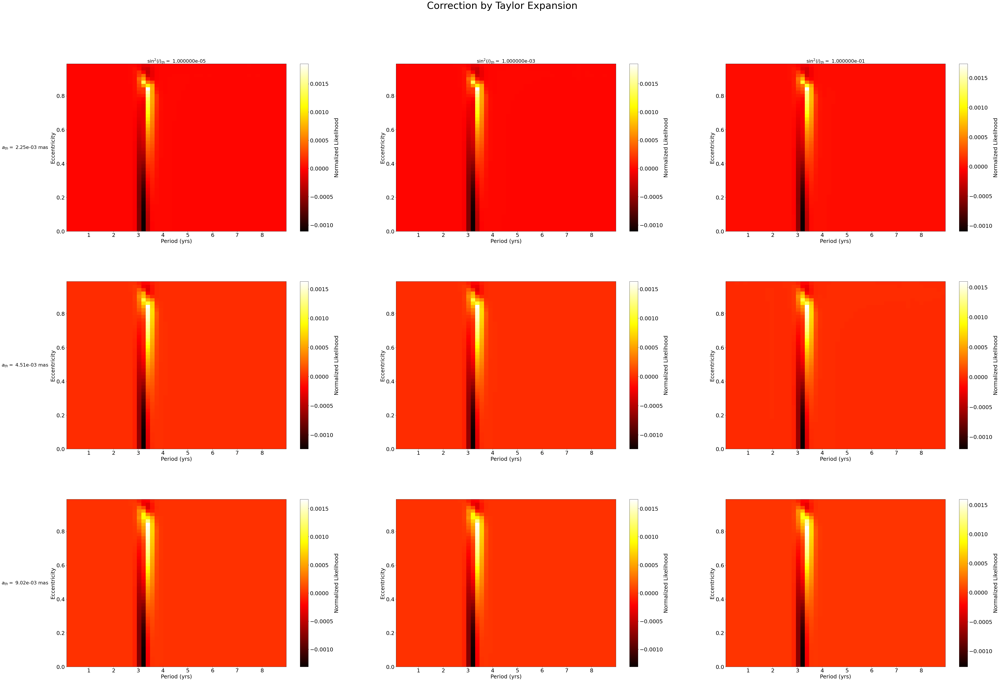

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

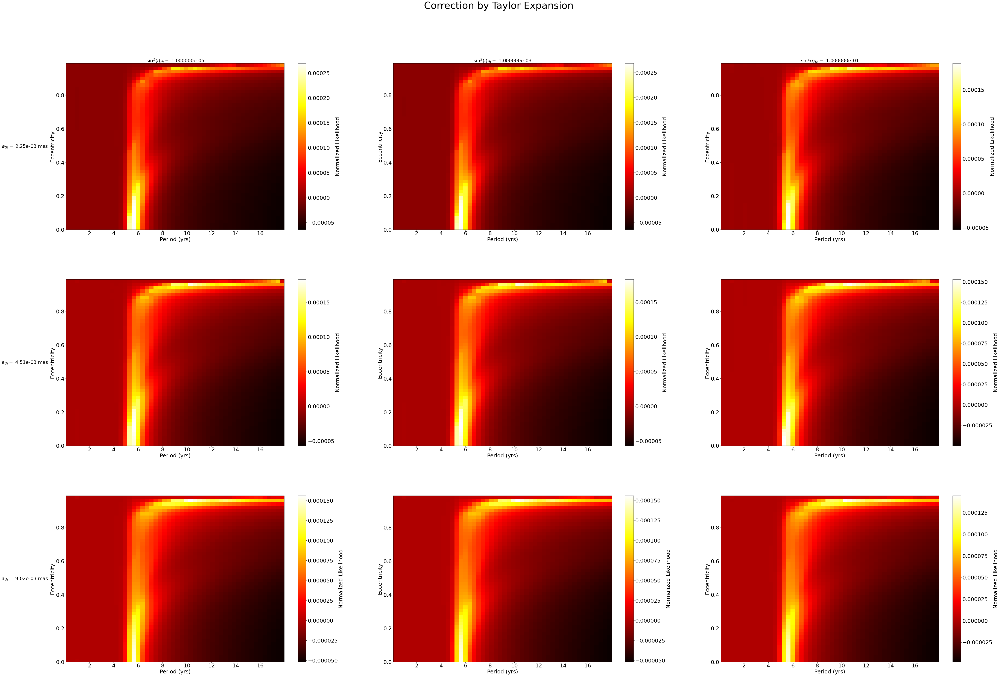

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

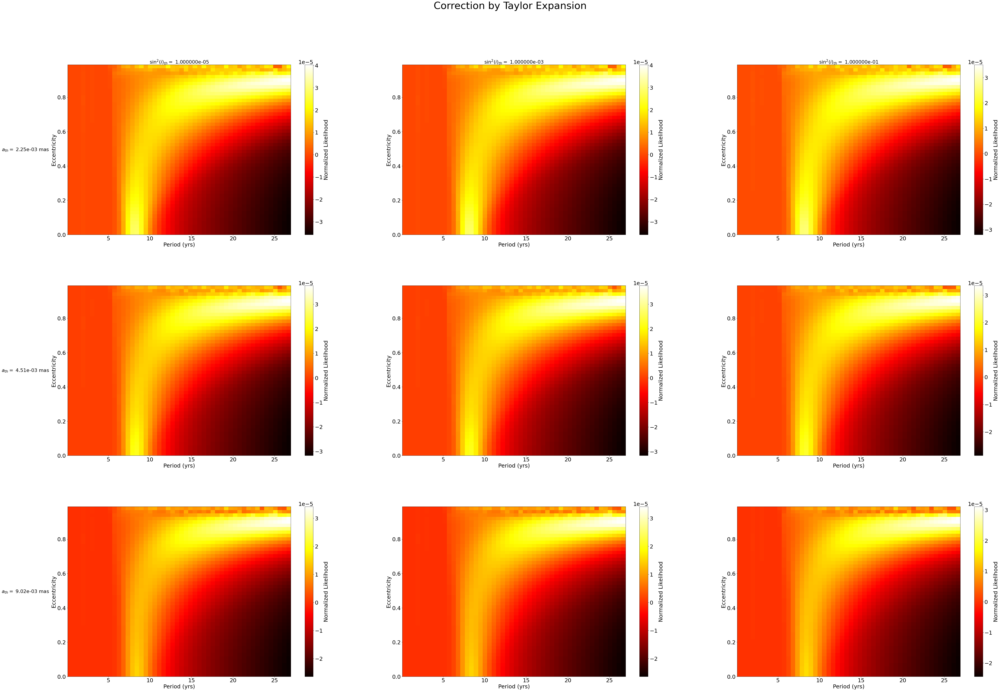

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

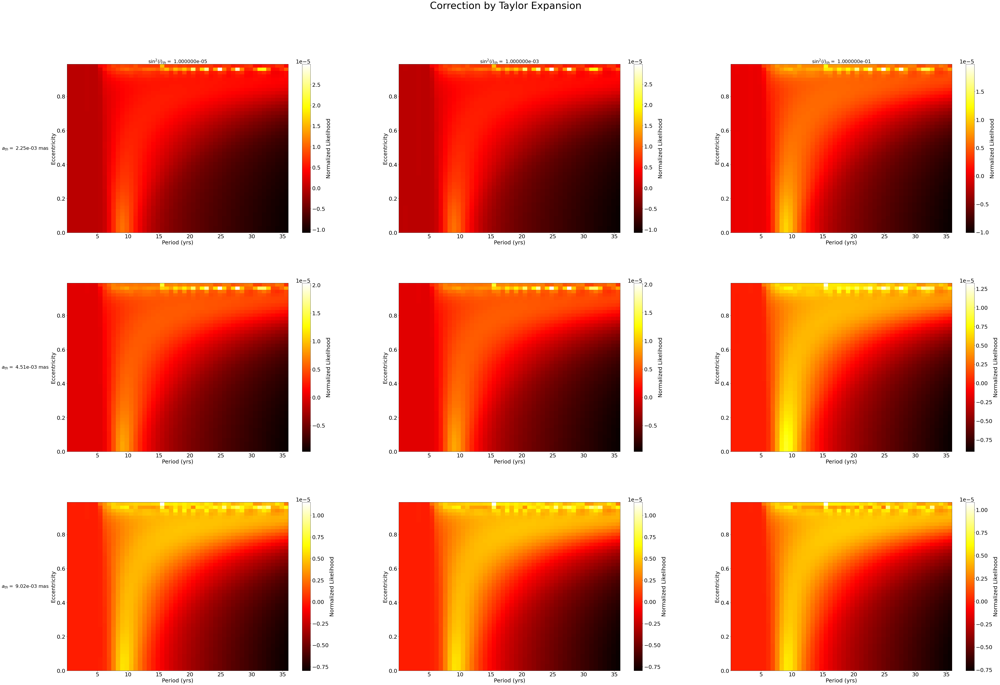

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

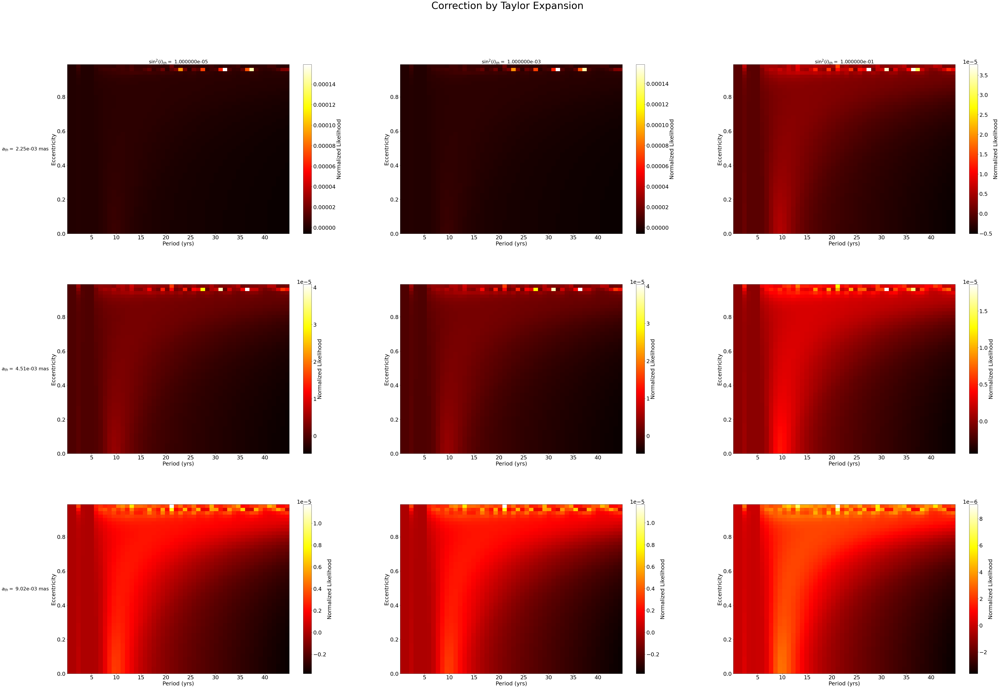

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

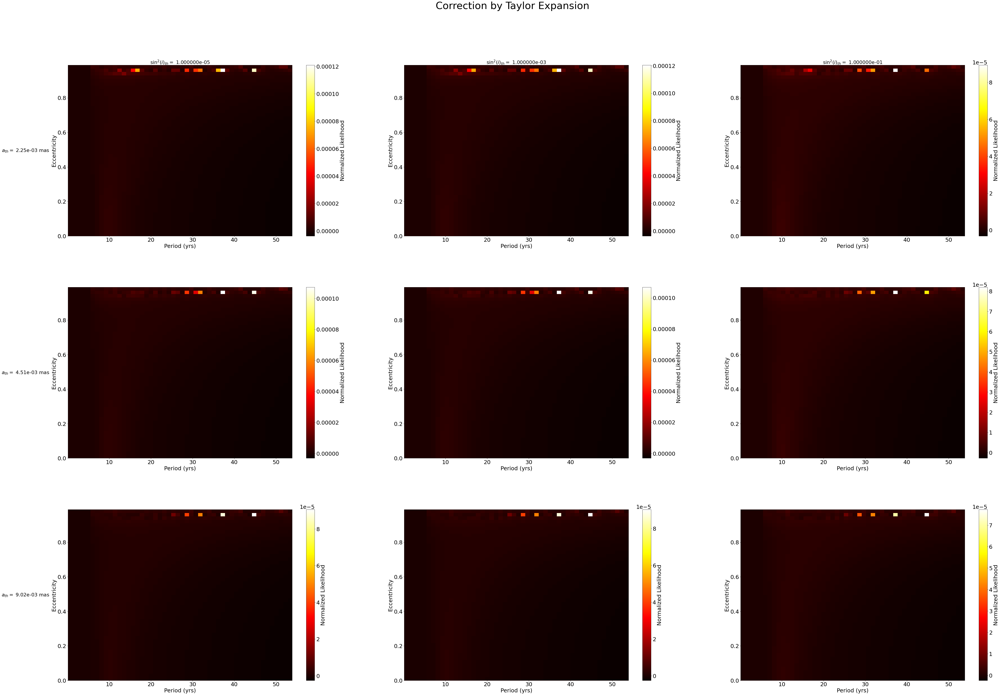

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

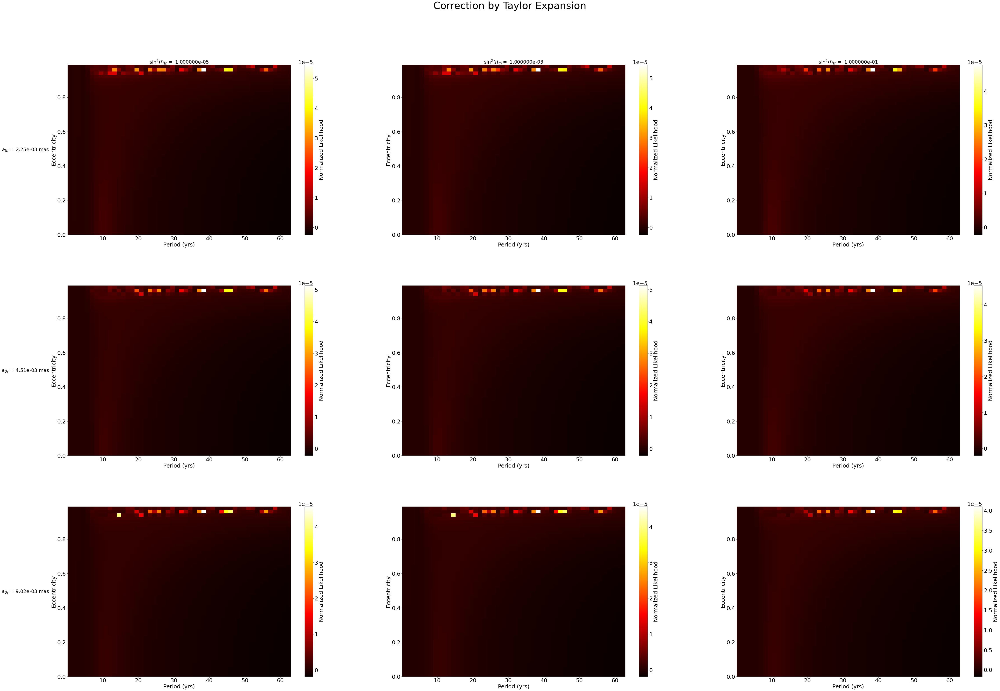

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

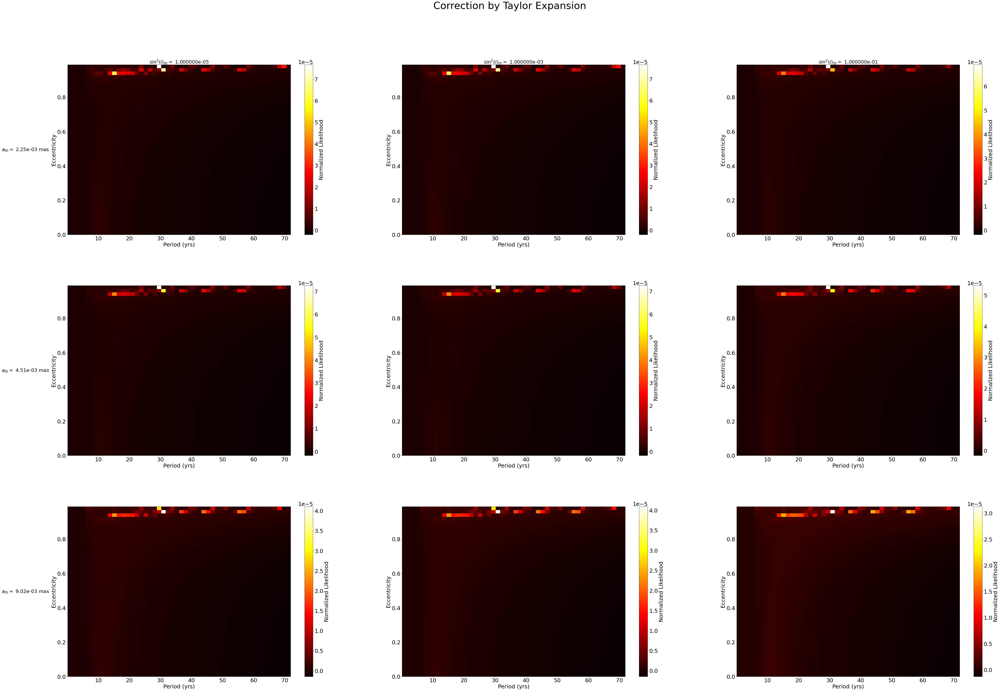

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

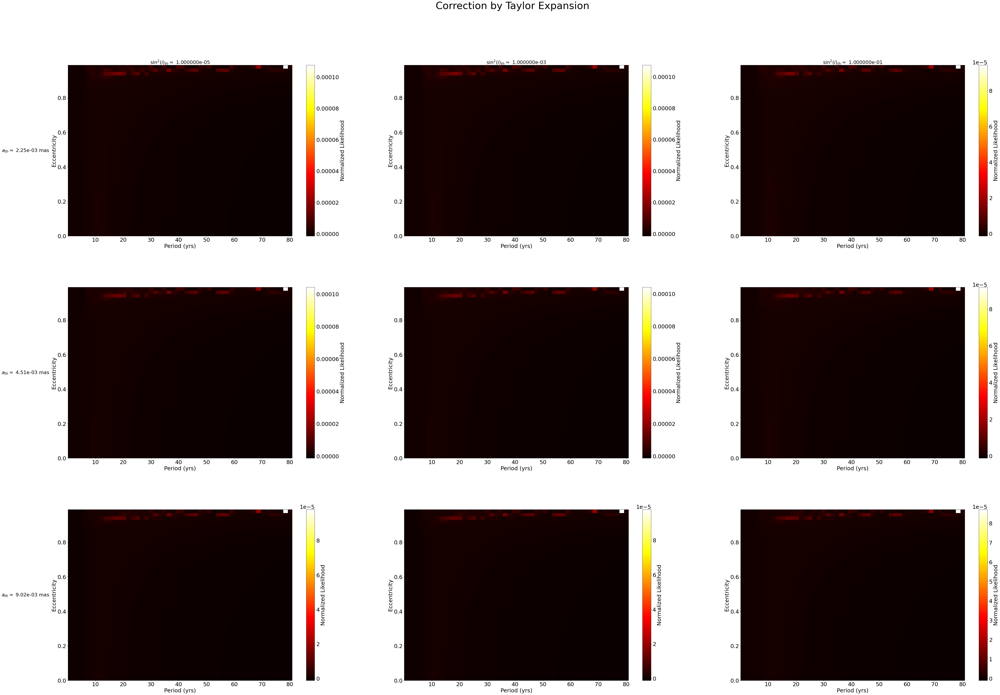

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

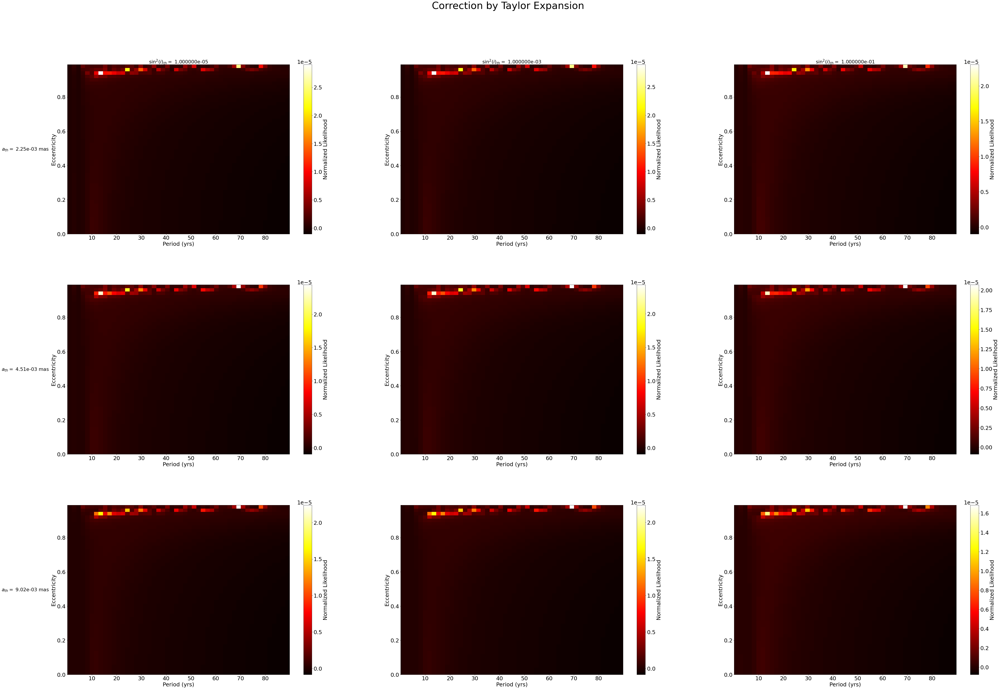

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

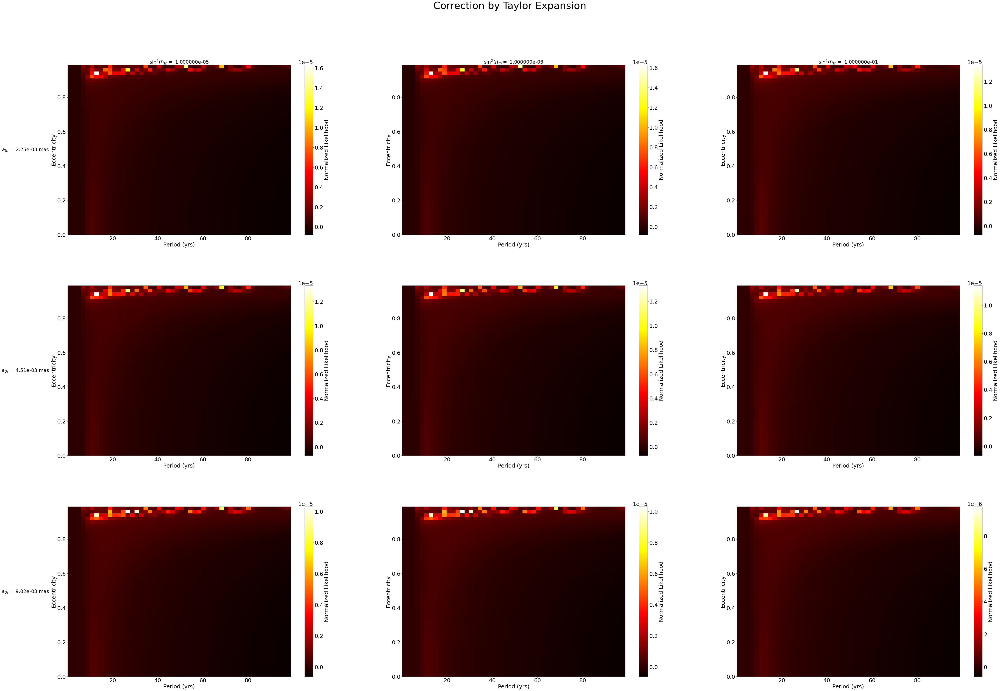

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

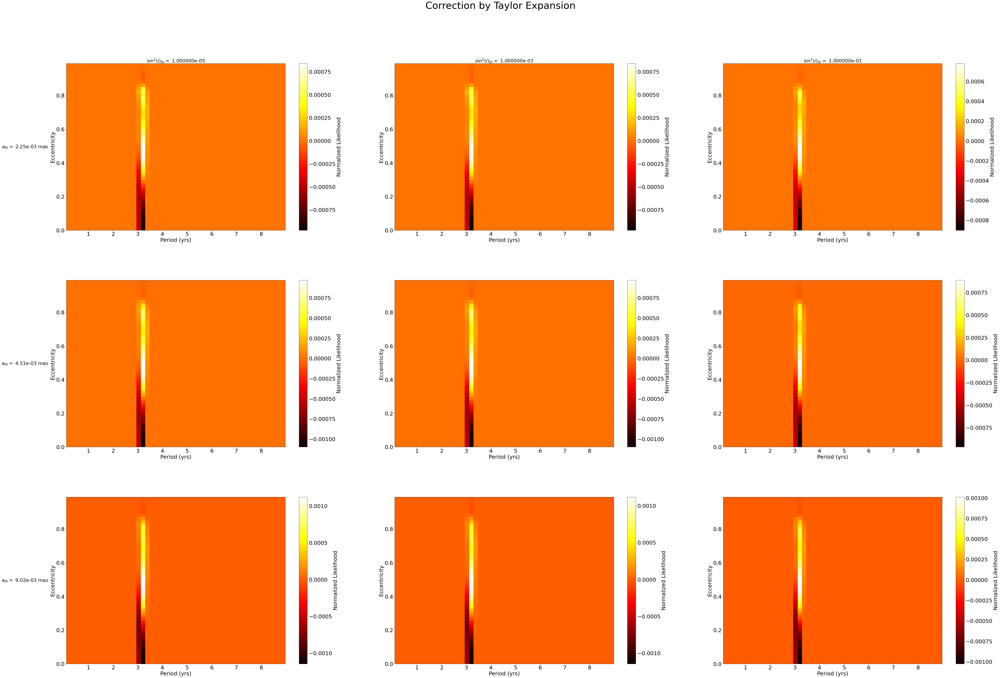

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

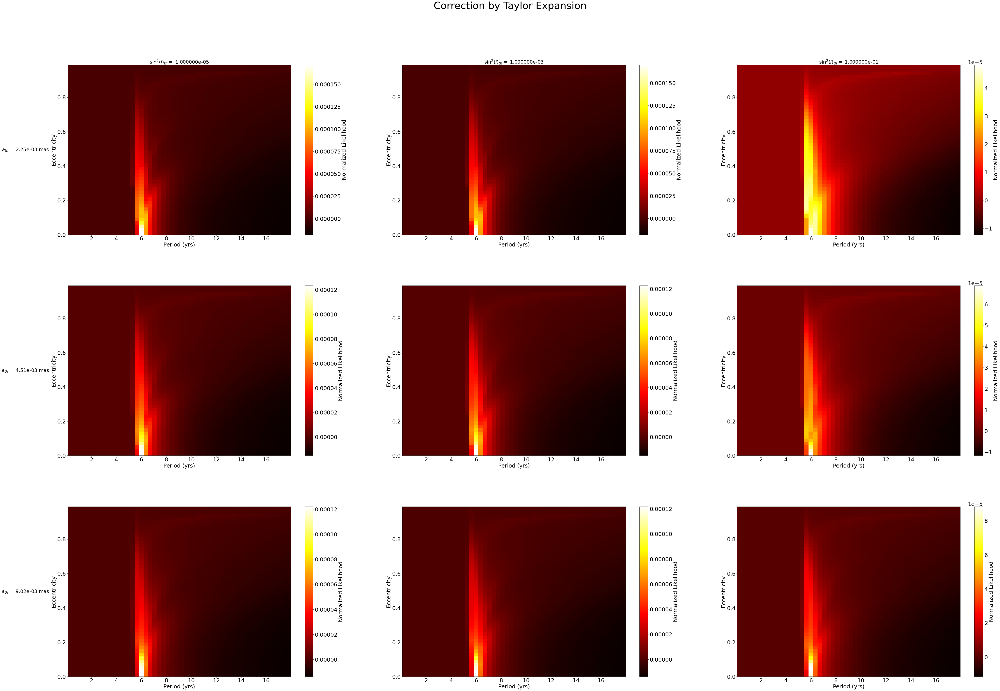

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

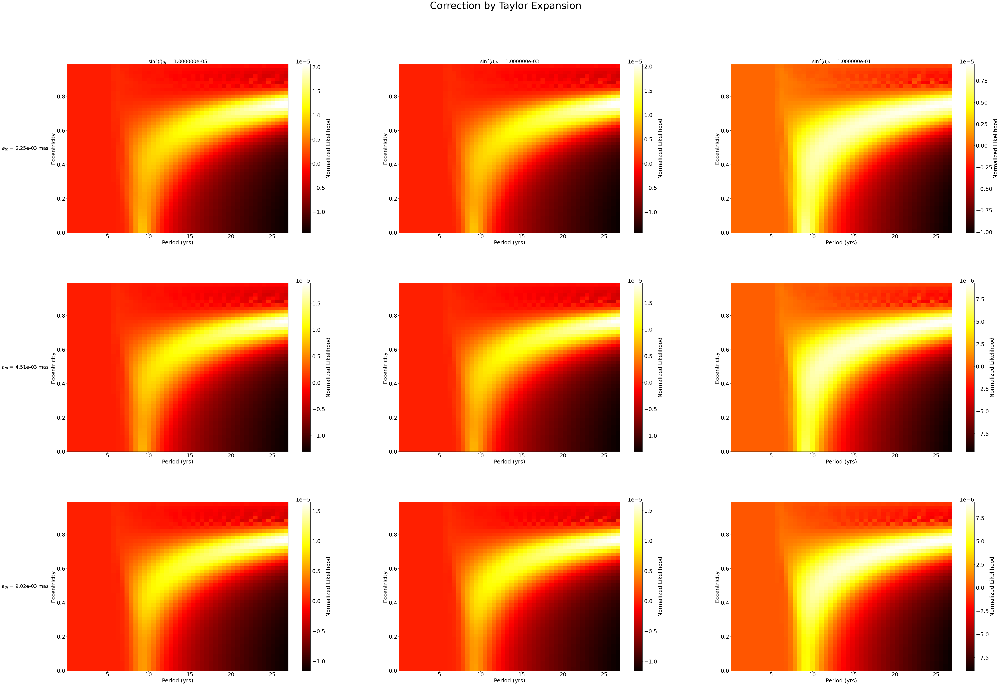

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

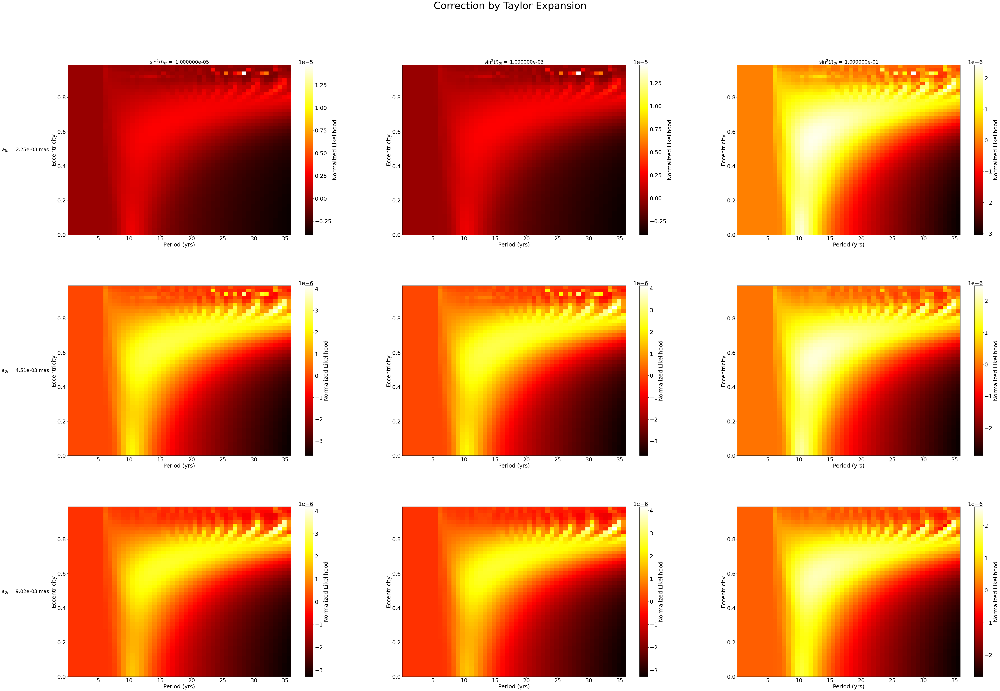

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

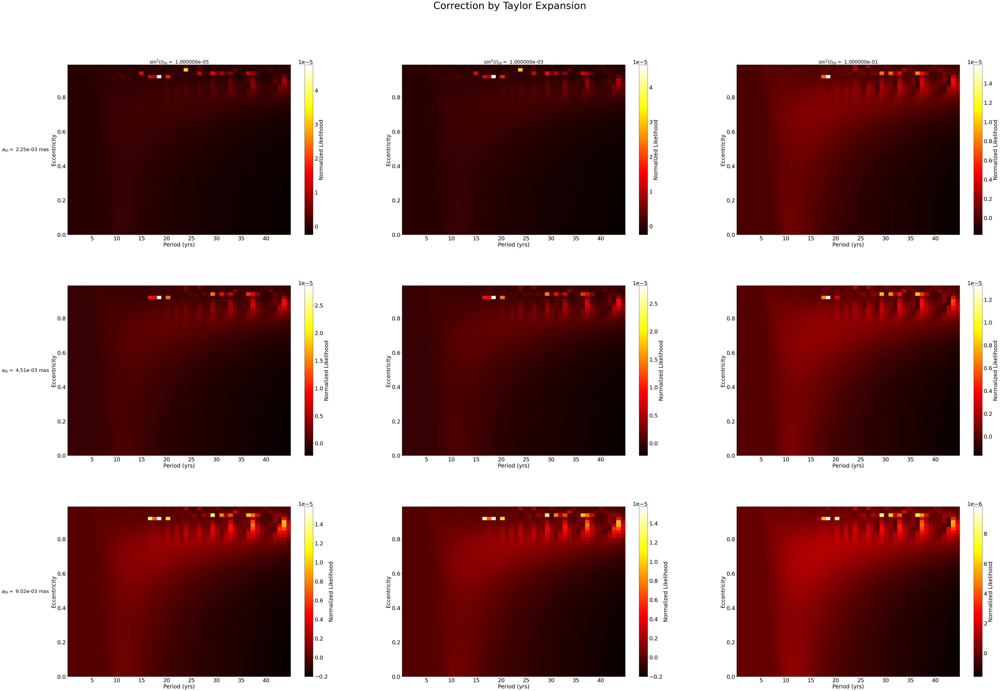

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

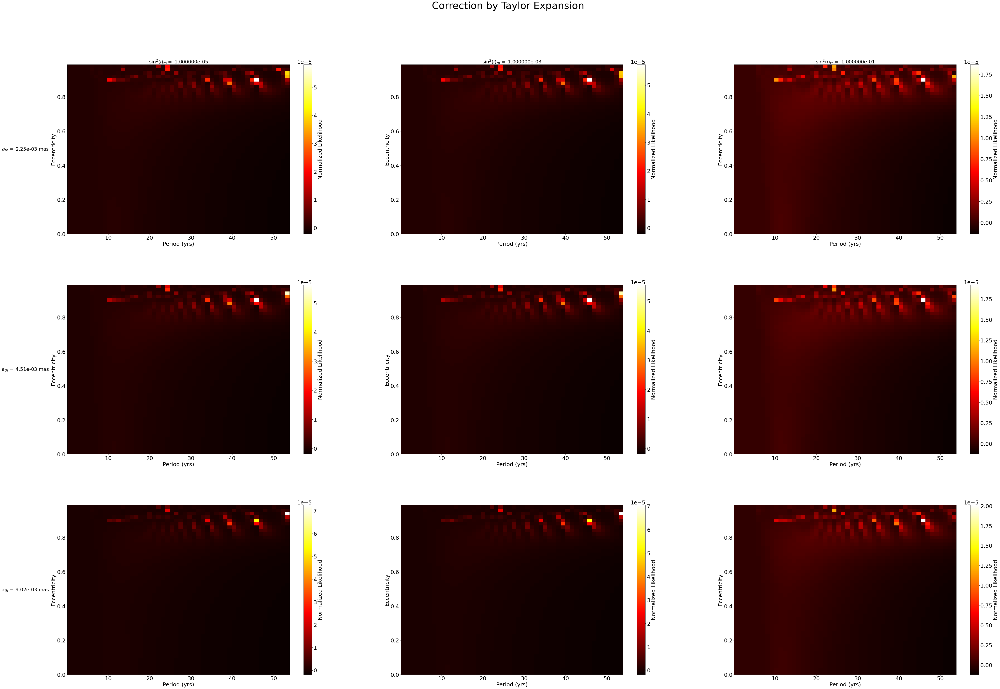

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

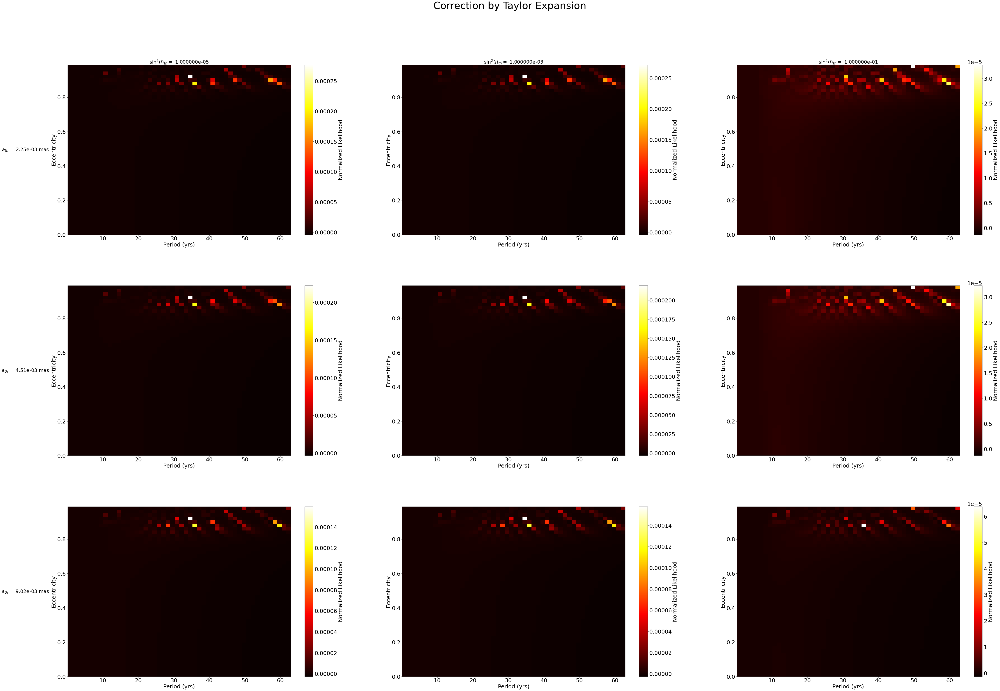

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

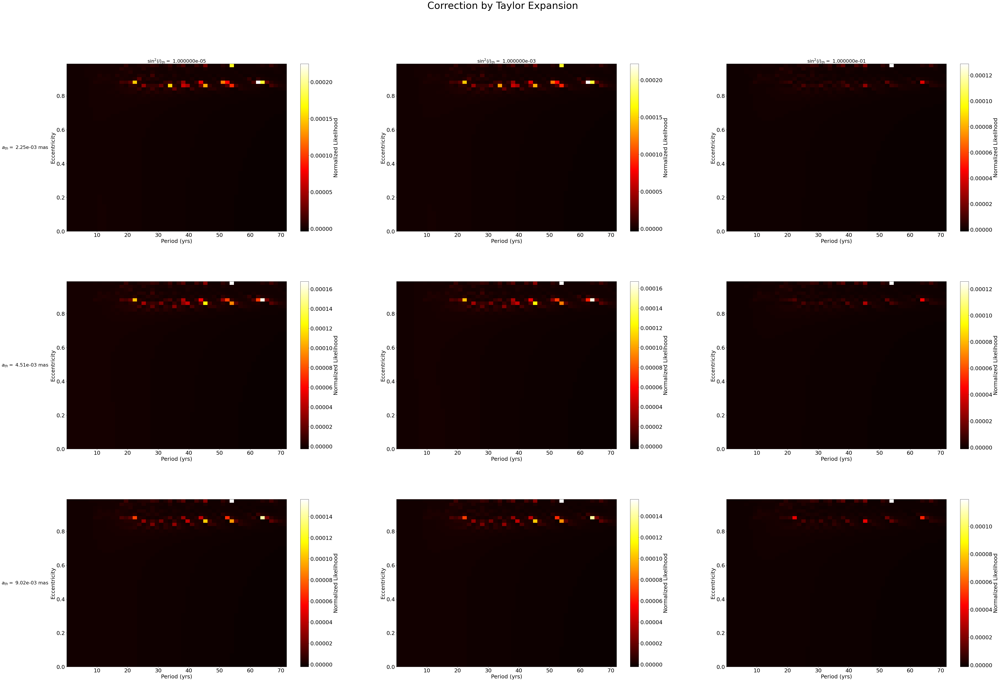

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

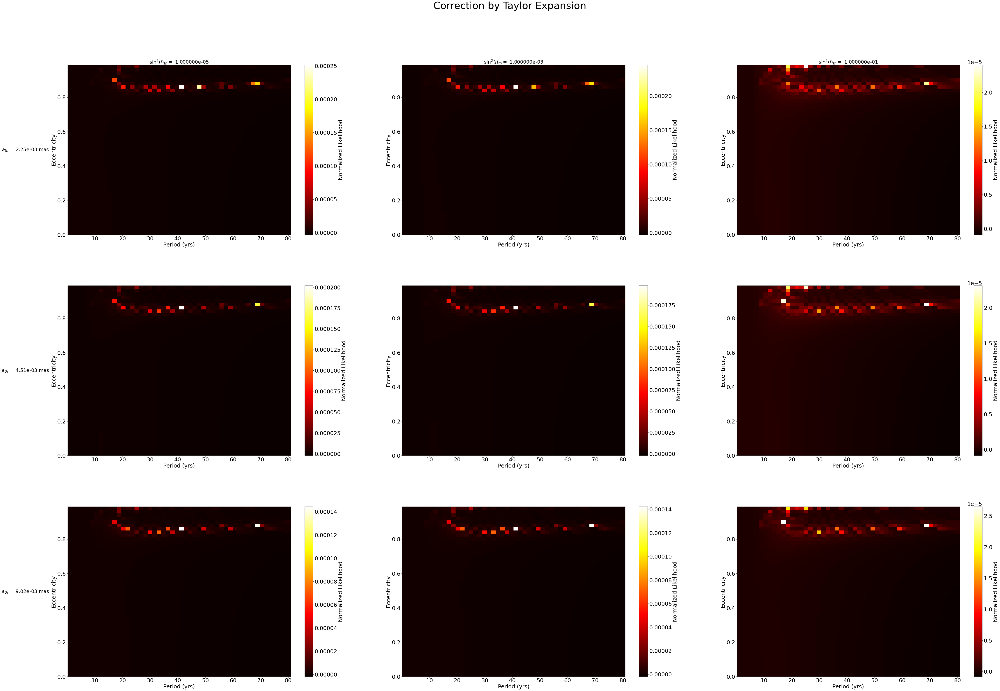

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

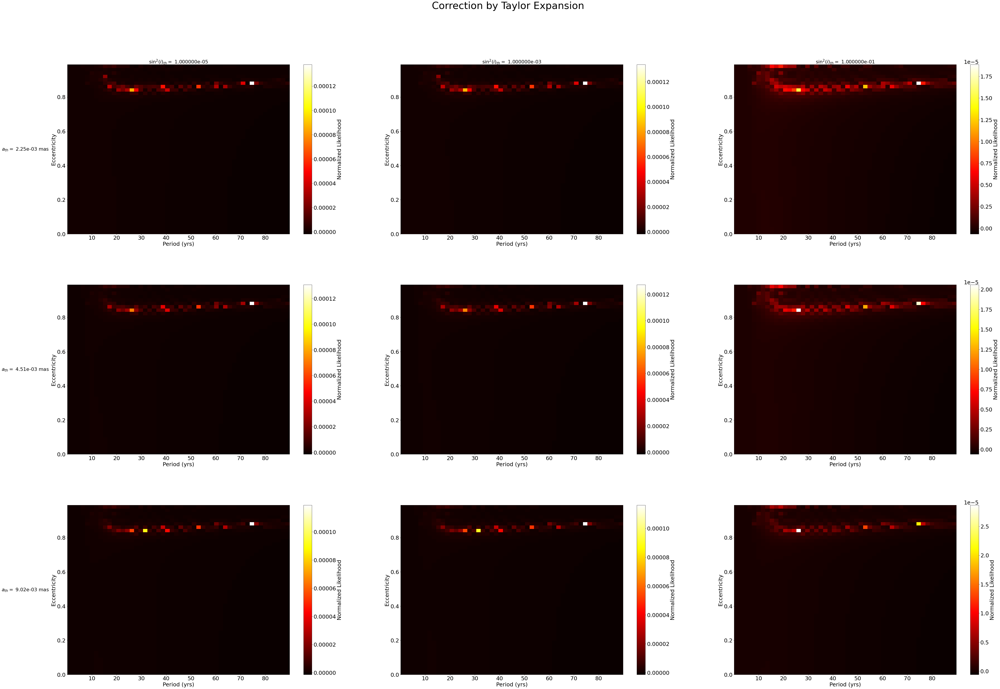

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

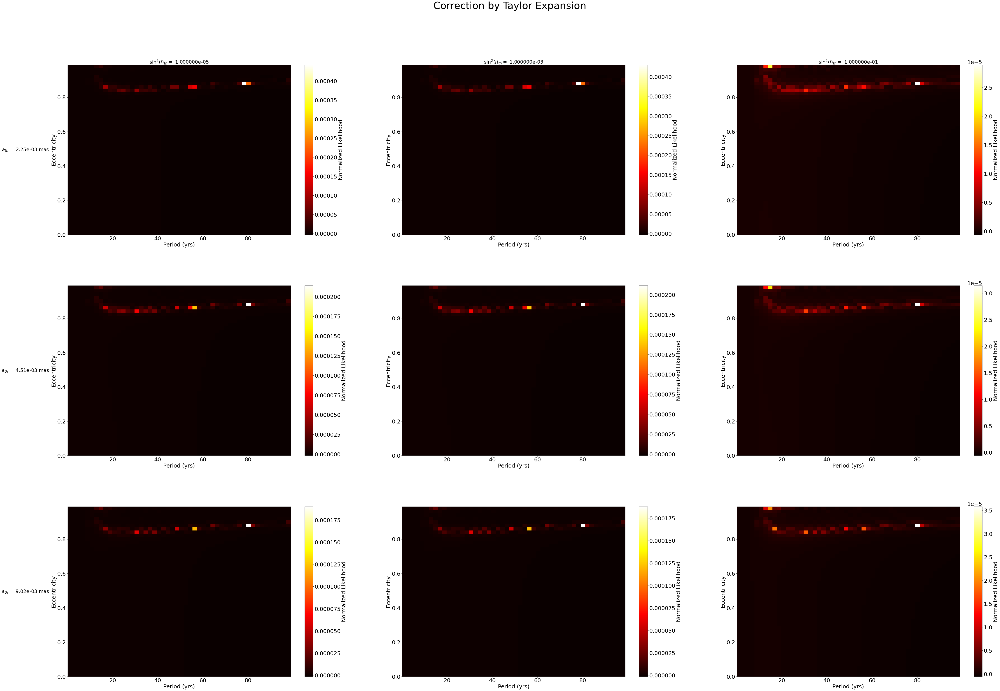

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

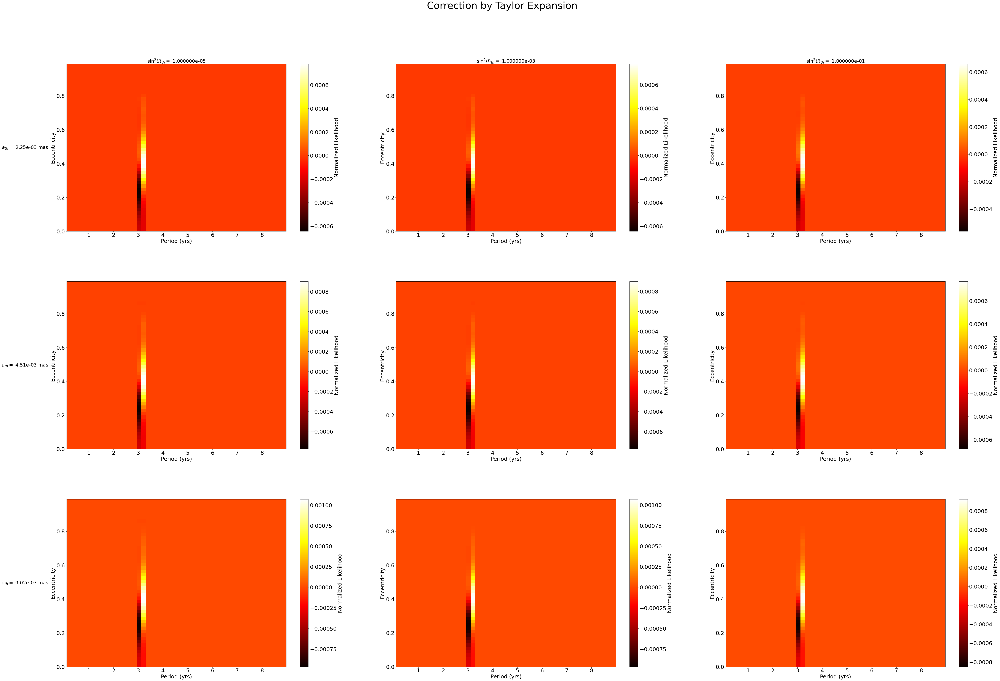

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

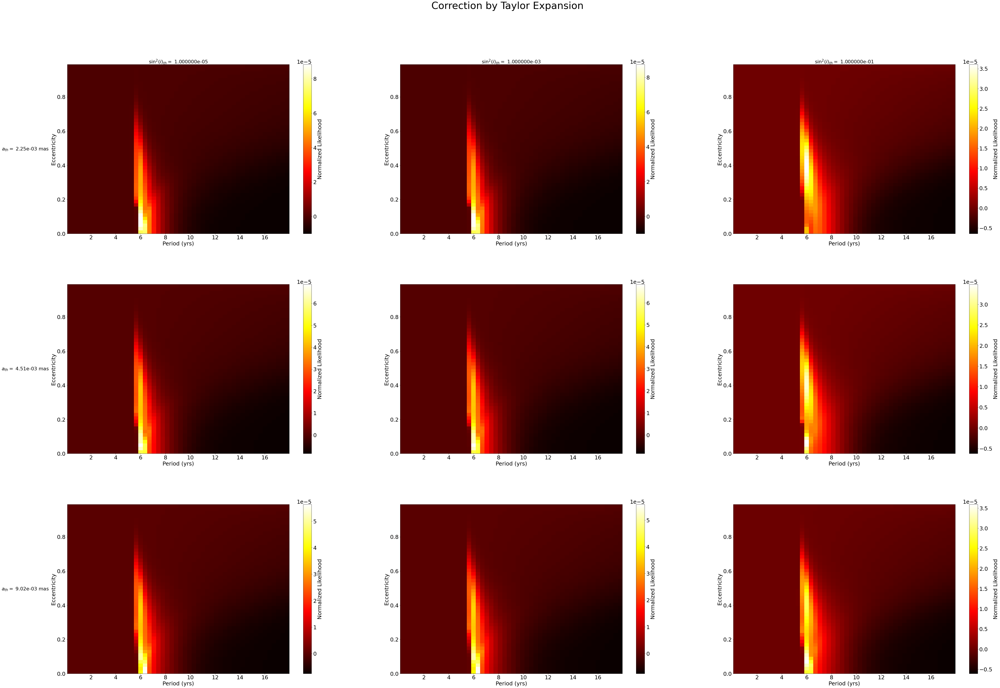

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

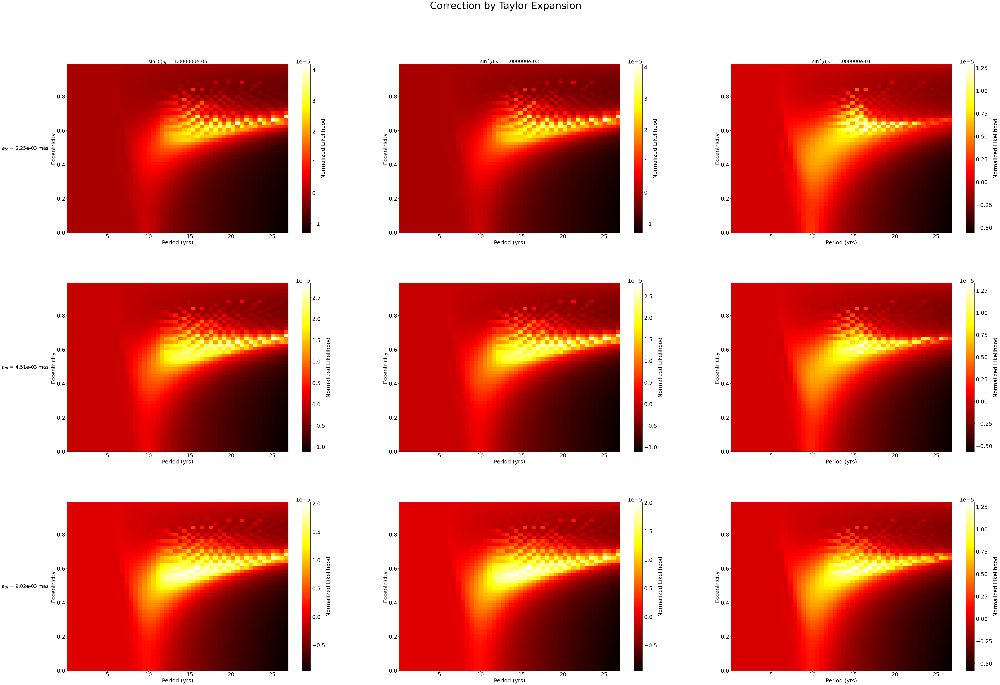

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

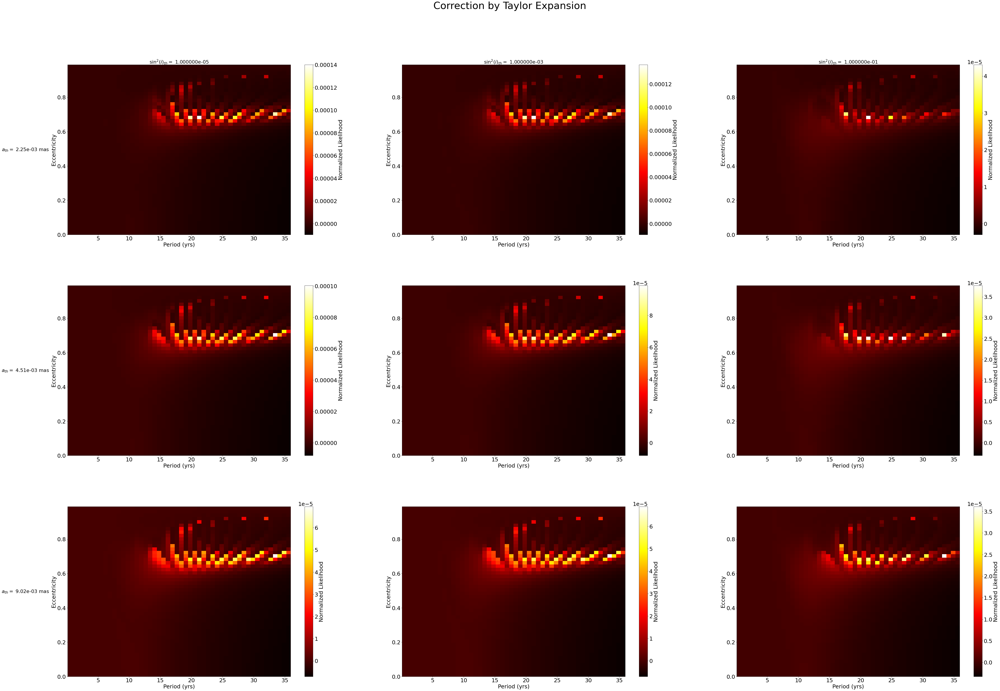

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

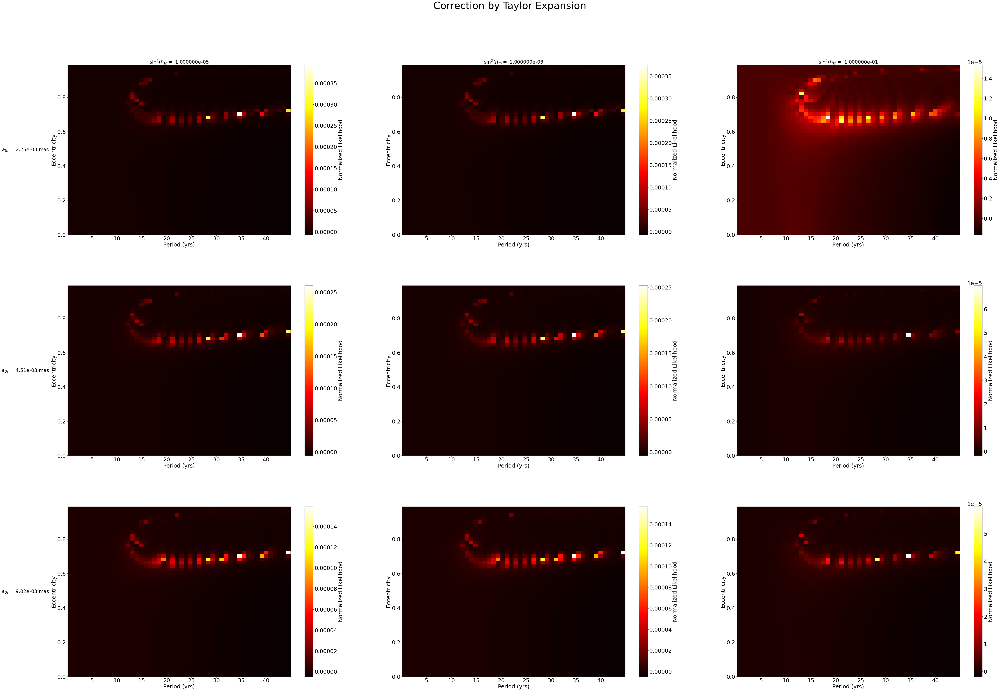

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

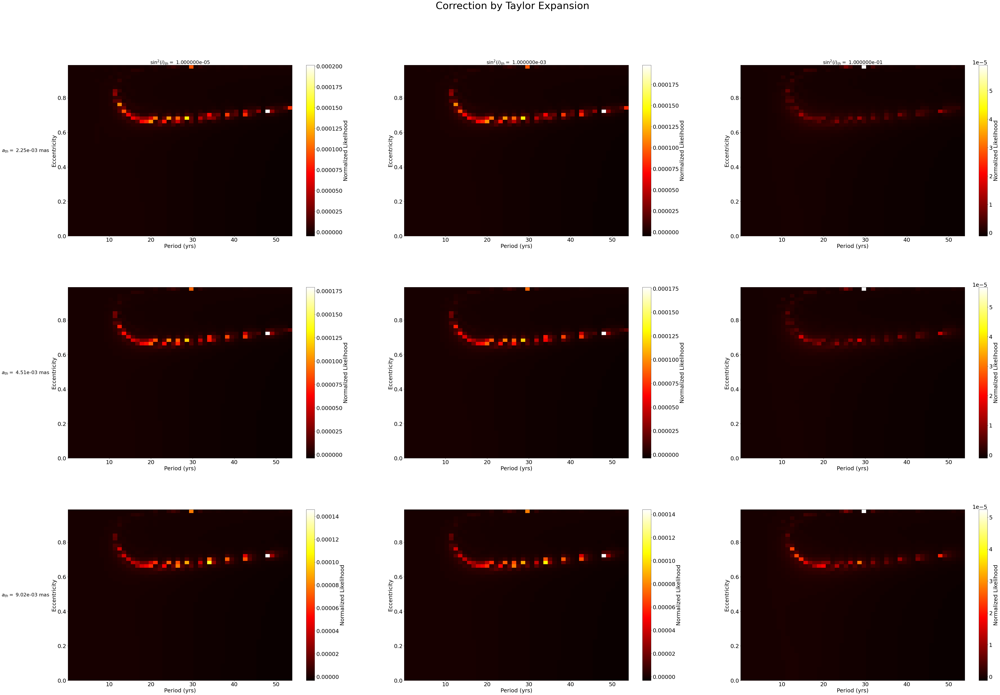

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

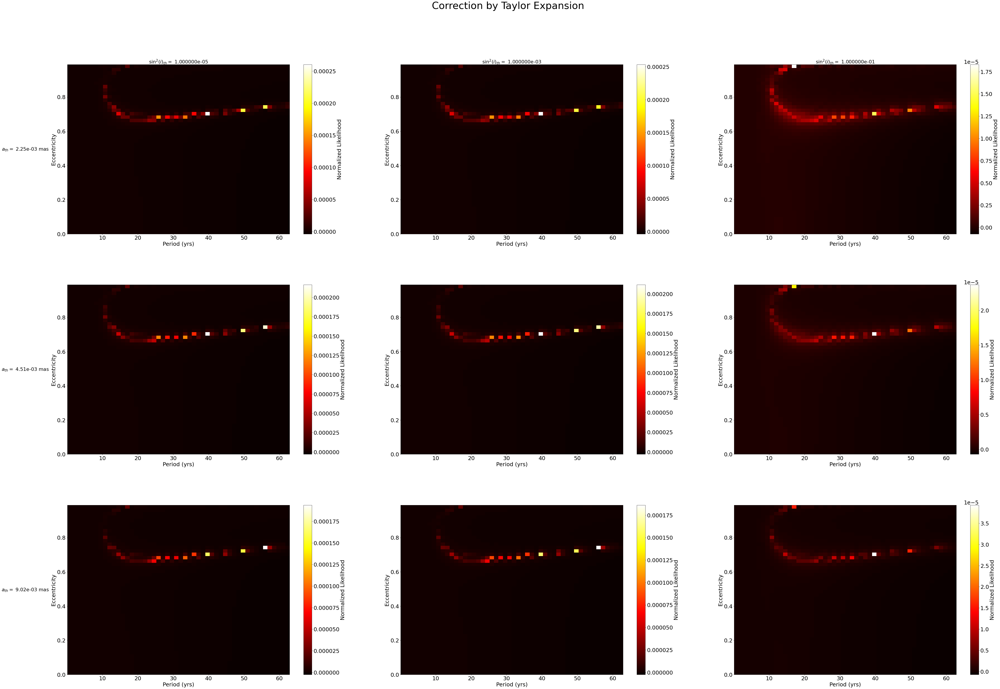

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

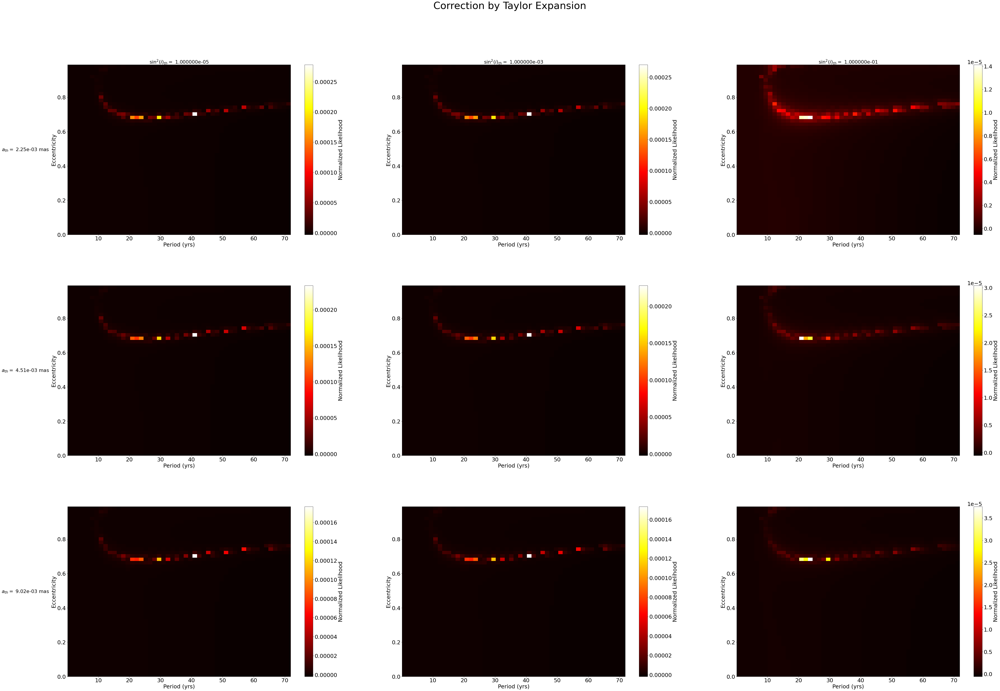

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

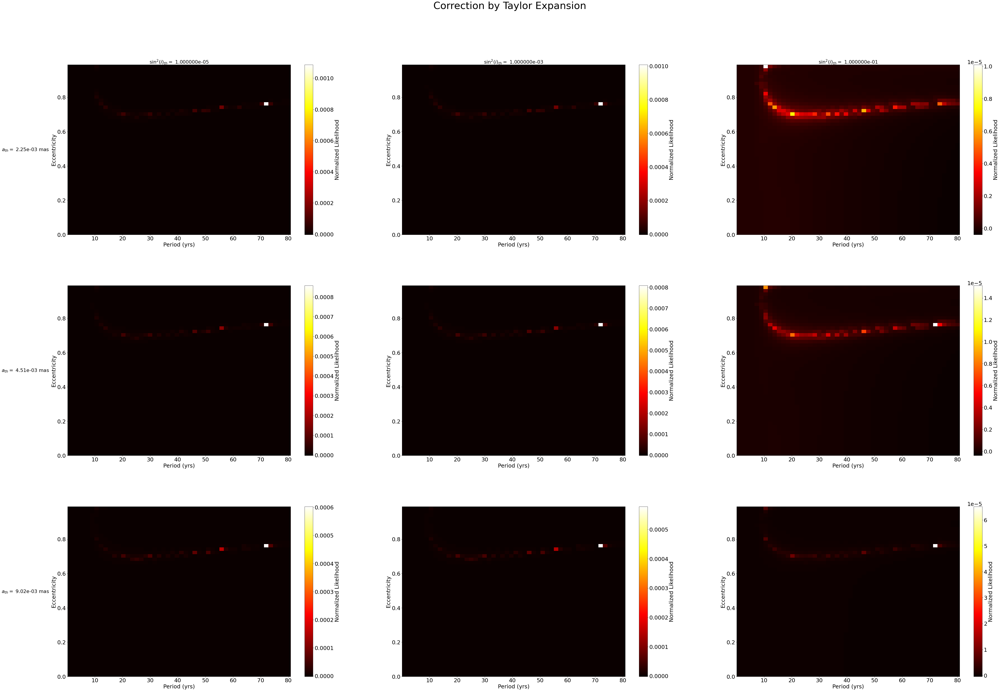

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

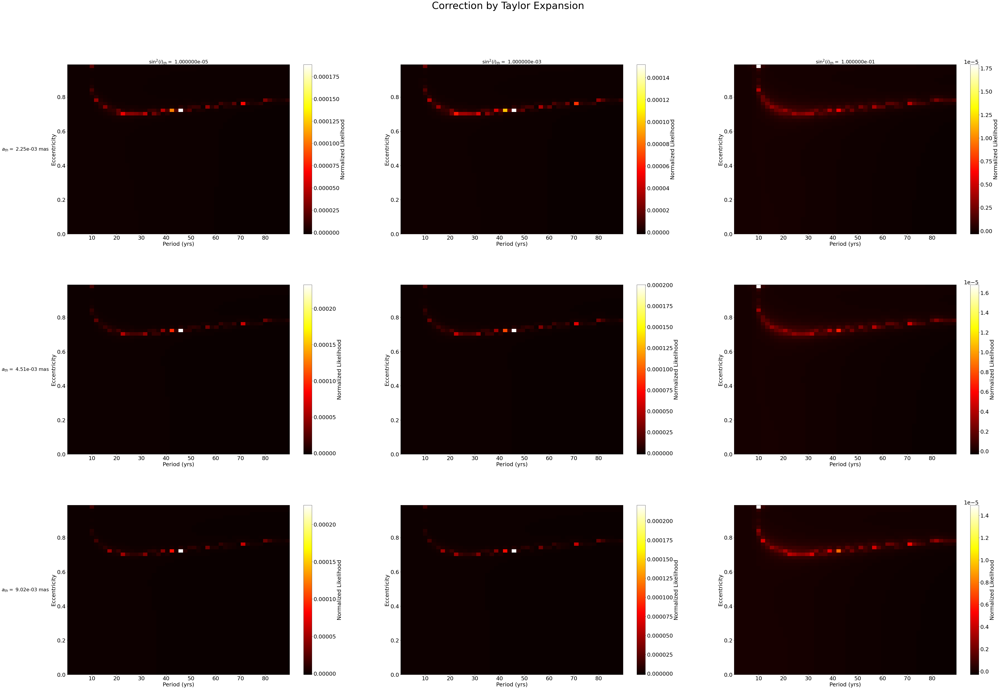

<Figure size 720x576 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

<Figure size 5760x3600 with 0 Axes>

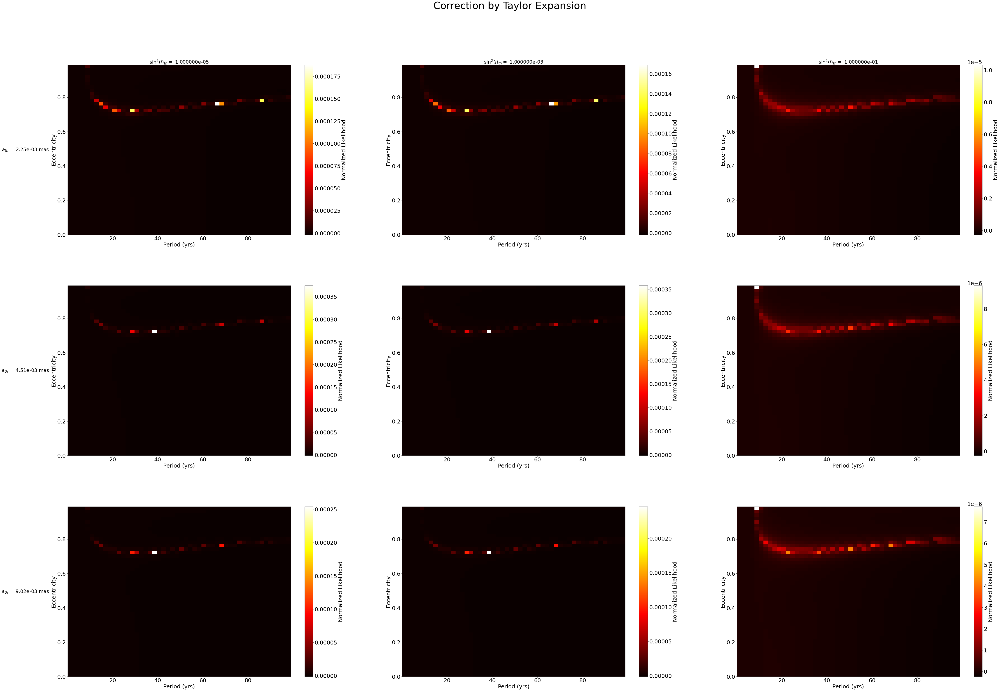

In [19]:
# compare the fitting results with different thresholds on a and sin^2i

# vary the input period as obs_base * factor at different SNR levels 
# to check the strengths of the two approaches under the approximation of Gaussian
SNR = np.array([5, 10, 15]) # set SNR = 5, 10, 15
multi_factor = np.arange(0.5, 6, 0.5)
per_input = (t[-1]-t[0])*multi_factor

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]
coef_ske5p = np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac])/sigw[np.newaxis, :]

# generate random seeds for the fixed parameters in advance
om_input = np.random.rand()*2*np.pi
Om_input = np.random.rand()*2*np.pi
cosi_input = np.random.rand()

ecc_input = np.random.rand()*0.9
tp_input = np.random.rand()*2*np.pi

noise_seed = np.random.randn(len(t))*sigw

# create an array containing various semi-major axes used to estimate the effective SNR 
a_input_test = np.arange(1e-5, 6e-3, 1e-5)

# set the number of grid points for each parameter
p_num = [50]
ecc_num = [50]
tp_num = [200]

# create a domain for the thresholds of the semi-major axis a
a_std_unc = np.median(sigw)/len(sigw)**0.5
a_th_domain = np.array([a_std_unc/2, a_std_unc, a_std_unc*2])
# create a domain for the thresholds of sin^2i
sin2i_th_domain = np.array([1e-5, 1e-3, 1e-1])

for j in range(len(SNR)):
    for i in range(len(multi_factor)):
        per = round(per_input[i], 4)
        # compute the interpolated function of the semi-major axis in terms of SNR and input period
        eff_a = modified_a(a_input_test, per, om_input, Om_input, cosi_input, tp_input, ecc_input, noise_seed, t, coef_skeleton, coef_ske5p, sigw)
        # calculate Thiele-Innes elements
        a_input = eff_a(SNR[j])
        A = a_input*(np.cos(Om_input)*np.cos(om_input) - np.sin(Om_input)*np.sin(om_input)*cosi_input)
        B = a_input*(np.sin(Om_input)*np.cos(om_input) + np.cos(Om_input)*np.sin(om_input)*cosi_input)
        F = a_input*(-np.cos(Om_input)*np.sin(om_input) - np.sin(Om_input)*np.cos(om_input)*cosi_input)
        G = a_input*(-np.sin(Om_input)*np.sin(om_input) + np.cos(Om_input)*np.cos(om_input)*cosi_input)
        X, Y = calc_XY(t, t.shape[0], tp_input, per, ecc_input)
        wobs_fake = B*X*sintheta + G*Y*sintheta + A*X*costheta + F*Y*costheta + noise_seed
    
        # set the range of period and eccentricity 
        p_range = [0.1, per*3]
        ecc_range = [0, 0.99]

        p_grid, ecc_grid, tp_grid = create_grid(p_num, ecc_num, tp_num, p_range, ecc_range)
        x, y = np.meshgrid(p_grid[0], ecc_grid[0])
    
        # define the orbits
        orbits = wobs_fake
        snr = orbits/sigw # normalized 1D measurements
        
        contour_label = [r'$3 \sigma$', r'$2 \sigma$', r'$1 \sigma$']
        
####### Maximum Likelihood Approach
        df = pd.DataFrame()
        like_ori = likedis_ori(tp_grid[0], p_grid[0], ecc_grid[0], t, coef_skeleton, snr, sigw)
        # normalize the likelihood
        normlz_like_ori = like_ori/np.sum(like_ori)
        # calculate the thresholds of confidence intervals
        levels_ori = confint(normlz_like_ori, p_grid[0], ecc_grid[0])
        best_fit_ori = np.where(normlz_like_ori == normlz_like_ori.max())
        df = df.append({'SNR':SNR[j],'a_input':a_input,'om_input':om_input,'Om_input':Om_input,'cosi_input':cosi_input,
                        'per_input':per,'ecc_input':ecc_input,'tp_input':tp_input,
                        'p_best_ori':p_grid[0][best_fit_ori[0][0]],'ecc_best_ori':ecc_grid[0][best_fit_ori[1][0]]}, ignore_index = True)
                
        
        fig, axes = plt.subplots(figsize=(10, 8))        
        im = axes.imshow(normlz_like_ori.T, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
        fig.colorbar(im, ax=axes, orientation='vertical', label='Normalized Likelihood')
        m, = axes.plot(per, ecc_input, color='royalblue', marker='o', markersize=15, label='input')
        n, = axes.plot(p_grid[0][best_fit_ori[0][0]], ecc_grid[0][best_fit_ori[1][0]], color='cyan', marker='o', markersize=15, label='best-fit')
        first_legend = axes.legend(handles=[m, n], loc=4) 
        # Add the legend manually to the current Axes.
        axes.add_artist(first_legend)
        # Add labels of contours in the legend
        C = axes.contour(x, y, normlz_like_ori.T, levels=levels_ori, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
        h = C.collections
        l = [contour_label[c] for c in range(len(contour_label))]
        axes.legend(h,l, loc=1)            
        axes.set_xlabel("Period (years)")
        axes.set_ylabel("Eccentricity")
        axes.set_title("P_input = %.2f yr (No Marginalization)" %per, fontdict={'fontsize': 25, 'fontweight': 'medium'})
        
        df.to_csv('./plots/fake_orbits/hd4747/threshold/fake4_'+str(SNR[j])+'_'+str(per)+'_ori.csv', index=False)
        plt.savefig('./plots/fake_orbits/hd4747/threshold/fake4_'+str(SNR[j])+'_'+str(per)+'_ori.pdf')
        np.savetxt('./plots/fake_orbits/hd4747/threshold/fake4_'+str(SNR[j])+'_'+str(per)+'_ori.csv', snr, delimiter=',') 

####### Marginalization without Taylor Expansion
        store_like_noexp = [[None for j in range(len(sin2i_th_domain))] for i in range(len(a_th_domain))] #store all likelihood distributions for the following subtraction
        df = pd.DataFrame()
        plt.clf()
        fig, axes = plt.subplots(len(a_th_domain), len(sin2i_th_domain), figsize=(80, 50))
        fig.subplots_adjust(left=0.15, hspace=0.3, top=0.9)
        fig.suptitle("Marginalization without Taylor Expansion", fontsize=45)
        plt.rc('font', size=25)
        plt.setp(axes.flat, xlabel='Period (yrs)', ylabel='Eccentricity')
        cols = [r'$\sin^{2}(i)_{th} =$ %e' %sin2i_th for sin2i_th in sin2i_th_domain]
        rows = [r'$a_{th} =$ %.2e mas' %(a_th*1e3) for a_th in a_th_domain]
        pad = 5 
        for ax, col in zip(axes[0], cols):
            ax.annotate(col, xy=(0.5, 1), xytext=(0, pad),
                        xycoords='axes fraction', textcoords='offset points',
                        size=22, ha='center', va='baseline')

        for ax, row in zip(axes[:,0], rows):
            ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                        xycoords=ax.yaxis.label, textcoords='offset points',
                        size=22, ha='right', va='center')
            
        for n_a, a_th in enumerate(a_th_domain):
            for n_i, sinsqi_th in enumerate(sin2i_th_domain):
                # the likelihood without/with Taylor expansion about J_0
                like_without = likedis_no_exp(tp_grid[0], p_grid[0], ecc_grid[0], t, coef_skeleton, snr, sigw, a_th, sinsqi_th)
                # normalize the likelihood
                normlz_like_without = like_without/np.sum(like_without)
                store_like_noexp[n_a][n_i] = normlz_like_without
                # calculate the thresholds of confidence intervals
                levels_without = confint(normlz_like_without, p_grid[0], ecc_grid[0])
                best_fit_without = np.where(normlz_like_without == normlz_like_without.max())
                # compute the best-fit values of a and sin^2i with the input tp
                best_a_without, best_sin2i_without = bestfit_a_sin2i(tp_input, p_grid[0][best_fit_without[0][0]], ecc_grid[0][best_fit_without[1][0]], t, coef_skeleton, snr, sigw)
                df = df.append({'SNR':SNR[j],'a_input':a_input,'a_best_noexp':best_a_without,'da_ratio_noexp':a_th/best_a_without,'om_input':om_input,'Om_input':Om_input,
                                'cosi_input':cosi_input,'sin2i_best_noexp':best_sin2i_without,'dsin2i_ratio_noexp':sinsqi_th/best_sin2i_without,
                                'per_input':per,'ecc_input':ecc_input,'tp_input':tp_input,
                                'p_best_noexp':p_grid[0][best_fit_without[0][0]],'ecc_best_noexp':ecc_grid[0][best_fit_without[1][0]]}, ignore_index = True)
                
                im2 = axes[n_a, n_i].imshow(normlz_like_without.T, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto')
                fig.colorbar(im2, ax=axes[n_a, n_i], orientation='vertical', label='Normalized Likelihood')
                m, = axes[n_a, n_i].plot(per, ecc_input, color='royalblue', marker='o', markersize=15, label='input')
                n, = axes[n_a, n_i].plot(p_grid[0][best_fit_without[0][0]], ecc_grid[0][best_fit_without[1][0]], color='cyan', marker='o', markersize=15, label='best-fit')
                first_legend = axes[n_a, n_i].legend(handles=[m, n], loc=4)
                # Add the legend manually to the current Axes.
                axes[n_a, n_i].add_artist(first_legend)
                # Add labels of contours in the legend
                C = axes[n_a, n_i].contour(x, y, normlz_like_without.T, levels=levels_without, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
                h = C.collections
                l = [contour_label[c] for c in range(len(contour_label))]
                axes[n_a, n_i].legend(h,l, loc=1)
                
                np.savetxt('./plots/fake_orbits/hd4747/threshold/fake4_'+str(SNR[j])+'_'+str(per)+'_like_noexp_'+str(round(a_th, 3))+'_'+str(sinsqi_th)+'.csv', normlz_like_without, delimiter=',') 

        df.to_csv('./plots/fake_orbits/hd4747/threshold/fake4_'+str(SNR[j])+'_'+str(per)+'_noexp.csv', index=False)
        plt.savefig('./plots/fake_orbits/hd4747/threshold/fake4_'+str(SNR[j])+'_'+str(per)+'_noexp.pdf')
    
        
####### Marginalization with Taylor Expansion
        store_like_exp = [[None for j in range(len(sin2i_th_domain))] for i in range(len(a_th_domain))] #store all likelihood distributions for the following subtraction
        df = pd.DataFrame()
        plt.clf()
        fig, axes = plt.subplots(len(a_th_domain), len(sin2i_th_domain), figsize=(80, 50))
        fig.subplots_adjust(left=0.15, hspace=0.3, top=0.9)
        fig.suptitle("Marginalization with Taylor Expansion", fontsize=45)
        plt.rc('font', size=25)
        plt.setp(axes.flat, xlabel='Period (yrs)', ylabel='Eccentricity')
        cols = [r'$\sin^{2}(i)_{th} =$ %e' %sin2i_th for sin2i_th in sin2i_th_domain]
        rows = [r'$a_{th} =$ %.2e mas' %(a_th*1e3) for a_th in a_th_domain]
        pad = 5 
        for ax, col in zip(axes[0], cols):
            ax.annotate(col, xy=(0.5, 1), xytext=(0, pad),
                        xycoords='axes fraction', textcoords='offset points',
                        size='large', ha='center', va='baseline')

        for ax, row in zip(axes[:,0], rows):
            ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                        xycoords=ax.yaxis.label, textcoords='offset points',
                        size='large', ha='right', va='center')
            
        for n_a, a_th in enumerate(a_th_domain):
            for n_i, sinsqi_th in enumerate(sin2i_th_domain):
                # the likelihood without/with Taylor expansion about J_0
                like_with, outbound = likedis_exp(tp_grid[0], p_grid[0], ecc_grid[0], t, coef_skeleton, snr, sigw, a_th, sinsqi_th)
                # normalize the likelihood
                normlz_like_with = like_with/np.sum(like_with)
                store_like_exp[n_a][n_i] = normlz_like_with
                # calculate the thresholds of confidence intervals
                levels_with = confint(normlz_like_with, p_grid[0], ecc_grid[0])
                best_fit_with = np.where(normlz_like_with == normlz_like_with.max())
                # compute the best-fit values of a and sin^2i with the input tp
                best_a_with, best_sin2i_with = bestfit_a_sin2i(tp_input, p_grid[0][best_fit_with[0][0]], ecc_grid[0][best_fit_with[1][0]], t, coef_skeleton, snr, sigw)
                df = df.append({'SNR':SNR[j],'a_input':a_input,'a_best_exp':best_a_with,'da_ratio_exp':a_th/best_a_with,'om_input':om_input,'Om_input':Om_input,
                                'cosi_input':cosi_input,'sin2i_best_exp':best_sin2i_with,'dsin2i_ratio_exp':sinsqi_th/best_sin2i_with,
                                'per_input':per,'ecc_input':ecc_input,'tp_input':tp_input,
                                'p_best_exp':p_grid[0][best_fit_with[0][0]],'ecc_best_exp':ecc_grid[0][best_fit_with[1][0]],'outbound#':outbound}, ignore_index = True)
                
                im3 = axes[n_a, n_i].imshow(normlz_like_with.T, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
                fig.colorbar(im3, ax=axes[n_a, n_i], orientation='vertical', label='Normalized Likelihood')
                m, = axes[n_a, n_i].plot(per, ecc_input, color='royalblue', marker='o', markersize=15, label='input')
                n, = axes[n_a, n_i].plot(p_grid[0][best_fit_with[0][0]], ecc_grid[0][best_fit_with[1][0]], color='cyan', marker='o', markersize=15, label='best-fit')
                first_legend = axes[n_a, n_i].legend(handles=[m, n], loc=4)        
                # Add the legend manually to the current Axes.
                axes[n_a, n_i].add_artist(first_legend)
                # Add labels of contours in the legend
                C = axes[n_a, n_i].contour(x, y, normlz_like_with.T, levels=levels_with, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
                h = C.collections
                l = [contour_label[c] for c in range(len(contour_label))]
                axes[n_a, n_i].legend(h,l, loc=1)      
                
                np.savetxt('./plots/fake_orbits/hd4747/threshold/fake4_'+str(SNR[j])+'_'+str(per)+'_like_exp_'+str(round(a_th, 3))+'_'+str(sinsqi_th)+'.csv', normlz_like_with, delimiter=',') 

                           
        df.to_csv('./plots/fake_orbits/hd4747/threshold/fake4_'+str(SNR[j])+'_'+str(per)+'_exp.csv', index=False)
        plt.savefig('./plots/fake_orbits/hd4747/threshold/fake4_'+str(SNR[j])+'_'+str(per)+'_exp.pdf')

####### Contribution of Taylor Expansion
        plt.clf()
        fig, axes = plt.subplots(len(a_th_domain), len(sin2i_th_domain), figsize=(80, 50))
        fig.subplots_adjust(left=0.15, hspace=0.3, top=0.9)
        fig.suptitle("Correction by Taylor Expansion", fontsize=45)
        plt.rc('font', size=25)
        plt.setp(axes.flat, xlabel='Period (yrs)', ylabel='Eccentricity')
        cols = [r'$\sin^{2}(i)_{th} =$ %e' %sin2i_th for sin2i_th in sin2i_th_domain]
        rows = [r'$a_{th} =$ %.2e mas' %(a_th*1e3) for a_th in a_th_domain]
        pad = 5 
        for ax, col in zip(axes[0], cols):
            ax.annotate(col, xy=(0.5, 1), xytext=(0, pad),
                        xycoords='axes fraction', textcoords='offset points',
                        size=22, ha='center', va='baseline')

        for ax, row in zip(axes[:,0], rows):
            ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                        xycoords=ax.yaxis.label, textcoords='offset points',
                        size=22, ha='right', va='center')
        for n_a, a_th in enumerate(a_th_domain):
            for n_i, sinsqi_th in enumerate(sin2i_th_domain):
                # subtract the distribution without Taylor expansion from that with Taylor expansion
                residual = store_like_exp[n_a][n_i] - store_like_noexp[n_a][n_i]       
                
                im4 = axes[n_a, n_i].imshow(residual.T, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
                fig.colorbar(im4, ax=axes[n_a, n_i], orientation='vertical', label='Normalized Likelihood')
                
                np.savetxt('./plots/fake_orbits/hd4747/threshold/fake4_'+str(SNR[j])+'_'+str(per)+'_like_resid_'+str(round(a_th, 3))+'_'+str(sinsqi_th)+'.csv', residual, delimiter=',') 
        
        plt.savefig('./plots/fake_orbits/hd4747/threshold/fake4_'+str(SNR[j])+'_'+str(per)+'_resid.pdf')

                                    
#         np.savetxt('./plots/fake_orbits/hd1237/taylor_exp/fake6.5_'+str(SNR[j])+'_'+str(per)+'_snr.csv', snr, delimiter=',') 
#         np.savetxt('./plots/fake_orbits/hd1237/taylor_exp/fake6.5_'+str(SNR[j])+'_'+str(per)+'_like_ori.csv', like_ori, delimiter=',') 
#         np.savetxt('./plots/fake_orbits/hd1237/taylor_exp/fake6.5_'+str(SNR[j])+'_'+str(per)+'_like_no_exp.csv', like_without, delimiter=',')
#         np.savetxt('./plots/fake_orbits/hd1237/taylor_exp/fake6.5_'+str(SNR[j])+'_'+str(per)+'_like_w_exp.csv', like_with, delimiter=',')
            

In [25]:
# compare the posterior likelihood distributions with the max-like approach, 
# with the marginalization approach WITHOUT Taylor expansion (w/ thresholds), 
# with the marginalization approach WITH Taylor expansion (w/ thresholds),
# and then plot the difference caused by the correction 

# vary the input period as obs_base * factor at different SNR levels 
# to check the strengths of the two approaches under the approximation of Gaussian
SNR = np.array([5, 10, 15]) # set SNR = 5, 10, 15
multi_factor = np.arange(0.5, 3.5, 0.5)
per_input = (t[-1]-t[0])*multi_factor

coef_skeleton= np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac, 
                          sintheta, sintheta, costheta, costheta])/sigw[np.newaxis, :]
coef_ske5p = np.asarray([sintheta, costheta, t*sintheta, t*costheta, parfac])/sigw[np.newaxis, :]

# generate random seeds for the fixed parameters in advance
om_input = np.random.rand()*2*np.pi
Om_input = np.random.rand()*2*np.pi
cosi_input = np.random.rand()

ecc_input = np.random.rand()*0.9
tp_input = np.random.rand()*2*np.pi

noise_seed = np.random.randn(len(t))*sigw

# create an array containing various semi-major axes used to estimate the effective SNR 
a_input_test = np.arange(1e-5, 6e-2, 1e-5)

# set the number of grid points for each parameter
p_num = [50]
ecc_num = [50]
tp_num = [200]

# set the thresholds of the semi-major axis a and sin^2i
a_std_unc = np.median(sigw)/len(sigw)**0.5
a_th = a_std_unc/2
sin2i_th = 1e-5

for j in range(len(SNR)):
    # container of the likelihood distributions of marginalization approach with/without Taylor expansion for all periods,
    # which will be multiplied by 1/p prior
    super_noexp_flat = []
    super_exp_flat = []
    super_noexp_logunia = []
    super_exp_logunia = []
    
    df = pd.DataFrame()
    plt.clf()
    fig, axes = plt.subplots(len(multi_factor), 4, figsize=(100, 110))
    fig.subplots_adjust(left=0.15, hspace=0.3, top=0.85)
#     fig.suptitle("Comparison between Maximum-Likelihood Approach and Marginalizaiton Approach", fontsize=55)
    plt.rc('font', size=50)
    plt.setp(axes.flat, xlabel='Period (yrs)', ylabel='Eccentricity')
    cols = ['ML Approach', 'Marginalization without Taylor Expansion', 'Marginalization with Taylor Expansion', '2nd-order Correction']
    rows = [r'$P =$ %.3f yrs' %per for per in per_input]
    pad = 5 
    for ax, col in zip(axes[0], cols):
        ax.annotate(col, xy=(0.5, 1), xytext=(0, pad),
                    xycoords='axes fraction', textcoords='offset points',
                    size=50, ha='center', va='baseline')

    for ax, row in zip(axes[:,0], rows):
        ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                    xycoords=ax.yaxis.label, textcoords='offset points',
                    size=50, ha='right', va='center')
    for i in range(len(multi_factor)):
        per = round(per_input[i], 4)
        # compute the interpolated function of the semi-major axis in terms of SNR and input period
        eff_a = modified_a(a_input_test, per, om_input, Om_input, cosi_input, tp_input, ecc_input, noise_seed, t, coef_skeleton, coef_ske5p, sigw)
        # calculate Thiele-Innes elements
        a_input = eff_a(SNR[j])
        A = a_input*(np.cos(Om_input)*np.cos(om_input) - np.sin(Om_input)*np.sin(om_input)*cosi_input)
        B = a_input*(np.sin(Om_input)*np.cos(om_input) + np.cos(Om_input)*np.sin(om_input)*cosi_input)
        F = a_input*(-np.cos(Om_input)*np.sin(om_input) - np.sin(Om_input)*np.cos(om_input)*cosi_input)
        G = a_input*(-np.sin(Om_input)*np.sin(om_input) + np.cos(Om_input)*np.cos(om_input)*cosi_input)
        X, Y = calc_XY(t, t.shape[0], tp_input, per, ecc_input)
        wobs_fake = B*X*sintheta + G*Y*sintheta + A*X*costheta + F*Y*costheta + noise_seed
    
        # set the range of period and eccentricity 
        p_range = [0.1, per*3]
        ecc_range = [0, 0.99]

        p_grid, ecc_grid, tp_grid = create_grid(p_num, ecc_num, tp_num, p_range, ecc_range)
        x, y = np.meshgrid(p_grid[0], ecc_grid[0])
    
        # define the orbits
        orbits = wobs_fake
        snr = orbits/sigw # normalized 1D measurements
        
        contour_label = [r'$3 \sigma$', r'$2 \sigma$', r'$1 \sigma$']
        
        # the likelihood marginalized over tp
        like_ori, like_without, like_with, like_without_logunia, like_with_logunia = taylor_likelihood_logunia(tp_grid[0], p_grid[0], ecc_grid[0], t, coef_skeleton, snr, sigw, a_th, sin2i_th)
        
        # store the likelihood with/without Taylor expansion for the next plot
        super_noexp_flat.append(like_without)
        super_exp_flat.append(like_with)
        super_noexp_logunia.append(like_without_logunia)
        super_exp_logunia.append(like_with_logunia)
        
        # normalize the likelihood
        normlz_like_ori = like_ori/np.sum(like_ori)
        normlz_like_without = like_without/np.sum(like_without)
        normlz_like_with = like_with/np.sum(like_with)
        
        # calculate the thresholds of confidence intervals
        levels_ori = confint(normlz_like_ori, p_grid[0], ecc_grid[0])
        levels_without = confint(normlz_like_without, p_grid[0], ecc_grid[0])
        levels_with = confint(normlz_like_with, p_grid[0], ecc_grid[0])

        best_fit_ori = np.where(normlz_like_ori == normlz_like_ori.max())
        best_fit_without = np.where(normlz_like_without == normlz_like_without.max())
        best_fit_with = np.where(normlz_like_with == normlz_like_with.max())
        
        best_a_without, best_sin2i_without = bestfit_a_sin2i(tp_input, p_grid[0][best_fit_without[0][0]], ecc_grid[0][best_fit_without[1][0]], t, coef_skeleton, snr, sigw)
        best_a_with, best_sin2i_with = bestfit_a_sin2i(tp_input, p_grid[0][best_fit_with[0][0]], ecc_grid[0][best_fit_with[1][0]], t, coef_skeleton, snr, sigw)
        
        df = df.append({'SNR':SNR[j],'a_input':a_input,'a_best_noexp':best_a_without,'a_best_exp':best_a_with,'om_input':om_input,'Om_input':Om_input,
                        'cosi_input':cosi_input,'sin2i_best_noexp':best_sin2i_without,'sin2i_best_exp':best_sin2i_with,
                        'per_input':per,'ecc_input':ecc_input,'tp_input':tp_input,
                        'p_best_ori':p_grid[0][best_fit_ori[0][0]],'ecc_best_ori':ecc_grid[0][best_fit_ori[1][0]],
                        'p_best_noexp':p_grid[0][best_fit_without[0][0]],'ecc_best_noexp':ecc_grid[0][best_fit_without[1][0]], 
                        'p_best_exp':p_grid[0][best_fit_with[0][0]],'ecc_best_exp':ecc_grid[0][best_fit_with[1][0]]}, ignore_index = True)
       
        ####### Maximum Likelihood Approach    
        im1 = axes[i, 0].imshow(normlz_like_ori.T, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
        fig.colorbar(im1, ax=axes[i, 0], orientation='vertical', label='Probability')
        m, = axes[i, 0].plot(per, ecc_input, color='royalblue', marker='o', markersize=25, label='input')
        n, = axes[i, 0].plot(p_grid[0][best_fit_ori[0][0]], ecc_grid[0][best_fit_ori[1][0]], color='cyan', marker='o', markersize=25, label='best-fit')
        first_legend = axes[i, 0].legend(handles=[m, n], loc=4) 
        # Add the legend manually to the current Axes.
        axes[i, 0].add_artist(first_legend)
        # Add labels of contours in the legend
        C = axes[i, 0].contour(x, y, normlz_like_ori.T, levels=levels_ori, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
        h = C.collections
        l = [contour_label[c] for c in range(len(contour_label))]
        axes[i, 0].legend(h,l, loc=1)            
        
        np.savetxt('./plots/fake_orbits/hd109749/final/fake16_'+str(SNR[j])+'_'+str(per)+'_like_ori.csv', normlz_like_ori, delimiter=',') 

        ####### Marginalization without Taylor Expansion
        im2 = axes[i, 1].imshow(normlz_like_without.T, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto')
        fig.colorbar(im2, ax=axes[i, 1], orientation='vertical', label='Probability')
        m, = axes[i, 1].plot(per, ecc_input, color='royalblue', marker='o', markersize=25, label='input')
        n, = axes[i, 1].plot(p_grid[0][best_fit_without[0][0]], ecc_grid[0][best_fit_without[1][0]], color='cyan', marker='o', markersize=25, label='best-fit')
        first_legend = axes[i, 1].legend(handles=[m, n], loc=4)
        # Add the legend manually to the current Axes.
        axes[i, 1].add_artist(first_legend)
        # Add labels of contours in the legend
        C = axes[i, 1].contour(x, y, normlz_like_without.T, levels=levels_without, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
        h = C.collections
        l = [contour_label[c] for c in range(len(contour_label))]
        axes[i, 1].legend(h,l, loc=1)
                
        np.savetxt('./plots/fake_orbits/hd109749/final/fake16_'+str(SNR[j])+'_'+str(per)+'_like_noexp.csv', normlz_like_without, delimiter=',') 
        
        ####### Marginalization with Taylor Expansion
        im3 = axes[i, 2].imshow(normlz_like_with.T, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
        fig.colorbar(im3, ax=axes[i, 2], orientation='vertical', label='Probability')
        m, = axes[i, 2].plot(per, ecc_input, color='royalblue', marker='o', markersize=25, label='input')
        n, = axes[i, 2].plot(p_grid[0][best_fit_with[0][0]], ecc_grid[0][best_fit_with[1][0]], color='cyan', marker='o', markersize=25, label='best-fit')
        first_legend = axes[i, 2].legend(handles=[m, n], loc=4)        
        # Add the legend manually to the current Axes.
        axes[i, 2].add_artist(first_legend)
        # Add labels of contours in the legend
        C = axes[i, 2].contour(x, y, normlz_like_with.T, levels=levels_with, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
        h = C.collections
        l = [contour_label[c] for c in range(len(contour_label))]
        axes[i, 2].legend(h,l, loc=1)      
                
        np.savetxt('./plots/fake_orbits/hd109749/final/fake16_'+str(SNR[j])+'_'+str(per)+'_like_exp.csv', normlz_like_with, delimiter=',') 

        ####### Contribution of Taylor Expansion
        residual = normlz_like_with - normlz_like_without
        im4 = axes[i, 3].imshow(residual.T, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
        fig.colorbar(im4, ax=axes[i, 3], orientation='vertical', label='Probability')
                
        np.savetxt('./plots/fake_orbits/hd109749/final/fake16_'+str(SNR[j])+'_'+str(per)+'_like_resid.csv', residual, delimiter=',') 
    
    fig.tight_layout()
    df.to_csv('./plots/fake_orbits/hd109749/final/fake16_'+str(SNR[j])+'_fitpar.csv', index=False)
    plt.savefig('./plots/fake_orbits/hd109749/final/fake16_'+str(SNR[j])+'_compare.pdf')

####
####Check the log-uniform priors of p
    plt.clf()
    fig, axes = plt.subplots(len(multi_factor), 6, figsize=(210, 110))
    fig.subplots_adjust(left=0.15, hspace=0.3, top=0.9)
    plt.rc('font', size=50)
    plt.setp(axes.flat, xlabel='Period (yrs)', ylabel='Eccentricity')
    cols = ['Flat priors of P, no Taylor expansion', 'Flat priors of P, with Taylor expansion', '2nd-order Correction', 'Log-uniform priors of P, no Taylor expansion', 'Log-uniform priors of P, with Taylor expansion', '2nd-order Correction for 1/p']
    rows = [r'$P =$ %.3f yrs' %per for per in per_input]
    pad = 5 
    for ax, col in zip(axes[0], cols):
        ax.annotate(col, xy=(0.5, 1), xytext=(0, pad),
                    xycoords='axes fraction', textcoords='offset points',
                    size=50, ha='center', va='baseline')

    for ax, row in zip(axes[:,0], rows):
        ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                    xycoords=ax.yaxis.label, textcoords='offset points',
                    size=50, ha='right', va='center')
    for i in range(len(multi_factor)):
        per = round(per_input[i], 4)
        # set the range of period and eccentricity 
        p_range = [0.1, per*3]
        ecc_range = [0, 0.99]
        p_grid, ecc_grid, tp_grid = create_grid(p_num, ecc_num, tp_num, p_range, ecc_range)
        x, y = np.meshgrid(p_grid[0], ecc_grid[0])
        
        contour_label = [r'$3 \sigma$', r'$2 \sigma$', r'$1 \sigma$']
        
        like_noexp_flat = super_noexp_flat[i].T
        like_exp_flat = super_exp_flat[i].T
        like_noexp_loguni = like_noexp_flat/p_grid[0]
        like_exp_loguni = like_exp_flat/p_grid[0]
        
        # normalize the likelihood
        norm_noexp_flat = like_noexp_flat/np.sum(like_noexp_flat)
        norm_exp_flat = like_exp_flat/np.sum(like_exp_flat)
        norm_noexp_loguni = like_noexp_loguni/np.sum(like_noexp_loguni)
        norm_exp_loguni = like_exp_loguni/np.sum(like_exp_loguni)
        
        # calculate the thresholds of confidence intervals
        levels_noexp_flat = confint(norm_noexp_flat, p_grid[0], ecc_grid[0])
        levels_exp_flat = confint(norm_exp_flat, p_grid[0], ecc_grid[0])
        levels_noexp_loguni = confint(norm_noexp_loguni, p_grid[0], ecc_grid[0])
        levels_exp_loguni = confint(norm_exp_loguni, p_grid[0], ecc_grid[0])

        bestfit_noexp_flat = np.where(norm_noexp_flat == norm_noexp_flat.max())
        bestfit_exp_flat = np.where(norm_exp_flat == norm_exp_flat.max())
        bestfit_noexp_loguni = np.where(norm_noexp_loguni == norm_noexp_loguni.max())
        bestfit_exp_loguni = np.where(norm_exp_loguni == norm_exp_loguni.max())
        
        # no Taylor expansion, flat
        im1 = axes[i, 0].imshow(norm_noexp_flat, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
        fig.colorbar(im1, ax=axes[i, 0], orientation='vertical', label='Probability')
        m, = axes[i, 0].plot(per, ecc_input, color='royalblue', marker='o', markersize=25, label='input')
        n, = axes[i, 0].plot(p_grid[0][bestfit_noexp_flat[1][0]], ecc_grid[0][bestfit_noexp_flat[0][0]], color='cyan', marker='o', markersize=25, label='best-fit')
        first_legend = axes[i, 0].legend(handles=[m, n], loc=4) 
        # Add the legend manually to the current Axes.
        axes[i, 0].add_artist(first_legend)
        # Add labels of contours in the legend
        C = axes[i, 0].contour(x, y, norm_noexp_flat, levels=levels_noexp_flat, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
        h = C.collections
        l = [contour_label[c] for c in range(len(contour_label))]
        axes[i, 0].legend(h,l, loc=1)
        
        # with Taylor expansion, flat
        im2 = axes[i, 1].imshow(norm_exp_flat, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto')
        fig.colorbar(im2, ax=axes[i, 1], orientation='vertical', label='Probability')
        m, = axes[i, 1].plot(per, ecc_input, color='royalblue', marker='o', markersize=25, label='input')
        n, = axes[i, 1].plot(p_grid[0][bestfit_exp_flat[1][0]], ecc_grid[0][bestfit_exp_flat[0][0]], color='cyan', marker='o', markersize=25, label='best-fit')
        first_legend = axes[i, 1].legend(handles=[m, n], loc=4)
        # Add the legend manually to the current Axes.
        axes[i, 1].add_artist(first_legend)
        # Add labels of contours in the legend
        C = axes[i, 1].contour(x, y, norm_exp_flat, levels=levels_exp_flat, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
        h = C.collections
        l = [contour_label[c] for c in range(len(contour_label))]
        axes[i, 1].legend(h,l, loc=1)
        
        # 2nd-order correction, flat
        im3 = axes[i, 2].imshow(norm_exp_flat - norm_noexp_flat, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
        fig.colorbar(im3, ax=axes[i, 2], orientation='vertical', label='Probability')
                
        # no Taylor expansion, log-uniform
        im4 = axes[i, 3].imshow(norm_noexp_loguni, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
        fig.colorbar(im4, ax=axes[i, 3], orientation='vertical', label='Probability')
        m, = axes[i, 3].plot(per, ecc_input, color='royalblue', marker='o', markersize=25, label='input')
        n, = axes[i, 3].plot(p_grid[0][bestfit_noexp_loguni[1][0]], ecc_grid[0][bestfit_noexp_loguni[0][0]], color='cyan', marker='o', markersize=25, label='best-fit')
        first_legend = axes[i, 3].legend(handles=[m, n], loc=4) 
        # Add the legend manually to the current Axes.
        axes[i, 3].add_artist(first_legend)
        # Add labels of contours in the legend
        C = axes[i, 3].contour(x, y, norm_noexp_loguni, levels=levels_noexp_loguni, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
        h = C.collections
        l = [contour_label[c] for c in range(len(contour_label))]
        axes[i, 3].legend(h,l, loc=1)
        
        # with Taylor expansion, log-uniform
        im5 = axes[i, 4].imshow(norm_exp_loguni, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto')
        fig.colorbar(im5, ax=axes[i, 4], orientation='vertical', label='Probability')
        m, = axes[i, 4].plot(per, ecc_input, color='royalblue', marker='o', markersize=25, label='input')
        n, = axes[i, 4].plot(p_grid[0][bestfit_exp_loguni[1][0]], ecc_grid[0][bestfit_exp_loguni[0][0]], color='cyan', marker='o', markersize=25, label='best-fit')
        first_legend = axes[i, 4].legend(handles=[m, n], loc=4)
        # Add the legend manually to the current Axes.
        axes[i, 4].add_artist(first_legend)
        # Add labels of contours in the legend
        C = axes[i, 4].contour(x, y, norm_exp_loguni, levels=levels_exp_loguni, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
        h = C.collections
        l = [contour_label[c] for c in range(len(contour_label))]
        axes[i, 4].legend(h,l, loc=1)
        
        # 2nd-order correction, log-uniform
        im6 = axes[i, 5].imshow(norm_exp_loguni - norm_noexp_loguni, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
        fig.colorbar(im6, ax=axes[i, 5], orientation='vertical', label='Probability')
        
    fig.tight_layout()
    plt.savefig('./plots/fake_orbits/hd109749/final/fake16_'+str(SNR[j])+'_priors_p.pdf')
    
####
####Check the log-uniform priors of a
    plt.clf()
    fig, axes = plt.subplots(len(multi_factor), 6, figsize=(210, 110))
    fig.subplots_adjust(left=0.15, hspace=0.3, top=0.9)
    plt.rc('font', size=50)
    plt.setp(axes.flat, xlabel='Period (yrs)', ylabel='Eccentricity')
    cols = ['Flat priors of a, no Taylor expansion', 'Flat priors of a, with Taylor expansion', '2nd-order Correction', 'Log-uniform priors of a, no Taylor expansion', 'Log-uniform priors of a, with Taylor expansion', '2nd-order Correction for 1/a']
    rows = [r'$P =$ %.3f yrs' %per for per in per_input]
    pad = 5 
    for ax, col in zip(axes[0], cols):
        ax.annotate(col, xy=(0.5, 1), xytext=(0, pad),
                    xycoords='axes fraction', textcoords='offset points',
                    size=50, ha='center', va='baseline')

    for ax, row in zip(axes[:,0], rows):
        ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                    xycoords=ax.yaxis.label, textcoords='offset points',
                    size=50, ha='right', va='center')
    for i in range(len(multi_factor)):
        per = round(per_input[i], 4)
        # set the range of period and eccentricity 
        p_range = [0.1, per*3]
        ecc_range = [0, 0.99]
        p_grid, ecc_grid, tp_grid = create_grid(p_num, ecc_num, tp_num, p_range, ecc_range)
        x, y = np.meshgrid(p_grid[0], ecc_grid[0])
        
        contour_label = [r'$3 \sigma$', r'$2 \sigma$', r'$1 \sigma$']
        
        like_noexp_flat = super_noexp_flat[i].T
        like_exp_flat = super_exp_flat[i].T
        like_noexp_loguni = super_noexp_logunia[i].T
        like_exp_loguni = super_exp_logunia[i].T

        # normalize the likelihood
        norm_noexp_flat = like_noexp_flat/np.sum(like_noexp_flat)
        norm_exp_flat = like_exp_flat/np.sum(like_exp_flat)
        norm_noexp_loguni = like_noexp_loguni/np.sum(like_noexp_loguni)
        norm_exp_loguni = like_exp_loguni/np.sum(like_exp_loguni)
        
        np.savetxt('./plots/fake_orbits/hd109749/final/fake16_'+str(SNR[j])+'_'+str(per)+'_like_noexp_logunia.csv', norm_noexp_loguni, delimiter=',') 
        np.savetxt('./plots/fake_orbits/hd109749/final/fake16_'+str(SNR[j])+'_'+str(per)+'_like_exp_logunia.csv', norm_exp_loguni, delimiter=',') 
        
        # calculate the thresholds of confidence intervals
        levels_noexp_flat = confint(norm_noexp_flat, p_grid[0], ecc_grid[0])
        levels_exp_flat = confint(norm_exp_flat, p_grid[0], ecc_grid[0])
        levels_noexp_loguni = confint(norm_noexp_loguni, p_grid[0], ecc_grid[0])
        levels_exp_loguni = confint(norm_exp_loguni, p_grid[0], ecc_grid[0])

        bestfit_noexp_flat = np.where(norm_noexp_flat == norm_noexp_flat.max())
        bestfit_exp_flat = np.where(norm_exp_flat == norm_exp_flat.max())
        bestfit_noexp_loguni = np.where(norm_noexp_loguni == norm_noexp_loguni.max())
        bestfit_exp_loguni = np.where(norm_exp_loguni == norm_exp_loguni.max())
        
        # no Taylor expansion, flat
        im1 = axes[i, 0].imshow(norm_noexp_flat, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
        fig.colorbar(im1, ax=axes[i, 0], orientation='vertical', label='Probability')
        m, = axes[i, 0].plot(per, ecc_input, color='royalblue', marker='o', markersize=25, label='input')
        n, = axes[i, 0].plot(p_grid[0][bestfit_noexp_flat[1][0]], ecc_grid[0][bestfit_noexp_flat[0][0]], color='cyan', marker='o', markersize=25, label='best-fit')
        first_legend = axes[i, 0].legend(handles=[m, n], loc=4) 
        # Add the legend manually to the current Axes.
        axes[i, 0].add_artist(first_legend)
        # Add labels of contours in the legend
        C = axes[i, 0].contour(x, y, norm_noexp_flat, levels=levels_noexp_flat, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
        h = C.collections
        l = [contour_label[c] for c in range(len(contour_label))]
        axes[i, 0].legend(h,l, loc=1)
        
        # with Taylor expansion, flat
        im2 = axes[i, 1].imshow(norm_exp_flat, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto')
        fig.colorbar(im2, ax=axes[i, 1], orientation='vertical', label='Probability')
        m, = axes[i, 1].plot(per, ecc_input, color='royalblue', marker='o', markersize=25, label='input')
        n, = axes[i, 1].plot(p_grid[0][bestfit_exp_flat[1][0]], ecc_grid[0][bestfit_exp_flat[0][0]], color='cyan', marker='o', markersize=25, label='best-fit')
        first_legend = axes[i, 1].legend(handles=[m, n], loc=4)
        # Add the legend manually to the current Axes.
        axes[i, 1].add_artist(first_legend)
        # Add labels of contours in the legend
        C = axes[i, 1].contour(x, y, norm_exp_flat, levels=levels_exp_flat, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
        h = C.collections
        l = [contour_label[c] for c in range(len(contour_label))]
        axes[i, 1].legend(h,l, loc=1)
        
        # 2nd-order correction, flat
        im3 = axes[i, 2].imshow(norm_exp_flat - norm_noexp_flat, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
        fig.colorbar(im3, ax=axes[i, 2], orientation='vertical', label='Probability')
                
        # no Taylor expansion, log-uniform
        im4 = axes[i, 3].imshow(norm_noexp_loguni, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
        fig.colorbar(im4, ax=axes[i, 3], orientation='vertical', label='Probability')
        m, = axes[i, 3].plot(per, ecc_input, color='royalblue', marker='o', markersize=25, label='input')
        n, = axes[i, 3].plot(p_grid[0][bestfit_noexp_loguni[1][0]], ecc_grid[0][bestfit_noexp_loguni[0][0]], color='cyan', marker='o', markersize=25, label='best-fit')
        first_legend = axes[i, 3].legend(handles=[m, n], loc=4) 
        # Add the legend manually to the current Axes.
        axes[i, 3].add_artist(first_legend)
        # Add labels of contours in the legend
        C = axes[i, 3].contour(x, y, norm_noexp_loguni, levels=levels_noexp_loguni, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
        h = C.collections
        l = [contour_label[c] for c in range(len(contour_label))]
        axes[i, 3].legend(h,l, loc=1)
        
        # with Taylor expansion, log-uniform
        im5 = axes[i, 4].imshow(norm_exp_loguni, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto')
        fig.colorbar(im5, ax=axes[i, 4], orientation='vertical', label='Probability')
        m, = axes[i, 4].plot(per, ecc_input, color='royalblue', marker='o', markersize=25, label='input')
        n, = axes[i, 4].plot(p_grid[0][bestfit_exp_loguni[1][0]], ecc_grid[0][bestfit_exp_loguni[0][0]], color='cyan', marker='o', markersize=25, label='best-fit')
        first_legend = axes[i, 4].legend(handles=[m, n], loc=4)
        # Add the legend manually to the current Axes.
        axes[i, 4].add_artist(first_legend)
        # Add labels of contours in the legend
        C = axes[i, 4].contour(x, y, norm_exp_loguni, levels=levels_exp_loguni, linewidths=4, colors=('gold', 'green', 'magenta'), extent=[x.min(), x.max(), y.min(), y.max()])
        h = C.collections
        l = [contour_label[c] for c in range(len(contour_label))]
        axes[i, 4].legend(h,l, loc=1)
        
        # 2nd-order correction, log-uniform
        im6 = axes[i, 5].imshow(norm_exp_loguni - norm_noexp_loguni, origin='lower', cmap='hot', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto') 
        fig.colorbar(im6, ax=axes[i, 5], orientation='vertical', label='Probability')
        
    fig.tight_layout()
    plt.savefig('./plots/fake_orbits/hd109749/final/fake16_'+str(SNR[j])+'_priors_a.pdf')
        

0.23895627857963575
4.456399942802307
9.911070787327773
16.60296881215598
24.532094017286994
33.69844640272076
44.10202596845721
55.742832714496515
68.62086664083859
82.73612774748334
98.08861603443084
114.67833150168116
132.50527414923437
151.56944397709023
171.8708409852488
193.40946517371012
216.18531654247442
240.1983950915411
265.44870082091086
291.9362337305834
319.6609938205585
348.62298109083656
378.82219554141716
410.2586371723007
442.9323059834869
476.84320197497607
511.99132514676774
548.3766754988624
585.9992530312596
624.8590577439589
664.9560896369624
706.2903487102676
748.8618349638762
792.6705483977877
837.7164890120015
883.9996568065185
931.5200517813366
980.2776739364601
1030.2725232718844
1081.5045997876123
1133.9739034836425
1187.6804343599763
1242.6241924166125
1298.8051776535501
1356.2233900707918
1414.8788296683363
1474.7714964461836
1535.9013904043334
1598.2685115427857
1661.8728598615412
1726.7144353605988
1792.7932380399604
1860.1092678996235
1928.662524939590

191856.3994522155
192546.04075376727
193236.91928249973
193929.0350384121
194622.38802150512
195316.9782317782
196012.80566923178
196709.87033386543
197408.17222567962
198107.71134467394
198808.48769084856
199510.50126420349
200213.75206473877
200918.2400924544
201623.96534735028
202330.92782942654
203039.12753868295
203748.56447511984
204459.2386387369
205171.15002953427
205884.29864751198
206598.68449267006
207314.30756500838
208031.16786452706
208749.26539122587
209468.60014510527
210189.17212616457
210910.98133440444
211634.0277698246
212358.3114324251
213083.8323222057
213810.59043916682
214538.5857833081
215267.81835462974
215998.28815313173
216729.99517881396
217462.93943167644
218197.12091171942
218932.5396189426
219669.19555334587
220407.08871492965
221146.21910369385
221886.58671963823
222628.19156276277
223371.03363306774
224115.11293055306
224860.42945521863
225606.9832070646
226354.77418609074
227103.80239229713
227854.067825684
228605.5704862511
229358.31037399848
230112.

846683.1173303942
848131.178893472
849580.4776837297
851031.0137011678
852482.7869457868
853935.7974175849
855390.0451165644
856845.5300427238
858302.2521960633
859760.2115765831
861219.4081842833
862679.842019164
864141.5130812251
865604.4213704657
867068.5668868874
868533.9496304891
870000.5696012714
871468.426799234
872937.5212243763
874407.8528766998
875879.4217562028
877352.2278628859
878826.2711967502
880301.5517577941
881778.0695460184
883255.8245614235
884734.816804009
886215.0462737739
887696.5129707197
889179.2168948461
890663.1580461527
892148.3364246389
893634.752030306
895122.4048631529
896611.294923181
898101.4222103884
899592.7867247766
901085.3884663448
902579.2274350943
904074.303631023
905570.6170541324
907068.167704422
908566.9555818919
910066.980686542
911568.2430183727
913070.7425773838
914574.4793635745
916079.4533769464
917585.6646174979
919093.1130852302
920601.7987801426
922111.721702235
923622.8818515083
925135.2792279617
926648.9138315951
928163.7856624089
92

1806575.1059284701
1808690.0329417305
1810806.1971821717
1812923.598649793
1815042.2373445942
1817162.1132665763
1819283.2264157387
1821405.576792082
1823529.1643956045
1825653.989226307
1827780.0512841905
1829907.3505692545
1832035.8870814985
1834165.6608209235
1836296.6717875274
1838428.9199813134
1840562.4054022776
1842697.1280504242
1844833.0879257491
1846970.2850282553
1849108.7193579418
1851248.3909148087
1853389.2996988555
1855531.445710083
1857674.8289484908
1859819.4494140793
1861965.3071068476
1864112.4020267953
1866260.7341739244
1868410.3035482345
1870561.1101497232
1872713.1539783936
1874866.4350342439
1877020.9533172736
1879176.7088274844
1881333.701564876
1883491.9315294474
1885651.3987211979
1887812.103140131
1889974.0447862425
1892137.2236595352
1894301.639760009
1896467.2930876622
1898634.183642495
1900802.3114245082
1902971.676433702
1905142.278670077
1907314.118133631
1909487.1948243664
1911661.5087422833
1913837.0598873782
1916013.8482596532
1918191.87385911
192037

3087092.386541002
3089856.857823919
3092622.5663340203
3095389.5120713008
3098157.6950357617
3100927.115227402
3103697.7726462237
3106469.667292225
3109242.7991654063
3112017.16826577
3114792.7745933128
3117569.618148035
3120347.698929937
3123127.0169390207
3125907.5721752835
3128689.364638728
3131472.394329353
3134256.6612471566
3137042.1653921423
3139828.9067643075
3142616.885363653
3145406.1011901777
3148196.554243884
3150988.24452477
3153781.1720328373
3156575.3367680837
3159370.738730512
3162167.377920118
3164965.2543369075
3167764.367980876
3170564.718852022
3173366.306950352
3176169.132275861
3178973.19482855
3181778.4946084204
3184585.031615471
3187392.8058497026
3190201.8173111104
3193012.0659997016
3195823.551915471
3198636.275058424
3201450.235428557
3204265.4330258677
3207081.867850362
3209899.539902034
3212718.449180887
3215538.5956869205
3218359.9794201343
3221182.6003805283
3224006.4585681027
3226831.553982855
3229657.8866247907
3232485.456493906
3235314.2635902027
32381

5152099.43857157
5155670.581976048
5159242.962607704
5162816.5804665405
5166391.4355525635
5169967.52786576
5173544.8574061375
5177123.424173696
5180703.228168437
5184284.269390354
5187866.547839453
5191450.063515734
5195034.816419196
5198620.806549835
5202208.033907658
5205796.498492658
5209386.20030484
5212977.139344202
5216569.315610741
5220162.729104466
5223757.379825368
5227353.267773452
5230950.392948718
5234548.755351159
5238148.354980783
5241749.191837587
5245351.265921571
5248954.577232738
5252559.125771084
5256164.911536609
5259771.934529316
5263380.1947492
5266989.692196265
5270600.426870514
5274212.398771941
5277825.607900546
5281440.054256335
5285055.737839305
5288672.658649451
5292290.816686779
5295910.211951289
5299530.84444298
5303152.714161849
5306775.8211079
5310400.165281129
5314025.7466815375
5317652.565309131
5321280.621163904
5324909.914245852
5328540.444554983
5332172.212091296
5335805.216854787
5339439.45884546
5343074.938063311
5346711.654508346
5350349.6081805

7874929.373462034
7879344.305803474
7883760.475372097
7888177.882167905
7892596.526190887
7897016.4074410545
7901437.525918403
7905859.881622923
7910283.474554631
7914708.304713516
7919134.372099583
7923561.676712827
7927990.218553256
7932419.997620861
7936851.013915651
7941283.267437617
7945716.758186768
7950151.486163098
7954587.451366602
7959024.653797295
7963463.093455162
7967902.770340214
7972343.684452442
7976785.835791849
7981229.224358446
7985673.850152212
7990119.713173166
7994566.813421295
7999015.15089661
8003464.725599102
8007915.537528771
8012367.586685622
8016820.873069657
8021275.396680872
8025731.157519263
8030188.155584837
8034646.390877591
8039105.863397529
8043566.573144638
8048028.520118937
8052491.704320415
8056956.125749063
8061421.784404904
8065888.680287921
8070356.813398115
8074826.183735492
8079296.791300054
8083768.636091791
8088241.718110706
8092716.037356805
8097191.59383008
8101668.387530543
8106146.418458179
8110625.686613001
8115106.191994997
8119587.934

10803016.505269377
10808187.383417983
10813359.498793779
10818532.851396741
10823707.441226898
10828883.268284228
10834060.332568733
10839238.634080423
10844418.172819288
10849598.948785348
10854780.961978575
10859964.212398985
10865148.700046577
10870334.424921352
10875521.387023306
10880709.586352441
10885899.022908755
10891089.696692243
10896281.60770291
10901474.755940769
10906669.141405806
10911864.764098005
10917061.624017416
10922259.721163994
10927459.055537743
10932659.62713869
10937861.435966799
10943064.4820221
10948268.765304571
10953474.285814228
10958681.043551061
10963889.038515083
10969098.270706289
10974308.740124656
10979520.446770225
10984733.390642956
10989947.571742881
10995162.990069974
11000379.645624256
11005597.538405716
11010816.668414352
11016037.035650175
11021258.640113173
11026481.481803356
11031705.560720723
11036930.876865266
11042157.430236978
11047385.220835887
11052614.248661974
11057844.51371523
11063076.015995678
11068308.755503295
11073542.73223810

14033429.950322803
14039323.369144708
14045218.025193794
14051113.918470055
14057011.048973508
14062909.416704128
14068809.021661928
14074709.863846913
14080611.943259092
14086515.259898439
14092419.81376497
14098325.604858672
14104232.63317956
14110140.89872763
14116050.401502881
14121961.141505312
14127873.118734917
14133786.33319171
14139700.784875678
14145616.473786835
14151533.399925167
14157451.56329067
14163370.963883365
14169291.601703236
14175213.476750288
14181136.58902452
14187060.938525943
14192986.525254529
14198913.349210303
14204841.410393255
14210770.708803395
14216701.2444407
14222633.017305207
14228566.027396876
14234500.27471573
14240435.759261768
14246372.481034974
14252310.440035377
14258249.636262955
14264190.069717707
14270131.74039965
14276074.648308765
14282018.79344507
14287964.175808536
14293910.79539921
14299858.652217044
14305807.746262062
14311758.07753426
14317709.646033637
14323662.451760195
14329616.494713934
14335571.774894862
14341528.292302955
143474

17036951.43309904
17043444.907103386
17049939.618334915
17056435.56679363
17062932.752479527
17069431.175392594
17075930.835532855
17082431.732900284
17088933.867494907
17095437.239316706
17101941.848365672
17108447.694641817
17114954.778145164
17121463.09887569
17127972.656833373
17134483.452018242
17140995.484430313
17147508.75406955
17154023.260935966
17160539.005029574
17167055.986350335
17173574.204898305
17180093.660673436
17186614.353675753
17193136.283905257
17199659.45136193
17206183.856045794
17212709.497956835
17219236.37709505
17225764.493460454
17232293.847053032
17238824.437872794
17245356.265919738
17251889.331193857
17258423.633695163
17264959.173423648
17271495.9503793
17278033.96456215
17284573.21597218
17291113.704609375
17297655.43047376
17304198.39356533
17310742.59388407
17317288.03143
17323834.706203107
17330382.618203383
17336931.767430853
17343482.153885495
17350033.777567323
17356586.63847632
17363140.736612517
17369696.071975887
17376252.64456643
17382810.454

21877712.570003264
21885070.86580667
21892430.398837224
21899791.16909496
21907153.1765799
21914516.421292003
21921880.90323128
21929246.622397747
21936613.5787914
21943981.77241223
21951351.203260217
21958721.871335406
21966093.776637785
21973466.919167336
21980841.29892406
21988216.915907953
21995593.770119056
22002971.86155732
22010351.190222766
22017731.756115396
22025113.559235215
22032496.59958219
22039880.87715637
22047266.391957726
22054653.143986244
22062041.133241974
22069430.359724853
22076820.823434923
22084212.524372175
22091605.46253661
22098999.637928214
22106395.050547007
22113791.70039299
22121189.58746614
22128588.711766485
22135989.073293988
22143390.672048677
22150793.50803055
22158197.58123961
22165602.891675852
22173009.439339265
22180417.224229857
22187826.24634764
22195236.505692586
22202648.002264727
22210060.736064043
22217474.707090557
22224889.915344212
22232306.360825084
22239724.043533105
22247142.96346833
22254563.120630752
22261984.51502032
22269407.1466

221943.31698925703
222599.64259812128
223256.93719202338
223915.20077096394
224574.4333349424
225234.63488395873
225895.80541801325
226557.94493710608
227221.05344123679
227885.13093040546
228550.17740461236
229216.19286385746
229883.17730814044
230551.13073746138
231220.0531518207
231889.94455121795
232560.80493565332
233232.6343051268
233905.4326596384
234579.1999991879
235253.93632377553
235929.64163340133
236606.31592806496
237283.95920776695
237962.57147250694
238642.15272228504
239322.70295710102
240004.22217695534
240686.71038184757
241370.16757177794
242054.59374674634
242739.98890675284
243426.3530517974
244113.68618188004
244801.98829700073
245491.25939715962
246181.49948235654
246872.70855259153
247564.88660786446
248258.03364817557
248952.14967352487
249647.234683912
250343.28867933742
251040.3116598007
251738.30362530248
252437.2645758418
253137.19451141954
253838.0934320353
254539.96133768896
255242.79822838097
255946.6041041109
256651.37896487885
257357.12281068513
25806

1075376.6803941403
1076820.7908389603
1078265.8702688192
1079711.9186837159
1081158.9360836504
1082606.9224686231
1084055.877838634
1085505.8021936836
1086956.6955337704
1088408.5578588955
1089861.3891690588
1091315.1894642601
1092769.9587444996
1094225.6970097774
1095682.4042600926
1097140.0804954465
1098598.7257158386
1100058.3399212682
1101518.9231117358
1102980.4752872416
1104442.9964477862
1105906.4865933682
1107370.9457239883
1108836.3738396468
1110302.7709403422
1111770.1370260774
1113238.4720968497
1114707.7761526604
1116178.049193509
1117649.291219396
1119121.5022303204
1120594.682226283
1122068.8312072845
1123543.9491733229
1125020.0361244008
1126497.0920605154
1127975.1169816689
1129454.1108878602
1130934.0737790896
1132415.0056553574
1133896.906516663
1135379.7763630066
1136863.6151943887
1138348.423010808
1139834.1998122658
1141320.945598762
1142808.6603702956
1144297.3441268678
1145786.9968684781
1147277.6185951263
1148769.2093068124
1150261.7690035373
1151755.297685299
1

2400333.0408810773
2402490.3243139223
2404648.5767318048
2406807.798134727
2408967.9885226856
2411129.1478956845
2413291.27625372
2415454.3735967916
2417618.4399249046
2419783.4752380536
2421949.4795362414
2424116.452819467
2426284.39508773
2428453.3063410325
2430623.186579373
2432794.035802751
2434965.8540111673
2437138.641204622
2439312.397383115
2441487.1225466444
2443662.8166952124
2445839.4798288187
2448017.111947464
2450195.7130511478
2452375.2831398677
2454555.8222136274
2456737.3302724236
2458919.807316259
2461103.253345132
2463287.668359042
2465473.0523579926
2467659.4053419805
2469846.7273110044
2472035.0182650685
2474224.2782041696
2476414.5071283095
2478605.7050374877
2480797.8719317024
2482991.0078109577
2485185.1126752496
2487380.18652458
2489576.229358948
2491773.241178354
2493971.2219827976
2496170.1717722793
2498370.0905468
2500570.978306358
2502772.8350509573
2504975.66078059
2507179.4554952634
2509384.2191949743
2511589.951879723
2513796.653549509
2516004.324204336
2

4144659.02946362
4147493.6334380796
4150329.206397581
4153165.7483421164
4156003.259271692
4158841.7391863056
4161681.188085957
4164521.6059706463
4167362.992840372
4170205.348695137
4173048.673534939
4175892.9673597827
4178738.2301696623
4181584.461964579
4184431.662744537
4187279.832509531
4190128.971259561
4192979.078994629
4195830.155714739
4198682.201419885
4201535.21611007
4204389.199785289
4207244.15244555
4210100.074090849
4212956.964721187
4215814.8243365595
4218673.652936973
4221533.450522424
4224394.217092914
4227255.95264844
4230118.657189005
4232982.330714605
4235846.973225248
4238712.584720926
4241579.1652016435
4244446.7146673985
4247315.233118194
4250184.720554025
4253055.176974894
4255926.602380804
4258798.996771745
4261672.360147732
4264546.692508753
4267421.993854812
4270298.264185909
4273175.503502048
4276053.711803221
4278932.889089434
4281813.035360683
4284694.150616973
4287576.234858298
4290459.288084665
4293343.310296064
4296228.301492508
4299114.261673986
43020

6278436.58376108
6281925.2526362445
6285414.890496443
6288905.497341683
6292397.073171962
6295889.617987275
6299383.131787632
6302877.614573021
6306373.066343448
6309869.4870989155
6313366.876839422
6316865.235564966
6320364.563275543
6323864.859971166
6327366.12565182
6330868.360317519
6334371.563968252
6337875.736604026
6341380.878224833
6344886.988830679
6348394.068421564
6351902.116997493
6355411.134558457
6358921.121104452
6362432.076635495
6365944.001151569
6369456.894652682
6372970.757138833
6376485.588610024
6380001.389066254
6383518.158507519
6387035.896933828
6390554.604345165
6394074.280741548
6397594.926122968
6401116.540489424
6404639.12384092
6408162.676177456
6411687.197499021
6415212.687805633
6418739.147097282
6422266.57537397
6425794.97263569
6429324.33888245
6432854.674114253
6436385.978331089
6439918.251532968
6443451.493719882
6446985.704891832
6450520.885048823
6454057.034190848
6457594.152317916
6461132.2394300215
6464671.295527164
6468211.320609345
6471752.31467

9814602.223970672
9818963.948365146
9823326.641744655
9827690.304109199
9832054.935458783
9836420.535793407
9840787.105113061
9845154.643417764
9849523.150707494
9853892.626982275
9858263.072242081
9862634.486486932
9867006.869716827
9871380.221931746
9875754.543131711
9880129.83331672
9884506.09248676
9888883.320641832
9893261.517781954
9897640.683907112
9902020.819017304
9906401.923112534
9910783.9961928
9915167.038258111
9919551.049308456
9923936.029343838
9928321.978364257
9932708.896369716
9937096.783360217
9941485.639335753
9945875.464296328
9950266.258241938
9954658.021172587
9959050.753088275
9963444.453989003
9967839.123874765
9972234.762745567
9976631.370601408
9981028.94744229
9985427.493268201
9989827.008079162
9994227.491875147
9998628.944656184
10003031.366422249
10007434.757173358
10011839.116909506
10016244.44563069
10020650.743336909
10025058.010028161
10029466.245704466
10033875.450365799
10038285.624012172
10042696.766643584
10047108.878260039
10051521.958861524
1005

13419184.703481512
13424284.794475004
13429385.854453519
13434487.88341708
13439590.881365675
13444694.848299313
13449799.78421799
13454905.689121703
13460012.563010452
13465120.405884238
13470229.217743065
13475338.998586928
13480449.748415833
13485561.467229776
13490674.155028759
13495787.811812771
13500902.43758183
13506018.032335918
13511134.596075049
13516252.12879922
13521370.630508428
13526490.101202674
13531610.540881962
13536731.949546281
13541854.327195639
13546977.673830038
13552101.989449471
13557227.274053944
13562353.527643455
13567480.750218011
13572608.9417776
13577738.10232222
13582868.23185189
13587999.330366591
13593131.397866333
13598264.43435111
13603398.439820932
13608533.414275778
13613669.357715672
13618806.270140609
13623944.151550574
13629083.001945589
13634222.821325626
13639363.609690715
13644505.367040833
13649648.093375998
13654791.78869619
13659936.453001421
13665082.086291702
13670228.68856701
13675376.25982736
13680524.800072746
13685674.309303176
13690

The 1-sigma likelihood contour is at value of 0.0010760262082397944
The 2-sigma likelihood contour is at value of 0.00012907389489376435
The 3-sigma likelihood contour is at value of 1.417392525651613e-05
The 1-sigma likelihood contour is at value of 0.0004996286211260281
The 2-sigma likelihood contour is at value of 0.00012670018904650934
The 3-sigma likelihood contour is at value of 6.622195517666505e-05
The 1-sigma likelihood contour is at value of 0.0004707637951518025
The 2-sigma likelihood contour is at value of 0.00013791939841973461
The 3-sigma likelihood contour is at value of 5.988746622177371e-05
-2.354997068434116
-3.1636384765616867
-3.5268556869089878
-3.4446486994759766
-2.9170175142627244
-1.94396213126916
-0.5254825504953118
1.3384212280588201
3.6477492043932074
6.402501378507878
9.602677750402805
13.248278320078057
17.339303087533608
21.8757520527694
26.857625215785532
32.28492257658189
38.15764413515858
44.47578989151545
51.23935984565266
58.448353997570166
66.102772

80355.86240354499
80623.64455339836
80891.87212744955
81160.5451256985
81429.66354814522
81699.22739478966
81969.236665632
82239.69136067206
82510.5914799099
82781.9370233455
83053.72799097894
83325.96438281008
83598.64619883908
83871.77343906583
84145.34610349036
84419.36419211264
84693.8277049327
84968.73664195061
85244.09100316624
85519.8907885797
85796.13599819092
86072.82663199987
86349.96269000664
86627.54417221117
86905.5710786135
87184.04340921364
87462.96116401149
87742.32434300719
88022.13294620064
88302.38697359184
88583.0864251809
88864.23130096766
89145.82160095224
89427.85732513457
89710.33847351471
89993.26504609261
90276.63704286834
90560.45446384179
90844.71730901304
91129.42557838208
91414.5792719489
91700.1783897135
91986.22293167587
92272.71289783603
92559.648288194
92847.02910274963
93134.85534150313
93423.12700445442
93711.84409160346
94001.00660295034
94290.61453849493
94580.66789823734
94871.16668217751
95162.11089031548
95453.5005226512
95745.33557918471
96037.

386103.11360438494
386689.8194798492
387276.970779511
387864.5675033707
388452.60965142795
389041.0972236832
389630.0302201363
390219.40864078683
390809.23248563556
391399.5017546818
391990.2164479256
392581.37656536774
393172.9821070072
393765.03307284456
394357.52946287993
394950.47127711284
395543.8585155437
396137.6911781721
396731.9692649986
397326.6927760229
397921.8617112446
398517.4760706641
399113.5358542816
399710.0410620972
400306.9916941098
400904.3877503206
401502.22923072934
402100.51613533567
402699.24846413976
403298.42621714156
403898.04939434124
404498.11799573875
405098.6320213343
405699.5914711272
406300.99634511786
406902.84664330655
407505.14236569277
408107.88351227716
408711.0700830589
409314.7020780389
409918.77949721634
410523.3023405912
411128.27060816454
411733.6842999356
412339.5434159039
412945.8479560702
413552.5979204346
414159.7933089964
414767.434121756
415375.5203587137
415984.0520198691
416593.02910522226
417202.4516147729
417812.3195485215
418422.63

911167.9546626031
912069.1300217003
912970.7508049951
913872.8170124878
914775.3286441782
915678.2857000662
916581.6881801519
917485.5360844351
918389.8294129164
919294.5681655959
920199.7523424729
921105.3819435477
922011.4569688204
922917.9774182902
923824.9432919587
924732.3545898247
925640.2113118882
926548.5134581492
927457.2610286084
928366.4540232656
929276.0924421201
930186.176285173
931096.7055524233
932007.6802438714
932919.1003595169
933830.965899361
934743.2768634023
935656.0332516412
936569.2350640794
937482.8823007134
938396.9749615459
939311.5130465763
940226.4965558044
941141.9254892302
942057.7998468538
942974.1196286756
943890.884834695
944808.095464912
945725.7515193265
946643.8529979392
947562.3999007498
948481.3922277578
949400.829978964
950320.7131543674
951241.0417539687
952161.815777768
953083.0352257652
954004.7000979597
954926.8103943532
955849.3661149429
956772.3672597313
957695.8138287178
958619.7058219011
959544.0432392826
960468.8260808617
961394.054346639

1583748.1843746502
1584936.2129171174
1586124.6868837825
1587313.6062746448
1588502.9710897075
1589692.781328965
1590883.0369924218
1592073.738080076
1593264.8845919278
1594456.4765279773
1595648.5138882243
1596840.9966726687
1598033.924881312
1599227.298514154
1600421.117571192
1601615.3820524295
1602810.0919578625
1604005.2472874955
1605200.8480413242
1606396.8942193515
1607593.3858215765
1608790.322848001
1609987.7052986207
1611185.5331734403
1612383.806472456
1613582.5251956703
1614781.689343082
1615981.2989146921
1617181.3539105002
1618381.8543305045
1619582.8001747082
1620784.191443109
1621986.0281357074
1623188.310252504
1624391.0377934978
1625594.210758689
1626797.8291480795
1628001.8929616672
1629206.402199452
1630411.3568614353
1631616.756947616
1632822.6024579953
1634028.8933925717
1635235.6297513454
1636442.8115343174
1637650.4387414872
1638858.5113728547
1640067.0294284213
1641275.9929081837
1642485.4018121443
1643695.2561403038
1644905.5558926591
1646116.3010692133
164732

2433694.136911077
2435166.7915159254
2436639.891544972
2438113.436998216
2439587.4278756604
2441061.8641772997
2442536.7459031376
2444012.0730531747
2445487.845627406
2446964.0636258377
2448440.7270484683
2449917.8358952934
2451395.390166318
2452873.3898615413
2454351.8349809605
2455830.7255245806
2457310.0614923956
2458789.842884409
2460270.06970062
2461750.7419410287
2463231.859605636
2464713.4226944414
2466195.4312074427
2467677.8851446426
2469160.78450604
2470644.129291638
2472127.91950143
2473612.1551354215
2475096.836193612
2476581.9626759975
2478067.534582582
2479553.5519133657
2481040.0146683455
2482526.922847524
2484014.2764508985
2485502.0754784727
2486990.3199302442
2488479.0098062125
2489968.1451063803
2491457.725830744
2492947.7519793073
2494438.2235520673
2495929.140549026
2497420.5029701814
2498912.310815536
2500404.5640850854
2501897.262778835
2503390.406896783
2504883.996438926
2506378.0314052687
2507872.51179581
2509367.437610548
2510862.8088494837
2512358.6255126167


3148082.7431944846
3149757.620385127
3151432.9429999655
3153108.711039003
3154784.924502238
3156461.5833896706
3158138.6877013007
3159816.2374371276
3161494.2325971536
3163172.6731813774
3164851.5591898006
3166530.890622418
3168210.6674792357
3169890.88976025
3171571.5574654625
3173252.6705948715
3174934.2291484806
3176616.233126286
3178298.682528289
3179981.5773544903
3181664.9176048897
3183348.703279487
3185032.934378282
3186717.610901275
3188402.732848466
3190088.3002198525
3191774.313015438
3193460.7712352206
3195147.674879203
3196835.0239473837
3198522.8184397593
3200211.058356334
3201899.7436971064
3203588.8744620765
3205278.450651244
3206968.4722646116
3208658.9393021725
3210349.851763936
3212041.209649896
3213733.012960052
3215425.261694407
3217117.95585296
3218811.0954357097
3220504.6804426573
3222198.7108738027
3223893.186729146
3225588.1080086865
3227283.474712428
3228979.2868403643
3230675.544392499
3232372.247368833
3234069.3957693623
3235766.98959409
3237465.028843017
323

4595879.5378896445
4597903.182227145
4599927.271988846
4601951.807174747
4603976.787784842
4606002.213819138
4608028.085277631
4610054.402160319
4612081.164467207
4614108.372198294
4616136.025353575
4618164.123933056
4620192.667936734
4622221.657364614
4624251.092216687
4626280.972492958
4628311.298193429
4630342.069318095
4632373.285866961
4634404.947840026
4636437.055237287
4638469.608058746
4640502.606304402
4642536.049974257
4644569.93906831
4646604.273586559
4648639.0535290055
4650674.278895651
4652709.949686496
4654746.065901535
4656782.627540775
4658819.63460421
4660857.087091846
4662894.985003678
4664933.32833971
4666972.117099936
4669011.351284361
4671051.030892983
4673091.155925806
4675131.7263828255
4677172.742264042
4679214.203569458
4681256.110299068
4683298.462452878
4685341.260030888
4687384.50303309
4689428.191459496
4691472.325310095
4693516.904584896
4695561.929283893
4697607.399407088
4699653.314954478
4701699.67592607
4703746.482321858
4705793.734141843
4707841.4313

6140099.606213998
6142438.61088353
6144778.060977261
6147117.956495185
6149458.297437311
6151799.083803631
6154140.315594154
6156481.992808874
6158824.115447789
6161166.683510905
6163509.696998215
6165853.155909724
6168197.060245431
6170541.410005336
6172886.2051894395
6175231.445797737
6177577.131830238
6179923.263286932
6182269.840167829
6184616.862472918
6186964.330202209
6189312.243355695
6191660.6019333815
6194009.405935266
6196358.655361346
6198708.350211625
6201058.490486101
6203409.076184774
6205760.1073076455
6208111.583854715
6210463.505825983
6212815.873221448
6215168.686041107
6217521.944284972
6219875.647953027
6222229.797045286
6224584.391561739
6226939.4315023925
6229294.916867244
6231650.847656286
6234007.223869536
6236364.045506977
6238721.312568617
6241079.025054456
6243437.182964492
6245795.7862987295
6248154.835057159
6250514.3292397875
6252874.268846614
6255234.653877639
6257595.484332863
6259956.760212283
6262318.481515903
6264680.64824372
6267043.260395733
626940

7947457.034178659
7950118.080543183
7952779.572331909
7955441.509544831
7958103.89218195
7960766.720243266
7963429.993728785
7966093.712638497
7968757.876972408
7971422.486730516
7974087.541912828
7976753.042519329
7979418.988550028
7982085.380004933
7984752.216884027
7987419.499187327
7990087.22691482
7992755.400066507
7995424.018642397
7998093.082642487
8000762.59206677
8003432.5469152555
8006102.947187933
The 1-sigma likelihood contour is at value of 0.0008455408238973492
The 2-sigma likelihood contour is at value of 7.424134836899791e-05
The 3-sigma likelihood contour is at value of 3.966150968716027e-05
The 1-sigma likelihood contour is at value of 0.0004770198577660528
The 2-sigma likelihood contour is at value of 0.00017951795836042313
The 3-sigma likelihood contour is at value of 0.00016023012117237146
The 1-sigma likelihood contour is at value of 0.0004760392231325446
The 2-sigma likelihood contour is at value of 0.0001629567034619245
The 3-sigma likelihood contour is at value

49972.461832632915
50122.328456045354
50272.41945407371
50422.734826718006
50573.27457397824
50724.038695854426
50875.02719234654
51026.24006345457
51177.67730917859
51329.33892951851
51481.224924474394
51633.335294046236
51785.670038233955
51938.22915703764
52091.01265045728
52244.02051849284
52397.25276114435
52550.70937841179
52704.39037029518
52858.29573679449
53012.425477909776
53166.77959364096
53321.35808398811
53476.1609489512
53631.18818853021
53786.43980272515
53941.91579153606
54097.616154962925
54253.54089300566
54409.69000566435
54566.06349293901
54722.661354829586
54879.48359133616
55036.5302024586
55193.801188197016
55351.29654855135
55509.01628352163
55666.96039310788
55825.12887731001
55983.521736128125
56142.13896956217
56300.98057761211
56460.04656027805
56619.33691755993
56778.85164945769
56938.59075597145
57098.55423710111
57258.742092846725
57419.15432320827
57579.79092818576
57740.651907779196
57901.73726198856
58063.04699081384
58224.5810942551
58386.33957231229

244548.26214827521
244879.6478359822
245211.25789830508
245543.09233524385
245875.15114679871
246207.43433296934
246539.94189375598
246872.6738291586
247205.63013917723
247538.8108238115
247872.2158830621
248205.8453169283
248539.69912541064
248873.77730850893
249208.07986622315
249542.6067985532
249877.35810549915
250212.3337870612
250547.5338432391
250882.95827403304
251218.60707944274
251554.48025946852
251890.57781411012
252226.89974336774
252563.44604724128
252900.21672573072
253237.2117788361
253574.4312065576
253911.87500889495
254249.54318584816
254587.43573741737
254925.55266360243
255263.8939644035
255602.45963982056
255941.24968985352
256280.26411450238
256619.5029137671
256958.96608764798
257298.65363614465
257638.56555925717
257978.7018569858
258319.06252933035
258659.64757629074
259000.4569978671
259341.49079405956
259682.74896486773
260024.231510292
260365.9384303321
260707.86972498824
261050.02539426024
261392.40543814815
261735.00985665218
262077.83864977187
262420.891

549136.9744197375
549633.4998247754
550130.2496044292
550627.2237586989
551124.4222875846
551621.8451910865
552119.4924692042
552617.364121938
553115.4601492872
553613.7805512528
554112.3253278343
554611.0944790314
555110.0880048448
555609.305905274
556108.7481803191
556608.4148299805
557108.3058542575
557608.4212531506
558108.7610266594
558609.325174784
559110.1136975252
559611.1265948816
560112.363866854
560613.8255134431
561115.5115346476
561617.421930468
562119.5567009045
562621.9158459564
563124.4993656252
563627.3072599093
564130.3395288098
564633.5961723259
565137.0771904576
565640.7825832057
566144.7123505695
566648.8664925495
567153.2450091452
567657.847900357
568162.6751661848
568667.726806628
569173.002821688
569678.5032113633
570184.2279756552
570690.1771145622
571196.3506280856
571702.748516225
572209.37077898
572716.2174163511
573223.2884283381
573730.5838149416
574238.1035761605
574745.8477119952
575253.8162224459
575762.0091075127
576270.4263671956
576779.068001494
5772

926283.102124568
926927.9391507419
927573.0005515316
928218.2863269362
928863.796476958
929509.5310015951
930155.4899008482
930801.6731747175
931448.0808232026
932094.7128463038
932741.5692440214
933388.6500163538
934035.9551633026
934683.4846848677
935331.2385810479
935979.2168518446
936627.4194972574
937275.846517286
937924.4979119302
938573.3736811909
939222.4738250675
939871.7983435594
940521.347236668
941171.1205043922
941821.1181467318
942471.3401636882
943121.7865552604
943772.4573214481
944423.3524622518
945074.4719776717
945725.8158677072
946377.3841323592
947029.1767716267
947681.1937855101
948333.4351740103
948985.9009371252
949638.5910748568
950291.5055872042
950944.6444741677
951598.0077357467
952251.5953719419
952905.4073827526
953559.4437681797
954213.7045282236
954868.1896628814
955522.899172157
956177.8330560478
956832.9913145545
957488.3739476769
958143.9809554154
958799.8123377698
959455.8680947406
960112.1482263274
960768.6527325293
961425.3816133478
962082.33486878

1430959.1448446724
1431760.5953527705
1432562.270235486
1433364.1694928166
1434166.2931247626
1434968.641131326
1435771.2135125042
1436574.0102682987
1437377.0313987092
1438180.2769037362
1438983.7467833778
1439787.4410376365
1440591.3596665107
1441395.50267
1442199.8700481066
1443004.4618008286
1443809.2779281666
1444614.31843012
1445419.5833066907
1446225.0725578754
1447030.7861836778
1447836.7241840959
1448642.8865591295
1449449.2733087784
1450255.8844330444
1451062.719931925
1451869.7798054223
1452677.064053536
1453484.5726762644
1454292.3056736104
1455100.2630455715
1455908.444792148
1456716.8509133419
1457525.4814091495
1458334.3362795752
1459143.4155246154
1459952.7191442724
1460762.2471385456
1461571.9995074333
1462381.976250939
1463192.1773690588
1464002.602861795
1464813.252729148
1465624.126971116
1466435.2255877
1467246.5485789
1468058.0959447164
1468869.8676851483
1469681.8638001967
1470494.0842898604
1471306.52915414
1472119.1983930357
1472932.092006548
1473745.2099946751

1833277.238524426
1834184.3694766331
1835091.724803454
1835999.3045048937
1836907.1085809462
1837815.1370316164
1838723.3898569022
1839631.8670568047
1840540.568631323
1841449.4945804551
1842358.644904205
1843268.0196025702
1844177.6186755514
1845087.4421231484
1845997.4899453626
1846907.7621421902
1847818.2587136363
1848728.9796596975
1849639.924980374
1850551.0946756676
1851462.4887455767
1852374.1071901005
1853285.9500092424
1854198.0172029987
1855110.3087713707
1856022.8247143605
1856935.5650319653
1857848.5297241844
1858761.7187910217
1859675.1322324742
1860588.7700485422
1861502.6322392258
1862416.7188045261
1863331.0297444423
1864245.5650589739
1865160.3247481238
1866075.3088118858
1866990.5172502673
1867905.950063262
1868821.6072508742
1869737.488813102
1870653.5947499448
1871569.9250614047
1872486.4797474802
1873403.2588081723
1874320.2622434788
1875237.4900534023
1876154.942237941
1877072.618797097
1877990.5197308676
1878908.6450392564
1879826.9947222588
1880745.5687798765
18

2259116.4805647233
2260123.4582210225
2261130.660251937
2262138.086657467
2263145.7374376147
2264153.612592377
2265161.7121217544
2266170.0360257505
2267178.5843043593
2268187.356957587
2269196.3539854274
2270205.575387887
2271215.02116496
2272224.691316651
2273234.585842958
2274244.704743879
2275255.0480194176
2276265.6156695723
2277276.4076943416
2278287.4240937275
2279298.664867729
2280310.1300163455
2281321.8195395805
2282333.733437429
2283345.871709894
2284358.2343569756
2285370.821378674
2286383.632774986
2287396.6685459143
2288409.9286914608
2289423.4132116223
2290437.1221063994
2291451.055375792
2292465.2130198004
2293479.595038426
2294494.2014316656
2295509.0321995225
2296524.0873419964
2297539.3668590845
2298554.8707507895
2299570.599017109
2300586.551658046
2301602.7286735987
2302619.1300637675
2303635.7558285506
2304652.605967951
2305669.680481967
2306686.979370598
2307704.502633847
2308722.250271711
2309740.2222841913
2310758.418671286
2311776.839432998
2312795.4845693256


3079721.6846518097
3080897.392019293
3082073.323761395
3083249.4798781117
3084425.8603694434
3085602.465235392
3086779.2944759564
3087956.348091137
3089133.626080934
3090311.1284453464
3091488.855184375
3092666.806298019
3093844.98178628
3095023.3816491547
3096202.0058866465
3097380.854498755
3098559.9274854814
3099739.2248468185
3100918.746582776
3102098.492693347
3103278.463178535
3104458.6580383396
3105639.077272757
3106819.7208817936
3108000.588865445
3109181.681223711
3110362.9979565945
3111544.5390640944
3112726.3045462104
3113908.294402941
3115090.508634289
3116272.9472402516
3117455.6102208304
3118638.4975760244
3119821.6093058367
3121004.9454102623
3122188.505889306
3123372.2907429654
3124556.2999712387
3125740.5335741295
3126924.991551636
3128109.6739037596
3129294.5806304975
3130479.711731852
3131665.0672078207
3132850.647058407
3134036.4512836095
3135222.4798834273
3136408.7328578616
3137595.2102069105
3138781.911930578
3139968.838028859
3141155.988501758
3142343.36334927
3

4029900.7300827396
4031245.6159106405
The 1-sigma likelihood contour is at value of 0.0005685035732026447
The 2-sigma likelihood contour is at value of 0.00010341418715351973
The 3-sigma likelihood contour is at value of 9.786293174564954e-05
The 1-sigma likelihood contour is at value of 0.00035208604340611436
The 2-sigma likelihood contour is at value of 0.000258162219324607
The 3-sigma likelihood contour is at value of 9.66902680539921e-05
The 1-sigma likelihood contour is at value of 0.00037803482566589765
The 2-sigma likelihood contour is at value of 0.0002345107487601184
The 3-sigma likelihood contour is at value of 0.00010972402775653035
-0.7330140567267165
-1.2633002801239712
-1.6720742407699447
-1.9593359386647364
-2.1250853738082327
-2.1693225462004477
-2.0920474558414384
-1.8932601027310767
-1.5729604868695475
-1.1311486082567512
-0.5678244668927306
0.1170119372225713
0.9233606040891686
1.8512215337070472
2.900594726076136
4.071480181196492
5.363877899068086
6.77778787969099


25128.014129202693
25206.223789242114
25284.554961544294
25363.00764610921
25441.58184293688
25520.277552027306
25599.094773380482
25678.033506996406
25757.09375287508
25836.27551101651
25915.578781420678
25995.003564087612
26074.549859017305
26154.217666209737
26234.00698566493
26313.917817382848
26393.950161363548
26474.104017606973
26554.37938611317
26634.776266882098
26715.2946599138
26795.93456520824
26876.69598276544
26957.578912585406
27038.583354668095
27119.70930901352
27200.956775621726
27282.325754492682
27363.816245626396
27445.42824902284
27527.161764682038
27609.016792604012
27690.9933327887
27773.09138523616
27855.310949946386
27937.652026919324
28020.114616155046
28102.698717653508
28185.404331414735
28268.231457438702
28351.180095725413
28434.250246274896
28517.441909087112
28600.755084162076
28684.189771499794
28767.745971100263
28851.4236829635
28935.222907089483
29019.143643478194
29103.185892129684
29187.349653043908
29271.63492622089
29356.041711660622
29440.57000

115222.03991311461
115389.43957401342
115556.96074717505
115724.60343259935
115892.36763028654
116060.25334023635
116228.26056244895
116396.3892969243
116564.63954366243
116733.01130266326
116901.5045739269
117070.11935745321
117238.85565324228
117407.71346129409
117576.69278160878
117745.79361418613
117915.01595902625
118084.35981612914
118253.82518549469
118423.4120671231
118593.12046101424
118762.95036716807
118932.90178558469
119102.97471626409
119273.16915920617
119443.48511441106
119613.9225818787
119784.48156160903
119955.1620536022
120125.96405785804
120296.88757437673
120467.9326031581
120639.09914420222
120810.38719750907
120981.79676307875
121153.32784091104
121324.98043100626
121496.75453336407
121668.65014798478
121840.66727486816
122012.80591401435
122185.06606542322
122357.4477290948
122529.9509050292
122702.57559322646
122875.32179368628
123048.1895064089
123221.17873139432
123394.28946864246
123567.52171815331
123740.87547992701
123914.35075396343
124087.9475402626
124

270781.52632784384
271038.11598960205
271294.82716362306
271551.65984990675
271808.6140484533
272065.6897592626
272322.8869823346
272580.20571766933
272837.6459652669
273095.2077251272
273352.8909972503
273610.695781636
273868.6220782844
274126.6698871957
274384.8392083698
274643.13004180655
274901.5423875062
275160.0762454685
275418.7316156934
275677.5084981811
275936.40689293185
276195.42679994507
276454.56821922114
276713.8311507599
276973.2155945615
277232.72155062575
277492.3490189528
277752.09799954254
278011.9684923952
278271.9604975105
278532.07401488855
278792.30904452933
279052.6655864328
279313.1436405992
279573.74320702825
279834.4642857199
280095.3068766745
280356.2709798918
280617.3565953721
280878.5637231149
281139.89236312045
281401.3425153886
281662.9141799198
281924.60735671344
282186.42204577004
282448.3582470896
282710.41596067155
282972.5951865164
283234.89592462394
283497.31817499426
283759.86193762725
284022.5272125232
284285.3139996816
284548.222299103
284811.25

484916.3976962135
485259.74711357657
485603.21804320184
485946.8104850898
486290.52443924086
486634.35990565486
486978.3168843311
487322.3953752703
487666.5953784723
488010.91689393687
488355.35992166447
488699.92446165433
489044.6105139073
489389.4180784231
489734.34715520166
490079.3977442428
490424.5698455467
490769.8634591134
491115.27858494286
491460.81522303476
491806.4733733899
492152.2530360074
492498.1542108881
492844.1768980313
493190.32109743723
493536.5868091062
493882.97403303714
494229.4827692315
494576.1130176886
494922.8647784079
495269.73805139086
495616.7328366358
495963.8491341437
496311.0869439145
496658.4462659479
497005.92710024427
497353.5294468033
497701.2533056247
498049.09867670934
498397.06556005654
498745.1539556665
499093.3638635392
499441.6952836747
499790.14821607294
500138.72266073374
500487.41861765756
500836.2360868439
501185.17506829323
501534.2355620055
501883.41756797984
502232.72108621727
502582.14611671754
502931.6926594806
503281.36071450624
5036

752848.7476096733
753276.5480496481
753704.4700018856
754132.513466386
754560.6784431488
754988.9649321752
755417.372933463
755845.9024470148
756274.5534728287
756703.3260109056
757132.2200612448
757561.235623847
757990.3726987129
758419.63128584
758849.0113852306
759278.5129968837
759708.1361208003
760137.8807569788
760567.7469054204
760997.7345661249
761427.8437390917
761858.0744243216
762288.4266218143
762718.9003315697
763149.4955535876
763580.2122878684
764011.0505344121
764442.0102932188
764873.0915642875
765304.2943476192
765735.6186432138
766167.0644510712
766598.6317711913
767030.320603574
767462.1309482196
767894.0628051275
768326.1161742992
768758.2910557331
769190.5874494297
769623.0053553887
770055.5447736107
770488.2057040959
770920.9881468432
771353.8921018537
771786.9175691266
772220.0645486627
772653.3330404615
773086.7230445227
773520.2345608462
773953.8675894334
774387.6221302834
774821.4981833952
775255.4957487704
775689.6148264084
776123.8554163093
776558.217518472

1158200.6554648415
1158731.2552791038
1159261.976605629
1159792.8194444166
1160323.7837954678
1160854.869658781
1161386.077034357
1161917.4059221963
1162448.8563222976
1162980.4282346624
1163512.1216592886
1164043.936596179
1164575.8730453316
1165107.9310067468
1165640.1104804256
1166172.4114663654
1166704.8339645697
1167237.3779750355
1167770.0434977652
1168302.830532757
1168835.7390800111
1169368.7691395283
1169901.9207113087
1170435.193795352
1170968.5883916577
1171502.1045002262
1172035.7421210562
1172569.5012541509
1173103.3818995077
1173637.384057127
1174171.507727009
1174705.7529091535
1175240.119603562
1175774.6078102323
1176309.2175291656
1176843.9487603607
1177378.8015038203
1177913.775759541
1178448.8715275256
1178984.0888077726
1179519.427600282
1180054.8879050543
1180590.4697220891
1181126.173051387
1181661.9978929479
1182197.9442467713
1182734.0121128578
1183270.2014912067
1183806.512381818
1184342.9447846923
1184879.49869983
1185416.1741272297
1185952.971066892
1186489.8

1597749.1009071188
1598372.2930655973
1598995.6067363392
1599619.041919343
1600242.5986146103
1600866.2768221395
1601490.0765419325
1602113.997773988
1602738.040518306
1603362.2047748873
1603986.49054373
1604610.897824837
1605235.4266182052
1605860.076923838
1606484.848741732
1607109.7420718889
1607734.756914309
1608359.893268993
1608985.1511359387
1609610.530515146
1610236.0314066173
1610861.6538103512
1611487.397726348
1612113.2631546066
1612739.2500951295
1613365.358547914
1613991.5885129625
1614617.9399902727
1615244.412979845
1615871.0074816805
1616497.7234957789
1617124.561022141
1617751.5200607646
1618378.6006116522
1619005.8026748016
1619633.1262502144
1620260.571337889
1620888.1379378273
1621515.8260500287
1622143.6356744908
1622771.5668112177
1623399.6194602053
1624027.7936214572
1624656.0892949721
1625284.506480749
1625913.0451787892
1626541.7053890922
1627170.4871116567
1627799.3903464847
1628428.415093576
1629057.5613529296
1629686.8291245457
1630316.2184084249
1630945.729

2116450.346484022
2117167.5891338703
2117884.9532959815
2118602.438970355
2119320.0461569927
2120037.7748558903
2120755.625067052
2121473.5967904776
2122191.6900261636
2122909.9047741154
2123628.2410343303
2124346.6988068046
2125065.2780915424
2125783.9788885447
2126502.8011978082
2127221.7450193334
2127940.8103531236
2128659.997199178
2129379.305557492
2130098.73542807
2130818.28681091
2131537.959706015
2132257.75411338
2132977.6700330083
2133697.7074649003
2134417.8664090545
2135138.1468654717
2135858.548834151
2136579.0723150936
2137299.7173082996
2138020.4838137683
2138741.3718314967
2139462.3813614915
2140183.512403748
2140904.7649582666
2141626.1390250497
2142347.6346040936
2143069.251695401
2143790.9902989706
2144512.8504148037
2145234.8320429
2145956.9351832573
2146679.159835879
2147401.506000763
2148123.97367791
2148846.562867319
2149569.2735689916
2150292.105782925
2151015.0595091223
2151738.1347475834
2152461.331498307
2153184.6497612935
2153908.0895365407
2154631.6508240523

10762.434044350732
10801.191424662346
10840.018456140817
10878.915138786171
10917.88147259839
10956.917457577498
10996.023093723466
11035.198381036314
11074.443319516033
11113.757909162628
11153.142149976084
11192.596041956422
11232.119585103634
11271.712779417721
11311.375624898677
11351.108121546504
11390.910269361202
11430.782068342789
11470.723518491235
11510.734619806557
11550.815372288751
11590.96577593782
11631.185830753764
11671.475536736583
11711.834893886267
11752.263902202832
11792.762561686268
11833.330872336575
11873.968834153755
11914.676447137812
11955.453711288741
11996.300626606546
12037.217193091214
12078.203410742757
12119.259279561185
12160.384799546477
12201.579970698642
12242.844793017683
12284.1792665036
12325.583391156384
12367.057166976041
12408.60059396258
12450.21367211598
12491.896401436263
12533.648781923412
12575.470813577438
12617.362496398331
12659.323830386113
12701.354815540755
12743.455451862274
12785.625739350664
12827.865678005926
12870.17526782807


56963.18351704033
57052.298691001204
57141.483516128996
57230.73799242366
57320.06211988516
57409.45589851361
57498.919328308846
57588.45240927102
57678.05514140002
57767.727524695976
57857.46955915868
57947.281244788326
58037.16258158485
58127.113569548215
58217.1342086785
58307.224498975615
58397.38444043959
58487.61403307052
58577.91327686826
58668.28217183293
58758.720717964396
58849.22891526278
58939.80676372802
59030.45426336011
59121.1714141591
59211.95821612496
59302.814669257736
59393.740773557336
59484.73652902385
59575.80193565719
59666.936993457384
59758.14170242452
59849.41606255849
59940.76007385934
60032.17373632709
60123.65704996168
60215.21001476313
60306.83263073147
60398.52489786668
60490.28681616879
60582.11838563773
60674.0196062736
60765.9904780763
60858.0310010459
60950.14117518233
61042.321000485674
61134.57047695591
61226.88960459293
61319.2783833969
61411.7368133677
61504.26489450537
61596.862626809976
61689.53001028139
61782.26704491972
61875.07373072493
6196

132687.77465542898
132823.7650646955
132959.82512512893
133095.95483672922
133232.15419949638
133368.4232134304
133504.76187853134
133641.1701947991
133777.6481622338
133914.19578083532
134050.81305060376
134187.499971539
134324.25654364112
134461.08276691023
134597.97864134607
134734.94416694884
134871.9793437185
135009.0841716551
135146.2586507585
135283.50278102886
135420.8165624659
135558.19999506994
135695.65307884075
135833.17581377862
135970.7681998831
136108.43023715462
136246.16192559307
136383.96326519834
136521.83425597052
136659.77489790952
136797.78519101537
136935.86513528816
137074.01473072782
137212.2339773342
137350.52287510753
137488.88142404784
137627.309624155
137765.80747542894
137904.37497786983
138043.01213147753
138181.7189362522
138320.4953921937
138459.341499302
138598.25725757715
138737.2426670193
138876.2977276283
139015.42243940412
139154.61680234686
139293.88081645643
139433.2144817329
139572.61779817627
139712.09076578636
139851.63338456358
139991.2456545

226265.40948130033
226442.98163719007
226620.62344424674
226798.33490247038
226976.1160118608
227153.96677241812
227331.88718414228
227509.87724703352
227687.93696109141
227866.06632631607
228044.26534270777
228222.5340102665
228400.8723289919
228579.28029888426
228757.7579199434
228936.30519216938
229114.92211556237
229293.60869012223
229472.3649158488
229651.19079274236
229830.08632080295
230009.05150003018
230188.08633042427
230367.1908119853
230546.36494471325
230725.60872860812
230904.92216366983
231084.30524989817
231263.7579872938
231443.28037585606
231622.87241558518
231802.5341064812
231982.26544854415
232162.06644177396
232341.93708617054
232521.8773817341
232701.88732846445
232881.96692636175
233062.11617542588
233242.33507565685
233422.62362705474
233602.98182961968
233783.40968335117
233963.90718824966
234144.47434431512
234325.11115154743
234505.81760994645
234686.5937195124
234867.4394802453
235048.35489214506
235229.33995521165
235410.39466944532
235591.51903484564
2357

357939.8637574246
358163.19672995026
358386.5993536426
358610.071628502
358833.61355452804
359057.225131721
359280.90636008093
359504.6572396078
359728.47777030116
359952.36795216176
360176.32778518926
360400.3572693833
360624.45640474453
360848.62519127235
361072.8636289673
361297.17171782925
361521.54945785773
361745.996849053
361970.51389141544
362195.1005849449
362419.7569296409
362644.4829255038
362869.2785725336
363094.1438707305
363319.07882009406
363544.0834206245
363769.15767232195
363994.30157518614
364219.51512921724
364444.79833441525
364670.15119077987
364895.5736983115
365121.0658570104
365346.6276668757
365572.25912790804
365797.9602401074
366023.7310034732
366249.5714180062
366475.4814837061
366701.46120057284
366927.5105686063
367153.6295878069
367379.81825817405
367606.0765797082
367832.4045524093
368058.8021762772
368285.26945131196
368511.8063775137
368738.4129548823
368965.0891834177
369191.83506312006
369418.6505939891
369645.53577602503
369872.4906092281
370099.5

546933.3267553276
547209.3856611766
547485.5142181917
547761.7124263741
548037.9802857233
548314.3177962394
548590.7249579221
548867.2017707718
549143.7482347883
549420.3643499719
549697.0501163224
549973.805533839
550250.6306025235
550527.5253223748
550804.4896933925
551081.5237155769
551358.6273889288
551635.8007134473
551913.0436891322
552190.3563159846
552467.7385940034
552745.1905231901
553022.7121035429
553300.3033350625
553577.9642177487
553855.6947516022
554133.4949366229
554411.36477281
554689.3042601643
554967.3133986847
555245.3921883728
555523.5406292274
555801.7587212491
556080.0464644373
556358.403858793
556636.8309043151
556915.327601004
557193.8939488601
557472.5299478831
557751.2355980726
558030.010899429
558308.8558519527
558587.7704556428
558866.7547105
559145.8086165239
559424.932173715
559704.125382073
559983.3882415972
560262.720752289
560542.1229141473
560821.5947271727
561101.1361913651
561380.7473067238
561660.4280732498
561940.1784909426
562219.9985598023
5624

746857.423515799
747180.0094011192
747502.6649376061
747825.3901252593
748148.18496408
748471.0494540667
748793.9835952214
749116.9873875424
749440.0608310306
749763.2039256853
750086.4166715066
750409.6990684948
750733.0511166502
751056.4728159726
751379.9641664613
751703.5251681176
752027.1558209406
752350.8561249304
752674.6260800866
752998.4656864107
753322.3749439011
753646.3538525582
753970.4024123825
754294.5206233734
754618.7084855314
754942.9659988558
755267.2931633478
755591.6899790061
755916.1564458312
756240.6925638233
756565.2983329825
756889.9737533089
757214.7188248015
757539.5335474615
757864.4179212875
758189.3719462814
758514.3956224417
758839.4889497686
759164.6519282629
759489.8845579237
759815.1868387518
760140.5587707461
760466.0003539082
760791.5115882362
761117.0924737318
761442.7430103936
761768.463198223
762094.2530372193
762420.112527382
762746.0416687119
763072.0404612084
763398.1089048716
763724.246999702
764050.454745699
764376.7321428632
764703.0791911936

985627.5394687409
985998.115008036
986368.7601984986
986739.4750401276
987110.2595329238
987481.1136768868
987852.0374720155
988223.030918313
988594.0940157765
988965.226764407
989336.4291642035
989707.7012151689
990079.0429172992
990450.4542705977
990821.9352750616
991193.4859306939
991565.1062374922
991936.7961954575
992308.5558045892
992680.3850648884
993052.2839763549
993424.2525389877
993796.2907527874
994168.3986177542
994540.5761338879
994912.8233011875
995285.1401196547
995657.526589289
996029.9827100897
996402.5084820584
996775.1039051925
997147.7689794945
997520.5037049621
997893.3080815981
998266.1821094005
998639.1257883693
999012.1391185053
999385.2220998084
999758.374732278
1000131.5970159145
1000504.8889507178
1000878.250536688
1001251.6817738254
1001625.1826621294
1001998.7532016006
1002372.3933922386
1002746.1032340429
1003119.8827270147
1003493.7318711525
1003867.6506664581
1004241.6391129304
1004615.6972105693
1004989.8249593748
1005364.0223593484
1005738.2894104884


1229577.3244198605
1229991.222984951
1230405.191201208
1230819.229068633
1231233.3365872242
1231647.5137569818
1232061.7605779069
1232476.0770499986
1232890.4631732572
1233304.9189476827
1233719.4443732754
1234134.0394500343
1234548.7041779608
1234963.4385570535
1235378.2425873128
1235793.1162687405
1236208.0596013328
1236623.0725850938
1237038.1552200208
1237453.3075061159
1237868.529443377
1238283.8210318047
1238699.1822713998
1239114.6131621615
1239530.1137040898
1239945.6838971858
1240361.323741447
1240777.0332368768
1241192.8123834725
1241608.6611812357
1242024.579630166
1242440.567730262
1242856.6254815261
1243272.7528839568
1243688.9499375543
1244105.2166423178
1244521.552998249
1244937.9590053477
1245354.4346636117
1245770.9799730438
1246187.5949336418
1246604.2795454084
1247021.0338083396
1247437.8577224393
1247854.7512877046
1248271.7145041379
1248688.7473717385
1249105.8498905045
1249523.0220604383
1249940.2638815383
1250357.5753538052
The 1-sigma likelihood contour is at va

The 1-sigma likelihood contour is at value of 0.00040092267128123514
The 2-sigma likelihood contour is at value of 0.00029952795911804324
The 3-sigma likelihood contour is at value of 0.00020238902373944276
The 1-sigma likelihood contour is at value of 0.00038963177282120225
The 2-sigma likelihood contour is at value of 0.00027927051723790407
The 3-sigma likelihood contour is at value of 0.0002002831903052519
The 1-sigma likelihood contour is at value of 0.0007812854270141363
The 2-sigma likelihood contour is at value of 0.00010805916925688814
The 3-sigma likelihood contour is at value of 1.7922632959680287e-05
The 1-sigma likelihood contour is at value of 0.0007812829855456637
The 2-sigma likelihood contour is at value of 0.00010805948327205202
The 3-sigma likelihood contour is at value of 1.7922566360389877e-05
The 1-sigma likelihood contour is at value of 0.00038993095552144265
The 2-sigma likelihood contour is at value of 0.0002986289315055839
The 3-sigma likelihood contour is at v

128012.14107204664
128575.58520120766
129140.26655754913
129706.18514107073
130273.34095177273
130841.73398965492
131411.36425471757
131982.2317469605
132554.33646638363
133127.67841298718
133702.25758677095
134278.07398773503
134855.1276158795
135433.4184712041
136012.94655370913
136593.71186339445
137175.71440026007
137758.95416430605
138343.43115553225
138929.14537393875
139516.09681952556
140104.28549229278
140693.71139224007
141284.37451936796
141876.27487367587
142469.41245516422
143063.78726383287
143659.39929968186
144256.24856271106
144854.33505292053
145453.65877031052
146054.2197148806
146656.0178866311
147259.05328556182
147863.32591167284
148468.83576496423
149075.58284543597
149683.56715308788
150292.78868792023
150903.2474499327
151514.9434391256
152127.87665549884
152742.0470990524
153357.45476978616
153974.09966770015
154591.9817927945
155211.10114506923
155831.4577245243
156453.05153115946
157075.88256497507
157699.9508259711
158325.2563141473
158951.79902950386
15957

925135.2792279617
926648.9138315951
928163.7856624089
929679.8947204035
931197.2410055775
932715.8245179324
934235.6452574679
935756.7032241831
937278.9984180784
938802.5308391547
940327.3004874112
941853.3073628478
943380.5514654646
944909.0327952615
946438.7513522392
947969.7071363974
949501.900147735
951035.3303862537
952569.9978519526
954105.902544832
955643.0444648914
957181.4236121306
958721.0399865502
960261.8935881512
961803.9844169309
963347.3124728927
964891.8777560334
966437.6802663548
967984.7200038568
969532.9969685383
971082.5111604014
972633.2625794434
974185.2512256672
975738.4770990699
977292.9401996537
978848.6405274175
980405.5780823622
981963.7528644862
983523.1648737908
985083.8141102757
986645.7005739413
988208.8242647873
989773.1851828131
991338.7833280194
992905.6187004055
994473.6912999729
996043.0011267207
997613.5481806479
999185.3324617557
1000758.3539700437
1002332.6127055121
1003908.1086681605
1005484.8418579896
1007062.8122749995
1008642.0199191889
101022

2461867.4254542785
2464336.199441107
2466806.2106551137
2469277.4590963027
2471749.9447646714
2474223.667660219
2476698.6277829483
2479174.8251328566
2481652.2597099463
2484130.931514215
2486610.8405456655
2489091.9868042963
2491574.3702901085
2494057.9910030975
2496542.848943269
2499028.9441106203
2501516.2765051527
2504004.8461268647
2506494.652975759
2508985.6970518315
2511477.9783550845
2513971.496885517
2516466.2526431307
2518962.2456279257
2521459.4758398994
2523957.9432790536
2526457.6479453873
2528958.5898389043
2531460.7689595995
2533964.1853074757
2536468.838882532
2538974.729684766
2541481.8577141827
2543990.222970781
2546499.825454558
2549010.665165516
2551522.7421036535
2554036.056268972
2556550.6076614703
2559066.3962811497
2561583.422128008
2564101.685202048
2566621.185503268
2569141.923031666
2571663.8977872496
2574187.1097700084
2576711.558979951
2579237.2454170715
2581764.169081373
2584292.329972854
2586821.728091516
2589352.3634373583
2591884.236010384
2594417.345810

4586539.842133732
4589909.317507818
4593280.030109087
4596651.979937536
4600025.166993164
4603399.591275973
4606775.252785959
4610152.151523132
4613530.287487483
4616909.660679011
4620290.271097721
4623672.118743615
4627055.203616683
4630439.525716936
4633825.08504437
4637211.881598981
4640599.915380772
4643989.186389743
4647379.694625897
4650771.4400892295
4654164.422779744
4657558.642697439
4660954.09984231
4664350.794214368
4667748.725813601
4671147.894640016
4674548.300693611
4677949.943974385
4681352.82448234
4684756.942217479
4688162.297179797
4691568.889369293
4694976.718785972
4698385.785429827
4701796.089300865
4705207.630399084
4708620.40872448
4712034.42427706
4715449.67705682
4718866.167063759
4722283.894297877
4725702.85875918
4729123.060447657
4732544.499363319
4735967.17550616
4739391.088876178
4742816.239473382
4746242.627297762
4749670.252349325
4753099.114628068
4756529.21413399
4759960.550867092
4763393.124827376
4766826.936014839
4770261.984429483
4773698.270071307


7205572.937148141
7209796.099276636
7214020.498632316
7218246.135215169
7222473.009025211
7226701.120062421
7230930.468326824
7235161.053818407
7239392.876537162
7243625.9364831
7247860.233656217
7252095.768056521
7256332.539683998
7260570.548538662
7264809.794620497
7269050.277929521
7273291.998465724
7277534.956229105
7281779.151219668
7286024.583437406
7290271.252882332
7294519.159554431
7298768.303453717
7303018.684580179
7307270.3029338205
7311523.158514647
7315777.251322654
7320032.581357837
7324289.1486202
7328546.953109744
7332805.994826468
7337066.273770384
7341327.7899414655
7345590.5433397265
7349854.533965178
7354119.7618178
7358386.22689761
7362653.929204593
7366922.868738765
7371193.045500112
7375464.4594886415
7379737.110704353
7384010.99914724
7388286.124817311
7392562.487714555
7396840.087838988
7401118.925190598
7405398.9997693915
7409680.311575358
7413962.860608513
7418246.6468688445
7422531.670356354
7426817.931071046
7431105.429012918
7435394.164181976
7439684.1365

10958681.043551061
10963889.038515083
10969098.270706289
10974308.740124656
10979520.446770225
10984733.390642956
10989947.571742881
10995162.990069974
11000379.645624256
11005597.538405716
11010816.668414352
11016037.035650175
11021258.640113173
11026481.481803356
11031705.560720723
11036930.876865266
11042157.430236978
11047385.220835887
11052614.248661974
11057844.51371523
11063076.015995678
11068308.755503295
11073542.732238108
11078777.946200086
11084014.397389257
11089252.085805597
11094491.011449125
11099731.17431983
11104972.574417716
11110215.21174278
11115459.086295031
11120704.19807446
11125950.547081059
11131198.133314852
11136446.956775812
11141697.017463965
11146948.31537929
11152200.850521795
11157454.622891495
11162709.632488355
11167965.879312407
11173223.363363639
11178482.084642055
11183742.04314764
11189003.238880409
11194265.67184036
11199529.342027493
11204794.2494418
11210060.394083295
11215327.775951967
11220596.395047817
11225866.251370858
11231137.344921067
11

13352440.527385501
13358189.190627305
13363939.091096299
13369690.228792474
13375442.603715818
13381196.215866348
13386951.065244062
13392707.151848955
13398464.47568102
13404223.03674028
13409982.835026717
13415743.870540328
13421506.143281115
13427269.653249094
13433034.400444249
13438800.384866577
13444567.606516095
13450336.065392792
13456105.76149666
13461876.694827726
13467648.865385959
13473422.273171365
13479196.918183967
13484972.800423749
13490749.919890702
13496528.276584843
13502307.87050615
13508088.701654654
13513870.770030335
13519654.075633194
13525438.618463226
13531224.39852044
13537011.415804852
13542799.670316426
13548589.16205519
13554379.891021132
13560171.857214253
13565965.06063455
13571759.501282033
13577555.179156689
13583352.094258532
13589150.24658756
13594949.636143755
13600750.262927137
13606552.126937706
13612355.228175443
13618159.566640371
13623965.142332477
13629771.95525176
13635580.00539822
13641389.292771872
13647199.81737269
13653011.579200696
1365

18058206.21017054
18064891.45438784
18071577.935832314
18078265.654503975
18084954.610402826
18091644.80352885
18098336.23388204
18105028.901462432
18111722.806269985
18118417.948304728
18125114.32756665
18131811.94405575
18138510.797772024
18145210.8887155
18151912.216886148
18158614.782283958
18165318.58490897
18172023.624761146
18178729.90184052
18185437.41614706
18192146.167680778
18198856.15644169
18205567.382429775
18212279.845645044
18218993.54608748
18225708.48375711
18232424.65865391
18239142.070777904
18245860.72012907
18252580.60670742
18259301.730512943
18266024.09154566
18272747.68980555
18279472.52529262
18286198.598006867
18292925.907948297
18299654.4551169
18306384.239512686
18313115.261135668
18319847.51998581
18326581.016063143
18333315.749367665
18340051.71989935
18346788.927658215
18353527.372644264
18360267.054857515
18367007.97429792
18373750.130965512
18380493.524860293
18387238.15598224
18393984.024331376
18400731.129907686
18407479.47271118
18414229.05274186
18

The 1-sigma likelihood contour is at value of 0.0152409292306702
The 2-sigma likelihood contour is at value of 0.001797243167670046
The 3-sigma likelihood contour is at value of 0.00023538993808270846
The 1-sigma likelihood contour is at value of 0.015143305422741888
The 2-sigma likelihood contour is at value of 0.0012726080494461852
The 3-sigma likelihood contour is at value of 0.00022364523242986327
The 1-sigma likelihood contour is at value of 0.015137274209624614
The 2-sigma likelihood contour is at value of 0.0012334654224320897
The 3-sigma likelihood contour is at value of 0.00022500599187505124
-3.5007711308901435
-4.147018082711497
-3.8242799964561414
-2.5325568721240757
-0.2718487097153286
2.957844490770185
7.156522729332451
12.324186005971342
18.460834320687027
25.56646767347941
33.6410860643486
42.68468949329447
52.697277960317024
63.67885146541643
75.62941000859233
88.54895358984513
102.43748220917469
117.29499586658089
133.12149456206387
149.91697829562344
167.681447067260

212856.5018941563
213499.26171248738
214142.99051585657
214787.6883042639
215433.35507770922
216079.9908361926
216727.59557971405
217376.16930827382
218025.71202187132
218676.22372050714
219327.70440418107
219980.15407289285
220633.5727266429
221287.96036543083
221943.31698925703
222599.64259812128
223256.93719202338
223915.20077096394
224574.4333349424
225234.63488395873
225895.80541801325
226557.94493710608
227221.05344123679
227885.13093040546
228550.17740461236
229216.19286385746
229883.17730814044
230551.13073746138
231220.0531518207
231889.94455121795
232560.80493565332
233232.6343051268
233905.4326596384
234579.1999991879
235253.93632377553
235929.64163340133
236606.31592806496
237283.95920776695
237962.57147250694
238642.15272228504
239322.70295710102
240004.22217695534
240686.71038184757
241370.16757177794
242054.59374674634
242739.98890675284
243426.3530517974
244113.68618188004
244801.98829700073
245491.25939715962
246181.49948235654
246872.70855259153
247564.88660786446
248

601068.936700329
602148.708770833
603229.449826375
604311.1598669547
605393.8388925724
606477.4869032286
607562.1038989226
608647.6898796551
609734.244845425
610821.7687962337
611910.2617320799
612999.7236529645
614090.1545588869
615181.5544498479
616273.9233258466
617367.2611868831
618461.5680329582
619556.8438640711
620653.0886802222
621750.3024814115
622848.4852676385
623947.6370389034
625047.7577952071
626148.8475365484
627250.9062629277
628353.9339743452
629457.9306708011
630562.8963522947
631668.8310188267
632775.7346703963
633883.6073070043
634992.4489286504
636102.2595353345
637213.0391270567
638324.7877038169
639437.5052656154
640551.1918124518
641665.847344326
642781.4718612385
643898.0653631893
645015.6278501783
646134.1593222049
647253.6597792701
648374.1292213729
649495.5676485142
650617.9750606928
651741.3514579101
652865.6968401653
653991.0112074587
655117.2945597899
656244.5468971594
657372.7682195673
658501.9585270127
659632.1178194963
660763.2460970184
661895.34335957

1627540.442405912
1629316.914718793
1631094.356016712
1632872.7662996687
1634652.1455676637
1636432.4938206968
1638213.8110587688
1639996.0972818783
1641779.3524900253
1643563.5766832104
1645348.7698614348
1647134.9320246957
1648922.0631729958
1650710.1633063334
1652499.2324247097
1654289.2705281249
1656080.277616576
1657872.2536900658
1659665.198748594
1661459.1127921594
1663253.9958207642
1665049.8478344071
1666846.6688330865
1668644.458816806
1670443.2177855624
1672242.9457393575
1674043.6426781893
1675845.3086020602
1677647.943510969
1679451.5474049177
1681256.1202839026
1683061.662147925
1684868.172996987
1686675.652831086
1688484.1016502234
1690293.5194543991
1692103.9062436123
1693915.262017864
1695727.5867771537
1697540.8805214812
1699355.1432508477
1701170.3749652512
1702986.5756646935
1704803.7453491732
1706621.8840186915
1708440.9916732484
1710261.068312843
1712082.1139374746
1713904.1285471446
1715727.1121418541
1717551.0647216015
1719375.9862863855
1721201.8768362075
17230

3068988.843520633
3071428.1015995583
3073868.3286635233
3076309.524712524
3078751.6897465643
3081194.823765642
3083638.926769756
3086083.99875891
3088530.039733103
3090977.0496923327
3093425.0286366
3095873.9765659086
3098323.8934802506
3100774.779379633
3103226.6342640533
3105679.4581335136
3108133.250988008
3110588.012827544
3113043.743652116
3115500.443461728
3117958.1122563756
3120416.750036062
3122876.356800787
3125336.9325505495
3127798.477285351
3130260.991005191
3132724.473710068
3135188.9253999833
3137654.346074937
3140120.7357349293
3142588.09437996
3145056.4220100255
3147525.71862513
3149995.9842252755
3152467.218810457
3154939.422380677
3157412.594935938
3159886.736476232
3162361.847001566
3164837.926511937
3167314.975007349
3169792.992487795
3172271.9789532823
3174751.9344038065
3177232.858839371
3179714.752259972
3182197.6146656103
3184681.4460562873
3187166.2464320026
3189652.015792756
3192138.7541385465
3194626.4614693746
3197115.137785243
3199604.7830861486
3202095.397

5104333.97682112
5107479.624992802
5110626.242149523
5113773.828291285
5116922.383418079
5120071.907529915
5123222.400626793
5126373.862708701
5129526.293775652
5132679.69382764
5135834.062864667
5138989.400886732
5142145.7078938335
5145302.983885975
5148461.22886315
5151620.442825367
5154780.625772621
5157941.777704914
5161103.898622245
5164266.988524613
5167431.047412021
5170596.075284463
5173762.072141948
5176929.037984468
5180096.972812028
5183265.876624629
5186435.7494222615
5189606.591204936
5192778.401972646
5195951.181725396
5199124.930463181
5202299.648186008
5205475.334893871
5208651.9905867735
5211829.615264714
5215008.208927691
5218187.771575708
5221368.30320876
5224549.803826853
5227732.273429981
5230915.712018154
5234100.119591359
5237285.496149603
5240471.841692887
5243659.156221207
5246847.439734566
5250036.69223296
5253226.913716397
5256418.104184869
5259610.263638381
5262803.392076929
5265997.489500516
5269192.555909143
5272388.591302806
5275585.595681508
5278783.5690

7813365.624315452
7817257.3909664545
7821150.126602494
7825043.831223574
7828938.504829693
7832834.147420846
7836730.758997039
7840628.339558269
7844526.889104535
7848426.407635843
7852326.895152186
7856228.351653573
7860130.777139994
7864034.171611454
7867938.535067953
7871843.867509485
7875750.168936059
7879657.439347671
7883565.678744323
7887474.887126011
7891385.064492736
7895296.210844501
7899208.326181298
7903121.410503142
7907035.46381002
7910950.486101936
7914866.47737889
7918783.437640882
7922701.366887911
7926620.265119977
7930540.132337087
7934460.968539231
7938382.773726417
7942305.547898636
7946229.291055896
7950154.003198191
7954079.684325527
7958006.334437902
7961933.953535313
7965862.541617765
7969792.098685246
7973722.624737776
7977654.119775337
7981586.583797941
7985520.016805575
7989454.4187982585
7993389.789775972
7997326.129738722
8001263.438686515
8005201.716619348
8009140.963537214
8013081.179440118
8017022.364328067
8020964.518201048
8024907.641059068
8028851.73

11362814.45343457
11367507.570712063
11372201.656974593
11376896.712222159
11381592.736454766
11386289.729672408
11390987.69187509
11395686.623062816
11400386.523235573
11405087.39239337
11409789.230536206
11414492.037664074
11419195.813776983
11423900.558874935
11428606.272957927
11433312.956025947
11438020.60807901
11442729.22911711
11447438.819140248
11452149.378148424
11456860.90614164
11461573.403119892
11466286.869083185
11471001.304031515
11475716.707964884
11480433.080883289
11485150.422786737
11489868.733675206
11494588.013548741
11499308.262407295
11504029.480250888
11508751.667079521
11513474.822893195
11518198.947691903
11522924.041475654
11527650.104244446
11532377.135998266
11537105.136737129
11541834.106461028
11546564.045169966
11551294.952863943
11556026.82954296
11560759.67520701
11565493.489856103
11570228.273490233
11574964.026109397
11579700.747713607
11584438.438302843
11589177.097877132
11593916.726436445
11598657.323980808
11603398.890510207
11608141.426024633
1

15274276.752900127
15279717.926627008
15285160.069338946
15290603.181035906
15296047.261717908
15301492.311384942
15306938.330037022
15312385.317674136
15317833.274296291
15323282.199903483
15328732.09449572
15334182.958072988
15339634.790635282
15345087.592182638
15350541.362715017
15355996.102232443
15361451.810734898
15366908.488222385
15372366.13469492
15377824.750152498
15383284.334595107
15388744.888022758
15394206.410435442
15399668.901833165
15405132.362215929
15410596.79158373
15416062.18993657
15421528.557274451
15426995.893597355
15432464.198905323
15437933.473198308
15443403.71647634
15448874.928739404
15454347.109987512
15459820.260220652
15465294.379438836
15470769.467642052
15476245.524830313
15481722.551003609
15487200.546161931
15492679.510305312
15498159.443433726
15503640.345547177
15509122.216645654
15514605.056729177
15520088.865797754
15525573.643851342
15531059.390889991
15536546.106913662
15542033.791922374
15547522.445916126
15553012.068894923
15558502.66085874

10356.979726056748
10453.273559764715
10550.012817670473
10647.197499774007
10744.827606075323
10842.903136574418
10941.424091271296
11040.39047016595
11139.802273258385
11239.659500548603
11339.962152036602
11440.710227722378
11541.903727605935
11643.542651687258
11745.626999966385
11848.15677244328
11951.131969117956
12054.552589990417
12158.418635060656
12262.730104328675
12367.486997794476
12472.689315458054
12578.337057319415
12684.430223378553
12790.968813635473
12897.952828090176
13005.382266742656
13113.25712959292
13221.577416640957
13330.34312788678
13439.55426333038
13549.210822971765
13659.31280681093
13769.860214847866
13880.853047082594
13992.291303515098
14104.174984145377
14216.504088973441
14329.278617999285
14442.498571222914
14556.163948644326
14670.274750263501
14784.830976080473
14899.83262609521
15015.279700307745
15131.17219871805
15247.510121326131
15364.29346813199
15481.522239135638
15599.19643433707
15717.316053736278
15835.881097333273
15954.891565128035
160

109964.02173135622
110277.23714938316
110590.89799160787
110905.0042580304
111219.55594865078
111534.55306346882
111849.99560248473
112165.88356569836
112482.2169531098
112798.995764719
113116.22000052604
113433.88966053075
113752.00474473336
114070.56525313367
114389.57118573172
114709.02254252764
115028.91932352129
115349.26152871284
115670.04915810202
115991.28221168909
116312.96068947385
116635.08459145641
116957.65391763675
117280.66866801496
117604.12884259083
117928.03444136455
118252.38546433598
118577.1819115053
118902.42378287233
119228.11107843714
119554.2437981997
119880.82194216008
120207.8455103183
120535.31450267421
120863.22891922797
121191.58875997942
121520.39402492873
121849.64471407578
122179.34082742064
122509.48236496323
122840.06932670363
123171.10171264189
123502.5795227778
123834.50275711148
124166.871415643
124499.68549837233
124832.94500529942
125166.64993642428
125500.8002917469
125835.39607126737
126170.4372749855
126505.92390290157
126841.85595501531
12717

513660.2570872632
514336.9386506789
515014.0656382924
515691.63805010373
516369.6558861126
517048.1191463195
517727.02783072385
518406.3819393267
519086.1814721266
519766.42642912455
520447.11681032006
521128.25261571363
521809.83384530485
522491.86049909407
523174.3325770807
523857.2500792654
524540.6130056477
525224.4213562281
525908.6751310059
526593.3743299815
527278.5189531553
527964.1090005265
528650.1444720954
529336.6253678625
530023.5516878271
530710.9234319895
531398.7406003495
532087.0031929074
532775.7112096633
533464.8646506169
534154.4635157683
534844.5078051172
535534.9975186641
536225.9326564088
536917.3132183511
537609.1392044913
538301.4106148292
538994.1274493652
539687.2897080987
540380.8973910297
541074.9504981592
541769.449029486
542464.392985011
543159.7823647329
543855.6171686534
544551.8973967716
545248.6230490872
545945.7941256008
546643.410626312
547341.4725512213
548039.9799003281
548738.9326736329
549438.3308711352
550138.1744928355
550838.4635387338
551539

1128162.623926864
1129165.356003055
1130168.5335034437
1131172.1564280302
1132176.224776815
1133180.7385497966
1134185.6977469763
1135191.1023683536
1136196.9524139287
1137203.247883702
1138209.988777673
1139217.1750958413
1140224.8068382088
1141232.8840047722
1142241.4065955342
1143250.374610494
1144259.7880496518
1145269.6469130067
1146279.9512005597
1147290.7009123107
1148301.8960482595
1149313.5366084059
1150325.6225927498
1151338.154001293
1152351.1308340323
1153364.5530909698
1154378.4207721052
1155392.7338774384
1156407.4924069685
1157422.6963606977
1158438.3457386242
1159454.4405407486
1160470.9807670703
1161487.9664175902
1162505.3974923082
1163523.273991223
1164541.5959143369
1165560.363261647
1166579.5760331557
1167599.2342288624
1168619.3378487665
1169639.8868928687
1170660.8813611683
1171682.3212536662
1172704.2065703615
1173726.5373112548
1174749.3134763462
1175772.5350656344
1176796.2020791215
1177820.314516805
1178844.8723786878
1179869.8756647666
1180895.3243750448
118

1920691.4705832507
1921999.7636591187
1923308.5021591845
1924617.6860834481
1925927.3154319099
1927237.390204569
1928547.9104014256
1929858.8760224804
1931170.287067734
1932482.143537183
1933794.445430832
1935107.1927486772
1936420.3854907206
1937734.0236569631
1939048.1072474024
1940362.6362620401
1941677.6107008748
1942993.0305639065
1944308.8958511364
1945625.206562565
1946941.9626981916
1948259.1642580149
1949576.8112420365
1950894.903650257
1952213.4414826727
1953532.424739288
1954851.8534201009
1956171.7275251106
1957492.0470543194
1958812.812007725
1960134.0223853285
1961455.6781871305
1962777.7794131301
1964100.326063327
1965423.3181377216
1966746.7556363142
1968070.638559104
1969394.9669060933
1970719.7406772783
1972044.9598726626
1973370.6244922434
1974696.7345360238
1976023.2900040005
1977350.2908961752
1978677.737212548
1980005.6289531188
1981333.966117887
1982662.748706853
1983991.976720017
1985321.650157378
1986651.7690189378
1987982.3333046944
1989313.3430146496
1990644.

2919608.7911397507
2921221.7543668975
2922835.163018247
2924449.0170937916
2926063.316593534
2927678.0615174756
2929293.2518656147
2930908.887637952
2932524.9688344845
2934141.495455217
2935758.467500146
2937375.884969275
2938993.7478626003
2940612.0561801237
2942230.8099218435
2943850.009087763
2945469.6536778808
2947089.7436921946
2948710.2791307066
2950331.2599934167
2951952.686280324
2953574.557991428
2955196.8751267325
2956819.637686234
2958442.845669932
2960066.49907783
2961690.5979099227
2963315.1421662145
2964940.1318467064
2966565.5669513918
2968191.4474802786
2969817.7734333617
2971444.544810643
2973071.7616121215
2974699.423837798
2976327.531487672
2977956.084561746
2979585.0830600155
2981214.526982483
2982844.4163291478
2984474.7511000107
2986105.5312950723
2987736.756914331
2989368.4279577876
2991000.5444254423
2992633.106317294
2994266.113633344
2995899.5663735922
2997533.4645380354
2999167.8081266796
3000802.5971395215
3002437.83157656
3004073.511437796
3005709.63672323


4505276.556746698
4507280.156995304
4509284.202668106
4511288.693765102
4513293.630286299
4515299.012231694
4517304.839601284
4519311.112395076
4521317.830613061
4523324.994255249
4525332.603321632
4527340.657812213
4529349.157726991
4531358.103065968
4533367.493829142
4535377.330016513
4537387.611628083
4539398.33866385
4541409.5111238165
4543421.129007979
4545433.192316338
4547445.7010488985
4549458.655205655
4551472.0547866095
4553485.899791764
4555500.190221113
4557514.926074657
4559530.107352405
4561545.7340543475
4563561.806180491
4565578.32373083
4567595.2867053645
4569612.695104099
4571630.548927031
4573648.84817416
4575667.5928454865
4577686.782941013
4579706.418460737
4581726.4994046595
4583747.025772778
4585767.997565094
4587789.414781608
4589811.27742232
4591833.585487228
4593856.338976339
4595879.5378896445
4597903.182227145
4599927.271988846
4601951.807174747
4603976.787784842
4606002.213819138
4608028.085277631
4610054.402160319
4612081.164467207
4614108.372198294
461613

5959029.593943886
5961333.855525994
5963638.562532295
5965943.7149627935
5968249.312817494
5970555.356096388
5972861.844799481
5975168.778926776
5977476.158478265
5979783.983453951
5982092.253853837
5984400.969677918
5986710.130926198
5989019.737598674
5991329.789695353
5993640.287216224
5995951.230161294
5998262.618530565
6000574.452324034
6002886.731541699
6005199.456183563
6007512.626249623
6009826.24173988
6012140.302654339
6014454.8089929875
6016769.760755842
6019085.157942891
6021401.000554137
6023717.288589583
6026034.022049224
6028351.200933066
6030668.825241105
6032986.89497334
6035305.410129772
6037624.370710405
6039943.776715236
6042263.62814426
6044583.924997487
6046904.667274911
6049225.85497653
6051547.488102346
6053869.566652364
6056192.090626579
6058515.06002499
6060838.474847602
6063162.335094406
6065486.640765412
6067811.3918606145
6070136.588380013
6072462.2303236155
6074788.317691411
6077114.850483403
6079441.8286995925
6081769.252339983
6084097.121404571
6086425.43

7846667.331657192
7849311.451902203
7851956.017571408
7854601.02866482
7857246.485182421
7859892.387124224
7862538.734490225
7865185.527280425
7867832.765494818
7870480.44913341
7873128.578196199
7875777.152683197
7878426.1725943815
7881075.637929767
7883725.548689346
7886375.904873125
7889026.706481102
7891677.95351328
7894329.645969651
7896981.783850221
7899634.367154993
7902287.395883959
7904940.8700371245
7907594.789614487
7910249.154616048
7912903.965041801
7915559.220891761
7918214.922165912
7920871.068864264
7923527.660986813
7926184.698533565
7928842.181504507
7931500.109899649
7934158.483718988
7936817.302962524
7939476.567630265
7942136.277722198
7944796.433238328
7947457.034178659
7950118.080543183
7952779.572331909
7955441.509544831
7958103.89218195
7960766.720243266
7963429.993728785
7966093.712638497
7968757.876972408
7971422.486730516
7974087.541912828
7976753.042519329
7979418.988550028
7982085.380004933
7984752.216884027
7987419.499187327
7990087.22691482
7992755.40006

46732.16289539211
46877.09327725388
47022.24803373159
47167.627164825266
47313.23067053484
47459.05855086035
47605.110805801814
47751.38743535923
47897.88843953255
48044.61381832183
48191.56357172706
48338.73769974823
48486.1362023853
48633.759079638345
48781.60633150733
48929.67795799221
49077.973959093084
49226.49433480987
49375.2390851426
49524.208210091274
49673.40170965586
49822.81958383643
49972.461832632915
50122.328456045354
50272.41945407371
50422.734826718006
50573.27457397824
50724.038695854426
50875.02719234654
51026.24006345457
51177.67730917859
51329.33892951851
51481.224924474394
51633.335294046236
51785.670038233955
51938.22915703764
52091.01265045728
52244.02051849284
52397.25276114435
52550.70937841179
52704.39037029518
52858.29573679449
53012.425477909776
53166.77959364096
53321.35808398811
53476.1609489512
53631.18818853021
53786.43980272515
53941.91579153606
54097.616154962925
54253.54089300566
54409.69000566435
54566.06349293901
54722.661354829586
54879.4835913361

211001.40967674452
211309.23602977782
211617.28675742724
211925.56185969224
212234.06133657362
212542.7851880707
212851.73341418372
213160.9060149128
213470.30299025768
213779.92434021863
214089.77006479542
214399.8401639883
214710.13463779696
215020.65348622156
215331.39670926222
215642.36430691867
215953.55627919114
216264.97262607954
216576.61334758386
216888.47844370414
217200.5679144403
217512.88175979262
217825.41997976063
218138.18257434454
218451.16954354456
218764.38088736054
219077.8166057925
219391.4766988403
219705.36116650375
220019.47000878348
220333.8032256791
220648.36081719064
220963.14278331812
221278.14912406163
221593.37983942102
221908.8349293963
222224.51439398745
222540.41823319465
222856.54644701778
223172.89903545685
223489.47599851186
223806.27733618283
224123.30304846965
224440.55313537238
224758.0275968912
225075.72643302588
225393.6496437765
225711.79722914306
226030.16918912556
226348.76552372403
226667.58623293834
226986.63131676876
227305.90077521492
227

492592.36000412254
493062.63357909565
493533.13152868475
494003.85385288973
494474.8005517108
494945.97162514733
495417.3670732004
495888.9868958691
496360.8310931537
496832.89966505434
497305.1926115708
497777.7099327034
498250.4516284519
498723.417698816
499196.6081437967
499670.02296339296
500143.66215760494
500617.5257264331
501091.61366987735
501565.925987937
502040.46268061316
502515.22374790505
502990.2091898128
503465.41900633654
503940.8531974765
504416.5117632321
504892.3947036037
505368.502018591
505844.8337081944
506321.3897724139
506798.1702112494
507275.17502470064
507752.4042127678
508229.85777545086
508707.5357127501
509185.43802466494
509663.56471119606
510141.915772343
510620.49120810564
511099.2910184848
511578.3152034794
512057.5637630899
512537.03669731657
513016.734006159
513496.65568961756
513976.8017476918
514457.17218038224
514937.7669876889
515418.5861696108
515899.62972614914
516380.8976573032
516862.38996307325
517344.1066434592
517826.0476984609
518308.2131

838220.4959195891
838833.9204995311
839447.5694540893
840061.4427832634
840675.5404870536
841289.862565459
841904.4090184812
842519.1798461186
843134.1750483728
843749.3946252419
844364.8385767274
844980.5069028287
845596.3996035465
846212.51667888
846828.8581288294
847445.4239533946
848062.2141525751
848679.2287263726
849296.4676747858
849913.9309978143
850531.6186954597
851149.5307677202
851767.6672145973
852386.0280360902
853004.6132321991
853623.4228029232
854242.4567482639
854861.71506822
855481.1977627929
856100.904831981
856720.8362757858
857340.9920942058
857961.3722872417
858581.9768548944
859202.8057971621
859823.8591140464
860445.1368055464
861066.6388716622
861688.365312394
862310.3161277417
862932.4913177054
863554.8908822852
864177.5148214806
864800.3631352922
865423.4358237197
866046.732886763
866670.2543244221
867294.0001366977
867917.9703235892
868542.1648850957
869166.5838212193
869791.2271319579
870416.0948173132
871041.1868772843
871666.503311871
872292.0441210738
8

1261598.9805361968
1262351.517378022
1263104.2785944615
1263857.264185518
1264610.4741511901
1265363.9084914774
1266117.5672063816
1266871.4502959014
1267625.5577600372
1268379.8895987892
1269134.4458121571
1269889.2264001402
1270644.2313627398
1271399.4606999555
1272154.9144117867
1272910.5924982333
1273666.4949592964
1274422.6217949765
1275178.9730052715
1275935.548590183
1276692.348549709
1277449.3728838528
1278206.621592611
1278964.0946759863
1279721.792133977
1280479.7139665834
1281237.8601738065
1281996.2307556444
1282754.8257121
1283513.6450431698
1284272.6887488563
1285031.9568291588
1285791.4492840776
1286551.166113611
1287311.1073177613
1288071.2728965273
1288831.6628499096
1289592.2771779078
1290353.1158805215
1291114.1789577517
1291875.466409597
1292636.978236059
1293398.7144371367
1294160.6750128304
1294922.8599631407
1295685.2692880651
1296447.902987607
1297210.7610617636
1297973.8435105376
1298737.1503339268
1299500.6815319315
1300264.4371045537
1301028.4170517898
130179

1918600.2916865768
1919528.2894780654
1920456.5116441702
1921384.9581848898
1922313.629100226
1923242.524390178
1924171.644054746
1925100.9880939308
1926030.556507731
1926960.349296146
1927890.3664591783
1928820.6079968256
1929751.0739090894
1930681.7641959689
1931612.6788574655
1932543.8178935754
1933475.1813043032
1934406.7690896473
1935338.581249606
1936270.6177841823
1937202.8786933722
1938135.3639771806
1939068.0736356026
1940001.007668642
1940934.1660762972
1941867.5488585671
1942801.1560154546
1943734.987546958
1944669.0434530769
1945603.323733811
1946537.8283891617
1947472.557419129
1948407.51082371
1949342.6886029085
1950278.0907567227
1951213.7172851535
1952149.5681881993
1953085.6434658614
1954021.9431181392
1954958.4671450346
1955895.2155465432
1956832.1883226712
1957769.3854734125
1958706.8069987698
1959644.452898743
1960582.323173333
1961520.4178225389
1962458.7368463608
1963397.2802447989
1964336.0480178513
1965275.0401655207
1966214.2566878058
1967153.6975847075
1968093

2624177.0555405244
2625262.339937786
2626347.848709664
2627433.5818561562
2628519.539377266
2629605.7212729924
2630692.1275433335
2631778.758188291
2632865.6132078636
2633952.692602052
2635039.9963708557
2636127.5245142775
2637215.2770323143
2638303.2539249673
2639391.4551922376
2640479.8808341203
2641568.530850622
2642657.405241738
2643746.5040074703
2644835.8271478186
2645925.374662783
2647015.1465523643
2648105.14281656
2649195.363455373
2650285.8084687996
2651376.477856843
2652467.371619503
2653558.4897567807
2654649.832268672
2655741.3991551795
2656833.1904163025
2657925.2060520435
2659017.446062398
2660109.9104473693
2661202.599206959
2662295.512341162
2663388.649849981
2664482.011733416
2665575.5979914665
2666669.408624134
2667763.443631417
2668857.7030133177
2669952.1867698305
2671046.8949009627
2672141.827406709
2673236.984287071
2674332.3655420505
2675427.971171645
2676523.8011758556
2677619.855554682
2678716.134308126
2679812.637436183
2680909.3649388575
2682006.3168161497
2

3511196.3791014566
3512451.7394576
3513707.3241883563
3514963.1332937316
3516219.1667737253
3517475.4246283304
3518731.906857554
3519988.613461393
3521245.544439847
3522502.699792918
3523760.079520604
3525017.683622906
3526275.512099825
3527533.56495136
3528791.8421775093
3530050.3437782764
3531309.0697536594
3532568.020103657
3533827.194828269
3535086.5939275003
3536346.2174013453
3537606.065249808
3538866.1374728866
3540126.4340705792
3541386.9550428903
3542647.700389817
3543908.670111358
3545169.8642075146
3546431.2826782875
3547692.9255236792
3548954.792743684
3550216.884338305
3551479.2003075415
3552741.7406513956
3554004.505369865
3555267.49446295
3556530.707930651
3557794.1457729675
3559057.807989901
3560321.69458145
3561585.8055476137
3562850.1408883953
3564114.7006037915
3565379.4846938048
3566644.493158433
3567909.725997677
3569175.1832115366
3570440.864800015
3571706.770763105
3572972.901100816
3574239.2558131395
3575505.8349000793
3576772.6383616347
3578039.666197806
357930

8685.153919424947
8731.16282983528
8777.293252508365
8823.545187444206
8869.91863464279
8916.413594104137
8963.030065828225
9009.76804981507
9056.62754606466
9103.608554577007
9150.711075352096
9197.935108389946
9245.280653690548
9292.747711253896
9340.336281079999
9388.046363168849
9435.877957520455
9483.83106413481
9531.905683011917
9580.101814151774
9628.41945755438
9676.858613219742
9725.419281147857
9774.101461338714
9822.905153792331
9871.830358508696
9920.877075487813
9970.04530472968
10019.335046234293
10068.746300001665
10118.27906603179
10167.93334432466
10217.709134880282
10267.606437698658
10317.625252779782
10367.765580123669
10418.027419730293
10468.41077159967
10518.915635731808
10569.542012126683
10620.289900784317
10671.159301704707
10722.150214887843
10773.262640333733
10824.49657804237
10875.852028013756
10927.328990247905
10978.927464744791
11030.647451504437
11082.488950526835
11134.45196181198
11186.536485359877
11238.742521170525
11291.070069243924
11343.51912958

66743.84466084758
66871.26678730125
66998.81042601772
67126.47557699689
67254.26224023884
67382.17041574353
67510.20010351096
67638.35130354112
67766.6240158341
67895.01824038973
68023.53397720821
68152.17122628937
68280.92998763331
68409.81026124
68538.81204710944
68667.93534524164
68797.1801556366
68926.54647829429
69056.03431321475
69185.64366039794
69315.37451984393
69445.22689155264
69575.20077552402
69705.29617175828
69835.51308025517
69965.85150101496
70096.31143403737
70226.89287932264
70357.59583687055
70488.42030668129
70619.36628875475
70750.43378309095
70881.62278968994
71012.93330855168
71144.36533967612
71275.91888306335
71407.59393871334
71539.39050662606
71671.30858680152
71803.34817923972
71935.5092839407
72067.79190090443
72200.19603013096
72332.72167162018
72465.36882537209
72598.13749138688
72731.02766966436
72864.0393602046
72997.17256300757
73130.42727807333
73263.80350540181
73397.30124499304
73530.92049684704
73664.66126096378
73798.52353734328
73932.50732598554

176024.55033909218
176231.44148538515
176438.45414394097
176645.5883147594
176852.84399784062
177060.22119318458
177267.7199007915
177475.34012066093
177683.0818527932
177890.94509718817
178098.92985384597
178307.03612276644
178515.2639039497
178723.61319739572
178932.08400310454
179140.67632107608
179349.39015131036
179558.22549380735
179767.18234856715
179976.26071558965
180185.46059487486
180394.78198642287
180604.22489023366
180813.7893063072
181023.4752346435
181233.28267524255
181443.21162810433
181653.26209322893
181863.43407061615
182073.7275602662
182284.14256217892
182494.67907635446
182705.33710279278
182916.1166414939
183127.01769245765
183338.04025568417
183549.1843311735
183760.4499189255
183971.8370189403
184183.34563121782
184394.9757557582
184606.7273925612
184818.60054162706
185030.5952029556
185242.71137654688
185454.9490624009
185667.3082605177
185879.7889708973
186092.3911935396
186305.11492844473
186517.9601756125
186730.92693504307
186944.01520673634
187157.22499

308981.52787832095
309255.6153059155
309529.8242457726
309804.1546978924
310078.60666227527
310353.18013892084
310627.87512782885
310902.69162899995
311177.62964243366
311452.6891681302
311727.8702060894
312003.1727563112
312278.59681879595
312554.1423935434
312829.80948055367
313105.5980798265
313381.5081913623
313657.53981516085
313933.69295122207
314209.9675995459
314486.3637601327
314762.881432982
315039.52061809436
315316.2813154693
315593.16352510714
315870.16724700766
316147.2924811708
316424.5392275968
316701.90748628543
316979.39725723705
317257.00854045124
317534.7413359282
317812.5956436679
318090.5714636706
318368.66879593563
318646.8876404636
318925.22799725446
319203.6898663079
319482.2732476241
319760.97814120323
320039.804547045
320318.75246514956
320597.8218955167
320877.0128381466
321156.32529303926
321435.7592601948
321715.31473961304
321994.991731294
322274.7902352379
322554.7102514443
322834.7517799138
323114.9148206457
323395.1993736404
323675.60543889797
323956.1

528776.7949028693
529135.3333530759
529493.9933155448
529852.7747902772
530211.677777272
530570.7022765295
530929.8482880498
531289.1158118332
531648.5048478789
532008.0153961873
532367.6474567587
532727.4010295927
533087.27611469
533447.2727120492
533807.3908216715
534167.6304435565
534527.9915777047
534888.474224115
535249.0783827882
535609.8040537244
535970.6512369234
536331.6199323849
536692.7101401092
537053.9218600964
537415.2550923462
537776.7098368589
538138.2860936342
538499.9838626722
538861.8031439731
539223.7439375367
539585.8062433632
539947.9900614524
540310.295391804
540672.7222344187
541035.2705892964
541397.9404564362
541760.7318358391
542123.6447275045
542486.6791314328
542849.835047624
543213.1124760782
543576.5114167948
543940.031869774
544303.6738350163
544667.437312521
545031.3223022885
545395.328804319
545759.4568186123
546123.706345168
546488.0773839868
546852.5699350683
547217.1839984126
547581.9195740194
547946.776661889
548311.7552620211
548676.8553744163
549

863580.9267815042
864039.1052871662
864497.405305092
864955.8268352799
865414.3698777311
865873.034432444
866331.8204994209
866790.7280786599
867249.7571701612
867708.9077739262
868168.1798899538
868627.5735182439
869087.0886587963
869546.7253116122
870006.4834766906
870466.3631540313
870926.3643436356
871386.4870455019
871846.7312596315
872307.0969860236
872767.5842246787
873228.192975596
873688.9232387765
874149.7750142193
874610.7483019254
875071.8431018943
875533.0594141262
875994.3972386199
876455.8565753767
876917.4374243962
877379.1397856787
877840.9636592232
878302.9090450311
878764.975943102
879227.1643534361
879689.4742760316
880151.9057108908
880614.4586580121
881077.1331173967
881539.9290890435
882002.8465729539
882465.8855691265
882929.0460775617
883392.3280982601
883855.7316312207
884319.2566764448
884782.9032339314
885246.6713036802
885710.5608856914
886174.5719799666
886638.7045865044
887102.958705304
887567.3343363669
888031.831479693
888496.4501352813
888961.190303132

1259536.0404934094
1260089.3631008058
1260642.8072204653
1261196.372852388
1261750.0599965728
1262303.8686530206
1262857.7988217315
1263411.850502704
1263966.0236959409
1264520.318401439
1265074.7346192005
1265629.2723492254
1266183.9315915129
1266738.7123460625
1267293.6146128757
1267848.6383919502
1268403.783683289
1268959.0504868901
1269514.4388027526
1270069.9486308794
1270625.5799712688
1271181.3328239205
1271737.2071888351
1272293.2030660124
1272849.3204554522
1273405.559357155
1273961.9197711207
1274518.401697349
1275075.0051358407
1275631.7300865941
1276188.5765496108
1276745.5445248906
1277302.6340124323
1277859.8450122373
1278417.1775243052
1278974.6315486354
1279532.207085228
1280089.904134085
1280647.722695203
1281205.6627685854
1281763.7243542287
1282321.907452136
1282880.212062306
1283438.6381847372
1283997.1858194328
1284555.8549663909
1285114.645625611
1285673.557797094
1286232.5914808407
1286791.74667685
1287351.023385122
1287910.421605656
1288469.9413384527
1289029.58

1701576.7478015772
1702219.8679711472
1702863.1096529793
1703506.4728470754
1704149.957553434
1704793.5637720553
1705437.2915029393
1706081.1407460847
1706725.1115014954
1707369.2037691665
1708013.4175491014
1708657.752841299
1709302.2096457598
1709946.7879624823
1710591.487791467
1711236.3091327166
1711881.251986228
1712526.3163520016
1713171.5022300384
1713816.8096203376
1714462.2385229
1715107.7889377254
1715753.4608648128
1716399.2543041636
1717045.1692557777
1717691.2057196528
1718337.3636957924
1718983.6431841927
1719630.0441848577
1720276.566697785
1720923.2107229747
1721569.976260427
1722216.8633101431
1722863.8718721203
1723511.0019463608
1724158.2535328649
1724805.6266316308
1725453.1212426606
1726100.737365951
1726748.4750015074
1727396.334149325
1728044.3148094043
1728692.4169817474
1729340.6406663524
1729988.9858632206
1730637.4525723513
1731286.0407937458
1731934.7505274026
1732583.5817733218
1733232.5345315041
1733881.6088019488
1734530.8045846568
1735180.1218796258
1735

The 1-sigma likelihood contour is at value of 0.00098606134337609
The 2-sigma likelihood contour is at value of 0.0001983466304278982
The 3-sigma likelihood contour is at value of 7.988741931025716e-06
The 1-sigma likelihood contour is at value of 0.0007146809590781738
The 2-sigma likelihood contour is at value of 9.292081045381743e-05
The 3-sigma likelihood contour is at value of 2.921491942100499e-05
The 1-sigma likelihood contour is at value of 0.0007109268558836144
The 2-sigma likelihood contour is at value of 9.34101319517916e-05
The 3-sigma likelihood contour is at value of 2.881224404846805e-05
-0.19013793533983403
-0.5767134064566619
-0.8936377107002329
-1.1409108480706465
-1.318532818568002
-1.4265036221920866
-1.464823258943042
-1.4334917288207976
-1.332509031825353
-1.1618751679567794
-0.9215901372149915
-0.6116539396001031
-0.23206657511200035
0.21717195624925978
0.7360616544837058
1.3246025195913234
1.9827945515721268
2.710637750426045
3.5081321161532344
4.375277648753496


15676.09617903905
15722.86344354108
15769.70035920997
15816.606926045733
15863.583144048376
15910.629013217882
15957.744533554272
16004.929705057524
16052.184527727672
16099.50900156468
16146.90312656855
16194.3669027393
16241.900330076931
16289.503408581433
16337.176138252806
16384.918519091036
16432.73055109617
16480.61223426816
16528.563568607027
16576.584554112756
16624.67519078537
16672.83547862486
16721.065417631216
16769.36500780444
16817.73424914454
16866.173141651518
16914.68168532537
16963.25988016609
17011.907726173693
17060.625223348157
17109.412371689505
17158.269171197724
17207.19562187281
17256.191723714768
17305.257476723607
17354.392880899308
17403.597936241902
17452.87264275135
17502.217000427678
17551.63100927087
17601.114669280956
17650.667980457903
17700.29094280172
17749.983556312414
17799.74582098998
17849.57773683442
17899.479303845736
17949.45052202393
17999.49139136898
18049.601911880913
18099.782083559727
18150.03190640541
18200.351380417953
18250.74050559738

76688.20007834474
76791.59374151462
76895.05705585143
76998.59002135508
77102.19263802559
77205.86490586297
77309.60682486728
77413.4183950384
77517.29961637648
77621.25048888134
77725.27101255309
77829.36118739175
77933.52101339726
78037.75049056964
78142.04961890892
78246.41839841501
78350.85682908802
78455.36491092794
78559.94264393466
78664.5900281083
78769.30706344882
78874.0937499562
78978.95008763045
79083.87607647158
79188.87171647957
79293.93700765441
79399.07194999616
79504.27654350476
79609.55078818022
79714.89468402263
79820.30823103183
79925.79142920798
80031.34427855091
80136.96677906078
80242.65893073753
80348.42073358108
80454.25218759158
80560.15329276888
80666.1240491131
80772.16445662422
80878.27451530217
80984.45422514703
81090.70358615874
81197.02259833735
81303.41126168276
81409.8695761951
81516.3975418743
81622.99515872038
81729.66242673334
81836.39934591313
81943.20591625986
82050.08213777341
82157.02801045383
82264.04353430113
82371.12870931532
82478.2835354964

171161.6309282893
171316.0788967772
171470.5965164321
171625.18378725383
171779.8407092424
171934.56728239762
172089.36350672
172244.2293822092
172399.1649088653
172554.17008668827
172709.2449156781
172864.3893958347
173019.60352715824
173174.88730964874
173330.2407433059
173485.6638281301
173641.15656412113
173796.7189512791
173952.35098960387
174108.05267909553
174263.8240197541
174419.6650115795
174575.57565457176
174731.55594873094
174887.60589405688
175043.7254905499
175199.91473820963
175356.17363703635
175512.5021870298
175668.90038819017
175825.36824051748
175981.9057440116
176138.51289867252
176295.18970450055
176451.93616149534
176608.7522696569
176765.63802898533
176922.59343948087
177079.61850114304
177236.71321397214
177393.87757796812
177551.11159313098
177708.41525946086
177865.78857695736
178023.23154562083
178180.74416545132
178338.32643644846
178495.97835861263
178653.6999319435
178811.4911564414
178969.35203210608
179127.28255893782
179285.2827369363
179443.352566101

289849.62153190776
290050.59647986694
290251.64107899315
290452.75532928616
290653.9392307459
290855.19278337253
291056.5159871662
291257.9088421268
291459.37134825403
291660.90350554825
291862.50531400926
292064.17677363736
292265.91788443207
292467.7286463938
292669.6090595226
292871.55912381783
293073.57883928006
293275.6682059094
293477.82722370524
293680.05589266843
293882.3542127983
294084.72218409495
294287.1598065585
294489.66708018887
294692.24400498625
294894.8905809503
295097.6068080814
295300.3926863793
295503.248215844
295706.17339647596
295909.16822827444
296112.23271123983
296315.36684537213
296518.57063067134
296721.8440671373
296925.18715477025
297128.5998935698
297332.0822835368
297535.6343246702
297739.2560169706
297942.9473604378
298146.708355072
298350.5390008729
298554.43929784093
298758.4092459756
298962.4488452772
299166.55809574586
299370.7369973811
299574.9855501836
299779.3037541527
299983.69160928874
300188.1491155916
300392.6762730612
300597.27308169793
300

440608.0600390638
440855.8405711622
441103.6907544268
441351.6105888586
441599.600074457
441847.6592112228
442095.7879991549
442343.9864382542
442592.2545285205
442840.59226995305
443088.999662553
443337.4767063199
443586.0234012535
443834.6397473539
444083.32574462146
444332.0813930558
444580.9066926568
444829.8016434246
445078.7662453595
445327.80049846123
445576.9044027298
445826.0779581652
446075.32116476767
446324.6340225367
446574.01653147285
446823.46869157575
447072.99050284585
447322.58196528256
447572.24307888583
447821.9738436562
448071.77425959375
448321.6443266976
448571.5840449689
448821.5934144069
449071.67243501154
449321.82110678335
449572.03942972195
449822.3274038273
450072.68502909964
450323.11230553867
450573.6092331447
450824.17581191775
451074.81204185757
451325.51792296395
451576.29345523793
451827.1386386781
452078.05347328534
452329.0379590595
452580.09209600056
452831.21588410845
453082.4093233834
453333.67241382506
453585.00515543355
453836.4075482088
454087

655641.8826189234
655944.1303635165
656246.4477592764
656548.8348062028
656851.2915042961
657153.8178535566
657456.4138539836
657759.0795055779
658061.8148083386
658364.6197622662
658667.4943673612
658970.4386236225
659273.4525310512
659576.5360896464
659879.6892994088
660182.9121603377
660486.2046724338
660789.5668356962
661092.9986501257
661396.5001157228
661700.0712324858
662003.7120004161
662307.4224195133
662611.2024897774
662915.0522112085
663218.971583806
663522.960607571
663827.0192825024
664131.1476086004
664435.3455858657
664739.6132142978
665043.9504938967
665348.3574246628
665652.8340065954
665957.3802396954
666261.9961239618
666566.6816593951
666871.4368459956
667176.2616837629
667481.1561726966
667786.1203127974
668091.1541040653
668396.2575464994
668701.4306401011
669006.6733848692
669311.9857808047
669617.3678279071
669922.8195261757
670228.3408756119
670533.9318762145
670839.592527984
671145.3228309205
671451.1227850241
671756.9923902943
672062.9316467311
672368.940554

890231.9949119795
890584.1825432205
890936.4398256281
891288.766759203
891641.1633439444
891993.6295798525
892346.1654669278
892698.7710051697
893051.4461945787
893404.1910351551
893757.0055268977
894109.8896698075
894462.8434638839
894815.8669091266
895168.9600055377
895522.1227531142
895875.3551518582
896228.6572017691
896582.0289028469
896935.4702550912
897288.981258503
897642.5619130816
897996.2122188263
898349.932175739
898703.7217838176
899057.5810430634
899411.5099534759
899765.5085150558
900119.5767278017
900473.7145917158
900827.9221067957
901182.1992730427
901536.5460904572
901890.9625590376
902245.4486787856
902600.0044496998
902954.6298717816
903309.3249450298
903664.0896694444
904018.9240450267
904373.8280717758
904728.8017496915
905083.845078774
905438.9580590237
905794.1406904405
906149.3929730238
906504.7149067739
906860.1064916904
907215.5677277748
907571.0986150253
907926.6991534431
908282.3693430278
908638.1091837793
908993.9186756974
909349.7978187824
909705.7466130

1163847.9763074818
1164250.6610347051
1164653.4154130958
1165056.2394426535
1165459.1331233783
1165862.09645527
1166265.1294383279
1166668.2320725531
1167071.4043579453
1167474.6462945042
1167877.9578822304
1168281.3391211233
1168684.7900111831
1169088.3105524078
1169491.900744802
1169895.5605883629
1170299.2900830894
1170703.0892289833
1171106.9580260438
1171510.896474272
1171914.904573666
1172318.982324227
1172723.1297259557
1173127.346778851
1173531.6334829126
1173935.989838142
1174340.4158445376
1174744.9115021003
1175149.4768108297
1175554.111770726
1175958.8163817895
1176363.5906440194
1176768.4345574162
1177173.3481219804
1177578.331337711
1177983.3842046089
1178388.5067226728
1178793.698891905
1179198.9607123025
1179604.292183868
1180009.6933066002
1180415.164080499
1180820.7045055646
1181226.314581797
1181631.9943091965
1182037.7436877626
1182443.5627174962
1182849.451398396
1183255.4097304626
1183661.4377136964
1184067.5353480976
1184473.702633665
1184879.9395703992
1185286.2

The 1-sigma likelihood contour is at value of 0.015143305422741888
The 2-sigma likelihood contour is at value of 0.0012726080494461852
The 3-sigma likelihood contour is at value of 0.00022364523242986327
The 1-sigma likelihood contour is at value of 0.015137274209624614
The 2-sigma likelihood contour is at value of 0.0012334654224320897
The 3-sigma likelihood contour is at value of 0.00022500599187505124
The 1-sigma likelihood contour is at value of 0.01573494869486863
The 2-sigma likelihood contour is at value of 0.0013935283906667882
The 3-sigma likelihood contour is at value of 0.00023271000208331577
The 1-sigma likelihood contour is at value of 0.015734924631013468
The 2-sigma likelihood contour is at value of 0.001393528421364981
The 3-sigma likelihood contour is at value of 0.00023270998094889806
The 1-sigma likelihood contour is at value of 0.0015924819611922633
The 2-sigma likelihood contour is at value of 0.0003189630371464948
The 3-sigma likelihood contour is at value of 1.88

134855.1276158795
135433.4184712041
136012.94655370913
136593.71186339445
137175.71440026007
137758.95416430605
138343.43115553225
138929.14537393875
139516.09681952556
140104.28549229278
140693.71139224007
141284.37451936796
141876.27487367587
142469.41245516422
143063.78726383287
143659.39929968186
144256.24856271106
144854.33505292053
145453.65877031052
146054.2197148806
146656.0178866311
147259.05328556182
147863.32591167284
148468.83576496423
149075.58284543597
149683.56715308788
150292.78868792023
150903.2474499327
151514.9434391256
152127.87665549884
152742.0470990524
153357.45476978616
153974.09966770015
154591.9817927945
155211.10114506923
155831.4577245243
156453.05153115946
157075.88256497507
157699.9508259711
158325.2563141473
158951.79902950386
159579.5789720406
160208.59614175776
160838.85053865518
161470.3421627328
162103.0710139909
162737.0370924292
163372.2403980479
164008.68093084672
164646.35869082608
165285.27367798562
165925.42589232535
166566.8153338456
167209.442

952569.9978519526
954105.902544832
955643.0444648914
957181.4236121306
958721.0399865502
960261.8935881512
961803.9844169309
963347.3124728927
964891.8777560334
966437.6802663548
967984.7200038568
969532.9969685383
971082.5111604014
972633.2625794434
974185.2512256672
975738.4770990699
977292.9401996537
978848.6405274175
980405.5780823622
981963.7528644862
983523.1648737908
985083.8141102757
986645.7005739413
988208.8242647873
989773.1851828131
991338.7833280194
992905.6187004055
994473.6912999729
996043.0011267207
997613.5481806479
999185.3324617557
1000758.3539700437
1002332.6127055121
1003908.1086681605
1005484.8418579896
1007062.8122749995
1008642.0199191889
1010222.4647905588
1011804.1468891092
1013387.0662148397
1014971.2227677504
1016556.6165478415
1018143.2475551127
1019731.1157895646
1021320.2212511966
1022910.5639400092
1024502.1438560014
1026094.960999175
1027689.015369528
1029284.3069670617
1030880.8357917753
1032478.6018436697
1034077.6051227443
1035677.8456289986
1037279.

2504004.8461268647
2506494.652975759
2508985.6970518315
2511477.9783550845
2513971.496885517
2516466.2526431307
2518962.2456279257
2521459.4758398994
2523957.9432790536
2526457.6479453873
2528958.5898389043
2531460.7689595995
2533964.1853074757
2536468.838882532
2538974.729684766
2541481.8577141827
2543990.222970781
2546499.825454558
2549010.665165516
2551522.7421036535
2554036.056268972
2556550.6076614703
2559066.3962811497
2561583.422128008
2564101.685202048
2566621.185503268
2569141.923031666
2571663.8977872496
2574187.1097700084
2576711.558979951
2579237.2454170715
2581764.169081373
2584292.329972854
2586821.728091516
2589352.3634373583
2591884.236010384
2594417.3458105843
2596951.692837968
2599487.277092532
2602024.098574276
2604562.157283201
2607101.4532193053
2609641.9863825897
2612183.7567730546
2614726.7643907005
2617271.009235528
2619816.4913075324
2622363.210606717
2624911.167133085
2627460.360886631
2630010.7918673586
2632562.460075267
2635115.365510355
2637669.5081726233
2

4701796.089300865
4705207.630399084
4708620.40872448
4712034.42427706
4715449.67705682
4718866.167063759
4722283.894297877
4725702.85875918
4729123.060447657
4732544.499363319
4735967.17550616
4739391.088876178
4742816.239473382
4746242.627297762
4749670.252349325
4753099.114628068
4756529.21413399
4759960.550867092
4763393.124827376
4766826.936014839
4770261.984429483
4773698.270071307
4777135.792940313
4780574.553036495
4784014.55035986
4787455.784910404
4790898.256688131
4794341.965693041
4797786.911925126
4801233.095384392
4804680.51607084
4808129.173984465
4811579.069125271
4815030.201493259
4818482.571088429
4821936.177910775
4825391.021960302
4828847.103237012
4832304.421740901
4835762.977471972
4839222.770430222
4842683.800615654
4846146.068028262
4849609.572668054
4853074.314535024
4856540.293629175
4860007.5099505065
4863475.96349902
4866945.654274712
4870416.582277585
4873888.747507637
4877362.149964869
4880836.789649283
4884312.666560874
4887789.780699652
4891268.132065608


7504182.189783336
7508491.957814455
7512802.963072748
7517115.205558229
7521428.685270885
7525743.402210731
7530059.356377748
7534376.547771947
7538694.976393324
7543014.64224189
7547335.54531763
7551657.68562055
7555981.063150649
7560305.677907933
7564631.529892396
7568958.619104036
7573286.94554286
7577616.509208856
7581947.310102047
7586279.348222404
7590612.6235699495
7594947.136144672
7599282.885946577
7603619.872975664
7607958.097231923
7612297.558715377
7616638.257425995
7620980.193363803
7625323.366528783
7629667.7769209575
7634013.4245403055
7638360.309386827
7642708.431460536
7647057.7907614205
7651408.387289496
7655760.221044739
7660113.292027171
7664467.60023678
7668823.145673567
7673179.928337538
7677537.948228685
7681897.2053470155
7686257.699692524
7690619.431265221
7694982.400065088
7699346.606092136
7703712.04934637
7708078.729827782
7712446.647536376
7716815.8024721425
7721186.1946351025
7725557.8240252305
7729930.690642547
7734304.794487039
7738680.135558713
7743056.

11063076.015995678
11068308.755503295
11073542.732238108
11078777.946200086
11084014.397389257
11089252.085805597
11094491.011449125
11099731.17431983
11104972.574417716
11110215.21174278
11115459.086295031
11120704.19807446
11125950.547081059
11131198.133314852
11136446.956775812
11141697.017463965
11146948.31537929
11152200.850521795
11157454.622891495
11162709.632488355
11167965.879312407
11173223.363363639
11178482.084642055
11183742.04314764
11189003.238880409
11194265.67184036
11199529.342027493
11204794.2494418
11210060.394083295
11215327.775951967
11220596.395047817
11225866.251370858
11231137.344921067
11236409.675698457
11241683.243703028
11246958.048934791
11252234.091393717
11257511.371079836
11262789.887993129
11268069.64213361
11273350.633501256
11278632.8620961
11283916.327918112
11289201.030967314
11294486.971243685
11299774.148747243
11305062.56347798
11310352.215435898
11315643.104620993
11320935.231033273
11326228.594672738
11331523.195539368
11336819.03363319
113421

13623965.142332477
13629771.95525176
13635580.00539822
13641389.292771872
13647199.81737269
13653011.579200696
13658824.57825588
13664638.814538253
13670454.288047798
13676270.998784522
13682088.946748435
13687908.131939517
13693728.55435779
13699550.214003231
13705373.11087587
13711197.24497567
13717022.616302665
13722849.224856831
13728677.070638174
13734506.153646708
13740336.473882414
13746168.031345312
13752000.826035373
13757834.85795263
13763670.127097059
13769506.633468673
13775344.377067462
13781183.357893433
13787023.575946584
13792865.031226918
13798707.723734425
13804551.653469125
13810396.820430998
13816243.224620048
13822090.866036287
13827939.744679708
13833789.860550303
13839641.213648073
13845493.803973027
13851347.631525163
13857202.69630448
13863058.998310972
13868916.537544647
13874775.31400551
13880635.327693546
13886496.578608764
13892359.066751158
13898222.792120736
13904087.754717493
13909953.954541435
13915821.391592555
13921690.06587085
13927559.97737633
13933

18549480.471063215
18556256.032864686
18563032.831893325
18569810.868149146
18576590.141632136
18583370.65234232
18590152.400279693
18596935.385444235
18603719.60783596
18610505.067454867
18617291.76430094
18624079.698374223
18630868.869674645
18637659.27820228
18644450.923957076
18651243.806939073
18658037.927148223
18664833.28458458
18671629.879248105
18678427.71113882
18685226.780256696
18692027.086601768
18698828.630174015
18705631.410973456
18712435.429000046
18719240.684253838
18726047.17673481
18732854.906442963
18739663.873378284
18746474.077540793
18753285.51893048
18760098.197547354
18766912.113391403
18773727.26646264
18780543.65676105
18787361.28428665
18794180.149039406
18801000.25101937
18807821.590226498
18814644.166660808
18821467.980322298
18828293.031210978
18835119.319326825
18841946.84466987
18848775.607240085
18855605.60703747
18862436.84406204
18869269.318313804
18876103.02979275
18882937.97849886
18889774.164432153
18896611.58759263
18903450.247980285
18910290.14

The 1-sigma likelihood contour is at value of 0.016061745128285256
The 2-sigma likelihood contour is at value of 0.003835124321474288
The 3-sigma likelihood contour is at value of 0.0005478977699334567
The 1-sigma likelihood contour is at value of 0.016053505388883744
The 2-sigma likelihood contour is at value of 0.003929802823971809
The 3-sigma likelihood contour is at value of 0.0004230128565276633
The 1-sigma likelihood contour is at value of 0.016026444210007037
The 2-sigma likelihood contour is at value of 0.003929897493024684
The 3-sigma likelihood contour is at value of 0.0004231142593107209
-3.5007711308901435
-4.147018082711497
-3.8242799964561414
-2.5325568721240757
-0.2718487097153286
2.957844490770185
7.156522729332451
12.324186005971342
18.460834320687027
25.56646767347941
33.6410860643486
42.68468949329447
52.697277960317024
63.67885146541643
75.62941000859233
88.54895358984513
102.43748220917469
117.29499586658089
133.12149456206387
149.91697829562344
167.68144706726002


216079.9908361926
216727.59557971405
217376.16930827382
218025.71202187132
218676.22372050714
219327.70440418107
219980.15407289285
220633.5727266429
221287.96036543083
221943.31698925703
222599.64259812128
223256.93719202338
223915.20077096394
224574.4333349424
225234.63488395873
225895.80541801325
226557.94493710608
227221.05344123679
227885.13093040546
228550.17740461236
229216.19286385746
229883.17730814044
230551.13073746138
231220.0531518207
231889.94455121795
232560.80493565332
233232.6343051268
233905.4326596384
234579.1999991879
235253.93632377553
235929.64163340133
236606.31592806496
237283.95920776695
237962.57147250694
238642.15272228504
239322.70295710102
240004.22217695534
240686.71038184757
241370.16757177794
242054.59374674634
242739.98890675284
243426.3530517974
244113.68618188004
244801.98829700073
245491.25939715962
246181.49948235654
246872.70855259153
247564.88660786446
248258.03364817557
248952.14967352487
249647.234683912
250343.28867933742
251040.3116598007
2517

1038169.9225771702
1039588.8394110005
1041008.7252298695
1042429.5800337758
1043851.4038227211
1045274.1965967041
1046697.9583557246
1048122.6890997841
1049548.3888288806
1050975.0575430156
1052402.6952421889
1053831.3019264
1055260.87759565
1056691.422249937
1058122.935889263
1059555.4185136268
1060988.870123028
1062423.2907174681
1063858.6802969465
1065295.0388614624
1066732.3664110154
1068170.6629456086
1069609.9284652385
1071050.1629699068
1072491.3664596127
1073933.5389343572
1075376.6803941403
1076820.7908389603
1078265.8702688192
1079711.9186837159
1081158.9360836504
1082606.9224686231
1084055.877838634
1085505.8021936836
1086956.6955337704
1088408.5578588955
1089861.3891690588
1091315.1894642601
1092769.9587444996
1094225.6970097774
1095682.4042600926
1097140.0804954465
1098598.7257158386
1100058.3399212682
1101518.9231117358
1102980.4752872416
1104442.9964477862
1105906.4865933682
1107370.9457239883
1108836.3738396468
1110302.7709403422
1111770.1370260774
1113238.4720968497
11

2361667.6355313784
2363807.4772335365
2365948.287920735
2368090.067592971
2370232.816250245
2372376.533892558
2374521.220519907
2376666.8761322945
2378813.50072972
2380961.094312184
2383109.656879688
2385259.1884322274
2387409.6889698063
2389561.158492423
2391713.597000078
2393867.004492771
2396021.380970502
2398176.72643327
2400333.0408810773
2402490.3243139223
2404648.5767318048
2406807.798134727
2408967.9885226856
2411129.1478956845
2413291.27625372
2415454.3735967916
2417618.4399249046
2419783.4752380536
2421949.4795362414
2424116.452819467
2426284.39508773
2428453.3063410325
2430623.186579373
2432794.035802751
2434965.8540111673
2437138.641204622
2439312.397383115
2441487.1225466444
2443662.8166952124
2445839.4798288187
2448017.111947464
2450195.7130511478
2452375.2831398677
2454555.8222136274
2456737.3302724236
2458919.807316259
2461103.253345132
2463287.668359042
2465473.0523579926
2467659.4053419805
2469846.7273110044
2472035.0182650685
2474224.2782041696
2476414.5071283095
247

4018104.7501272988
4020895.749775046
4023687.71840783
4026480.6560256532
4029274.562628514
4032069.4382164176
4034865.2827893537
4037662.0963473297
4040459.8788903425
4043258.630418395
4046058.3509314856
4048859.0404296136
4051660.698912778
4054463.3263809844
4057266.9228342264
4060071.4882725053
4062877.022695823
4065683.52610418
4068490.9984975746
4071299.4398760074
4074108.8502394785
4076919.2295879866
4079730.5779215344
4082542.8952401183
4085356.181543742
4088170.4368324033
4090985.6611061026
4093801.8543648394
4096619.016608613
4099437.147837427
4102256.248051281
4105076.317250169
4107897.355434096
4110719.3626030623
4113542.338757068
4116366.2838961077
4119191.1980201877
4122017.081129304
4124843.933223461
4127671.754302656
4130500.544366887
4133330.303416159
4136161.031450467
4138992.7284698132
4141825.394474197
4144659.02946362
4147493.6334380796
4150329.206397581
4153165.7483421164
4156003.259271692
4158841.7391863056
4161681.188085957
4164521.6059706463
4167362.992840372
417

6181147.263181993
6184608.800476089
6188071.306755227
6191534.782019394
6194999.226268605
6198464.639502857
6201931.021722137
6205398.372926468
6208866.69311583
6212335.98229023
6215806.240449666
6219277.467594149
6222749.663723662
6226222.828838217
6229696.962937809
6233172.066022434
6236648.1380921025
6240125.179146807
6243603.189186552
6247082.16821133
6250562.116221158
6254043.03321601
6257524.919195909
6261007.774160843
6264491.598110812
6267976.391045824
6271462.152965868
6274948.883870957
6278436.58376108
6281925.2526362445
6285414.890496443
6288905.497341683
6292397.073171962
6295889.617987275
6299383.131787632
6302877.614573021
6306373.066343448
6309869.4870989155
6313366.876839422
6316865.235564966
6320364.563275543
6323864.859971166
6327366.12565182
6330868.360317519
6334371.563968252
6337875.736604026
6341380.878224833
6344886.988830679
6348394.068421564
6351902.116997493
6355411.134558457
6358921.121104452
6362432.076635495
6365944.001151569
6369456.894652682
6372970.75713

9679869.384321008
9684201.070179293
9688533.725022621
9692867.348850988
9697201.941664387
9701537.503462829
9705874.034246309
9710211.534014827
9714550.002768384
9718889.44050698
9723229.847230606
9727571.222939275
9731913.56763299
9736256.881311737
9740601.163975516
9744946.41562434
9749292.636258202
9753639.825877097
9757987.984481035
9762337.11207001
9766687.208644027
9771038.274203077
9775390.308747163
9779743.312276289
9784097.284790449
9788452.226289658
9792808.136773895
9797165.016243177
9801522.864697494
9805881.68213685
9810241.468561243
9814602.223970672
9818963.948365146
9823326.641744655
9827690.304109199
9832054.935458783
9836420.535793407
9840787.105113061
9845154.643417764
9849523.150707494
9853892.626982275
9858263.072242081
9862634.486486932
9867006.869716827
9871380.221931746
9875754.543131711
9880129.83331672
9884506.09248676
9888883.320641832
9893261.517781954
9897640.683907112
9902020.819017304
9906401.923112534
9910783.9961928
9915167.038258111
9919551.049308456
9

13165415.60973086
13170467.251472432
13175519.862199062
13180573.441910718
13185627.99060741
13190683.508289149
13195739.994955907
13200797.450607726
13205855.875244567
13210915.268866457
13215975.631473377
13221036.963065336
13226099.26364233
13231162.533204375
13236226.771751449
13241291.979283554
13246358.155800713
13251425.301302906
13256493.415790133
13261562.499262394
13266632.551719703
13271703.573162042
13276775.563589415
13281848.52300184
13286922.451399293
13291997.348781785
13297073.215149326
13302150.050501894
13307227.854839498
13312306.628162142
13317386.370469829
13322467.081762565
13327548.762040319
13332631.411303103
13337715.029550947
13342799.616783818
13347885.173001738
13352971.698204687
13358059.192392671
13363147.655565701
13368237.087723762
13373327.488866866
13378418.858995015
13383511.19810819
13388604.50620641
13393698.783289662
13398794.029357957
13403890.244411288
13408987.428449655
13414085.58147307
13419184.703481512
13424284.794475004
13429385.854453519


17255212.1809369
17260995.406382218
17266779.6008126
17272564.764227998
17278350.89662843
17284137.998013917
17289926.06838444
17295715.10774
17301505.116080586
17307296.09340622
17313088.039716896
17318880.9550126
17324674.839293342
17330469.692559134
17336265.51480996
17342062.30604581
17347860.06626671
17353658.795472655
17359458.49366363
17365259.160839643
17371060.797000695
17376863.40214679
17382666.97627791
17388471.51939408
17394277.03149528
17400083.512581527
17405890.962652802
17411699.381709125
17417508.769750476
17423319.126776878
The 1-sigma likelihood contour is at value of 0.0023340589015891527
The 2-sigma likelihood contour is at value of 0.0003744822805859804
The 3-sigma likelihood contour is at value of 3.7424297340697446e-05
The 1-sigma likelihood contour is at value of 0.001801901149248837
The 2-sigma likelihood contour is at value of 0.0003969814518871471
The 3-sigma likelihood contour is at value of 3.8873472065368775e-05
The 1-sigma likelihood contour is at value

81699.22739478966
81969.236665632
82239.69136067206
82510.5914799099
82781.9370233455
83053.72799097894
83325.96438281008
83598.64619883908
83871.77343906583
84145.34610349036
84419.36419211264
84693.8277049327
84968.73664195061
85244.09100316624
85519.8907885797
85796.13599819092
86072.82663199987
86349.96269000664
86627.54417221117
86905.5710786135
87184.04340921364
87462.96116401149
87742.32434300719
88022.13294620064
88302.38697359184
88583.0864251809
88864.23130096766
89145.82160095224
89427.85732513457
89710.33847351471
89993.26504609261
90276.63704286834
90560.45446384179
90844.71730901304
91129.42557838208
91414.5792719489
91700.1783897135
91986.22293167587
92272.71289783603
92559.648288194
92847.02910274963
93134.85534150313
93423.12700445442
93711.84409160346
94001.00660295034
94290.61453849493
94580.66789823734
94871.16668217751
95162.11089031548
95453.5005226512
95745.33557918471
96037.61605991602
96330.34196484512
96623.51329397193
96917.13004729661
97211.19222481902
97505

409918.77949721634
410523.3023405912
411128.27060816454
411733.6842999356
412339.5434159039
412945.8479560702
413552.5979204346
414159.7933089964
414767.434121756
415375.5203587137
415984.0520198691
416593.02910522226
417202.4516147729
417812.3195485215
418422.632906468
419033.39168861235
419644.59589495434
420256.2455254937
420868.34058023145
421480.8810591667
422093.86696229974
422707.2982896308
423321.1750411597
423935.49721688585
424550.2648168101
425165.477840932
425781.136289252
426397.2401617695
427013.78945848474
427630.7841793979
428248.2243245089
428866.1098938173
429484.44088732393
430103.21730502817
430722.4391469302
431342.10641302995
431962.21910332766
432582.7772178231
433203.78075651615
433825.229719407
434447.1241064958
435069.4639177822
435692.2491532665
436315.4798129487
436939.1558968284
437563.2774049057
438187.8443371814
438812.85669365467
439438.31447432545
440064.2176791942
440690.5663082608
441317.360361525
441944.59983898717
442572.28474064707
443200.415066504

814757.9798893883
815610.1585867292
816462.7827082686
817315.852254005
818169.3672239396
819023.3276180718
819877.7334364022
820732.5846789292
821587.881345655
822443.6234365784
823299.8109517
824156.4438910185
825013.5222545353
825871.0460422495
826729.0152541619
827587.4298902719
828446.2899505795
829305.5954350851
830165.3463437889
831025.5426766902
831886.1844337888
832747.2716150855
833608.8042205801
834470.7822502721
835333.2057041627
836196.0745822501
837059.388884536
837923.1486110195
838787.3537617009
839652.0043365794
840517.100335656
841382.6417589305
842248.6286064028
843115.0608780731
843981.9385739407
844849.2616940065
845717.0302382703
846585.2442067306
847453.90359939
848323.008416247
849192.5586573019
850062.5543225537
850932.995412004
851803.881925652
852675.2138634978
853546.991225541
854419.2140117822
855291.882222221
856164.9958568577
857038.5549156923
857912.5593987248
858787.009305955
859661.9046373824
860537.2453930086
861413.0315728318
862289.2631768528
863165.

1376051.600149682
1377159.0069123511
1378266.8590992184
1379375.1567102834
1380483.8997455458
1381593.0882050057
1382702.7220886638
1383812.8013965199
1384923.3261285736
1386034.2962848248
1387145.711865274
1388257.5728699216
1389369.8792987661
1390482.6311518087
1391595.828429049
1392709.4711304877
1393823.5592561231
1394938.092805957
1396053.0717799887
1397168.4961782175
1398284.3660006442
1399400.6812472693
1400517.441918092
1401634.6480131117
1402752.2995323308
1403870.3964757465
1404988.9388433606
1406107.9266351718
1407227.359851181
1408347.2384913878
1409467.562555793
1410588.3320443945
1411709.5469571962
1412831.207294194
1413953.31305539
1415075.8642407835
1416198.8608503754
1417322.3028841647
1418446.190342151
1419570.523224336
1420695.3015307188
1421820.5252612995
1422946.1944160778
1424072.3089950539
1425198.8689982279
1426325.8744255987
1427453.3252771683
1428581.2215529354
1429709.5632528998
1430838.350377063
1431967.5829254233
1433097.2608979815
1434227.384294738
1435357

1939048.1072474024
1940362.6362620401
1941677.6107008748
1942993.0305639065
1944308.8958511364
1945625.206562565
1946941.9626981916
1948259.1642580149
1949576.8112420365
1950894.903650257
1952213.4414826727
1953532.424739288
1954851.8534201009
1956171.7275251106
1957492.0470543194
1958812.812007725
1960134.0223853285
1961455.6781871305
1962777.7794131301
1964100.326063327
1965423.3181377216
1966746.7556363142
1968070.638559104
1969394.9669060933
1970719.7406772783
1972044.9598726626
1973370.6244922434
1974696.7345360238
1976023.2900040005
1977350.2908961752
1978677.737212548
1980005.6289531188
1981333.966117887
1982662.748706853
1983991.976720017
1985321.650157378
1986651.7690189378
1987982.3333046944
1989313.3430146496
1990644.7981488018
1991976.698707152
1993309.0446897012
1994641.8360964467
1995975.0729273907
1997308.755182532
1998642.882861872
1999977.4559654098
2001312.4744931443
2002647.938445077
2003983.847821206
2005320.2026215356
2006657.002846061
2007994.2484947853
2009331.93

2793592.2366598984
2795170.0113754226
2796748.2315151463
2798326.8970790664
2799906.0080671855
2801485.564479501
2803065.5663160156
2804646.0135767274
2806226.906261638
2807808.244370746
2809390.02790405
2810972.2568615526
2812554.9312432543
2814138.051049153
2815721.6162792477
2817305.626933544
2818890.083012034
2820474.984514724
2822060.3314416134
2823646.123792697
2825232.3615679806
2826819.04476746
2828406.173391139
2829993.7474390147
2831581.7669110894
2833170.231807361
2834759.1421278315
2836348.4978724997
2837938.299041363
2839528.545634427
2841119.2376516876
2842710.3750931467
2844301.957958802
2845893.9862486552
2847486.459962709
2849079.379100959
2850672.743663407
2852266.5536500514
2853860.809060895
2855455.509895936
2857050.6561551746
2858646.24783861
2860242.284946245
2861838.7674780753
2863435.695434107
2865033.068814335
2866630.8876187583
2868229.151847382
2869827.8615002027
2871427.016577222
2873026.6170784375
2874626.6630038526
2876227.154353466
2877828.091127274
28794

3743210.7845306033
3745037.10594849
3746863.872790573
3748691.0850568567
3750518.742747337
3752346.8458620147
3754175.394400887
3756004.3883639607
3757833.8277512332
3759663.712562701
3761494.0427983687
3763324.8184582326
3765156.0395422955
3766987.7060505543
3768819.8179830117
3770652.3753396673
3772485.3781205197
3774318.8263255716
3776152.7199548217
3777987.059008269
3779821.8434859132
3781657.0733877546
3783492.7487137937
3785328.8694640324
3787165.4356384682
3789002.4472371023
3790839.9042599346
3792677.806706961
3794516.1545781866
3796354.947873613
3798194.1865932345
3800033.870737054
3801874.0003050733
3803714.575297287
3805555.595713702
3807397.061554313
3809238.972819119
3811081.3295081286
3812924.1316213356
3814767.3791587353
3816611.072120335
3818455.210506133
3820299.7943161298
3822144.823550321
3823990.298208715
3825836.218291302
3827682.5837980895
3829529.394729073
3831376.651084255
3833224.3528636345
3835072.5000672136
3836921.092694988
3838770.130746961
3840619.61422313

5113519.895458618
5115654.450421368
5117789.450808313
5119924.8966194615
5122060.787854803
5124197.124514348
5126333.906598086
5128471.134106024
5130608.807038159
5132746.925394491
5134885.489175023
5137024.498379751
5139163.953008682
5141303.853061801
5143444.198539123
5145584.9894406395
5147726.225766361
5149867.907516274
5152010.034690388
5154152.607288697
5156295.625311207
5158439.088757912
5160582.9976288155
5162727.351923919
5164872.151643218
5167017.396786712
5169163.087354409
5171309.2233463
5173455.804762392
5175602.831602681
5177750.303867168
5179898.2215558505
5182046.58466873
5184195.393205815
5186344.647167092
5188494.346552565
5190644.491362238
5192795.081596109
5194946.117254177
5197097.598336445
5199249.524842906
5201401.896773567
5203554.714128428
5205707.976907485
5207861.68511074
5210015.838738193
5212170.4377898425
5214325.482265691
5216480.972165739
5218636.9074899815
5220793.288238424
5222950.114411064
5225107.386007901
5227265.103028938
5229423.2654741695
5231581

6165853.155909724
6168197.060245431
6170541.410005336
6172886.2051894395
6175231.445797737
6177577.131830238
6179923.263286932
6182269.840167829
6184616.862472918
6186964.330202209
6189312.243355695
6191660.6019333815
6194009.405935266
6196358.655361346
6198708.350211625
6201058.490486101
6203409.076184774
6205760.1073076455
6208111.583854715
6210463.505825983
6212815.873221448
6215168.686041107
6217521.944284972
6219875.647953027
6222229.797045286
6224584.391561739
6226939.4315023925
6229294.916867244
6231650.847656286
6234007.223869536
6236364.045506977
6238721.312568617
6241079.025054456
6243437.182964492
6245795.7862987295
6248154.835057159
6250514.3292397875
6252874.268846614
6255234.653877639
6257595.484332863
6259956.760212283
6262318.481515903
6264680.64824372
6267043.260395733
6269406.317971942
6271769.820972356
6274133.76939696
6276498.163245768
6278863.002518771
6281228.287215969
6283594.017337371
6285960.192882963
6288326.813852754
6290693.880246749
6293061.392064941
629542

The 1-sigma likelihood contour is at value of 0.0013561580453164278
The 2-sigma likelihood contour is at value of 0.00033048529709853457
The 3-sigma likelihood contour is at value of 3.666028861302267e-05
The 1-sigma likelihood contour is at value of 0.0011777773826470606
The 2-sigma likelihood contour is at value of 0.0003326334956461091
The 3-sigma likelihood contour is at value of 3.697665685346809e-05
The 1-sigma likelihood contour is at value of 0.0011795103208433937
The 2-sigma likelihood contour is at value of 0.000332477801498179
The 3-sigma likelihood contour is at value of 3.692700769180523e-05
-1.4390659927448013
-2.12780987529311
-2.5921791419025197
-2.8321737925731583
-2.8477938273048693
-2.6390392460976955
-2.205910048951708
-1.5484062358667785
-0.6665278068430922
0.4397252381194079
1.7703528990208497
3.325355175861077
5.1047320686402315
7.108483577358157
9.336609702015025
11.789110442610706
14.465985799145258
17.367235771618695
20.49286036003093
23.84285956438208
27.4172

38184.68284489106
38315.70200056461
38446.94553085411
38578.41343575956
38710.105715280915
38842.02236941825
38974.16339817149
39106.5288015407
39239.11857952581
39371.932732126894
39504.9712593439
39638.23416117684
39771.72143762572
39905.43308869055
40039.369114371344
40173.529514668
40307.91428958066
40442.52343910924
40577.35696325378
40712.414862014244
40847.69713539064
40983.20378338296
41118.93480599124
41254.89020321545
41391.06997505561
41527.47412151171
41664.10264258373
41800.9555382717
41938.0328085756
42075.33445349545
42212.86047303123
42350.61086718296
42488.585635950614
42626.78477933425
42765.20829733377
42903.85618994926
43042.728457180674
43181.825099028036
43321.14611549134
43460.69150657057
43600.46127226573
43740.45541257686
43880.67392750391
44021.116817046895
44161.784081205835
44302.675719980696
44443.791733371516
44585.13212137828
44726.69688400096
44868.48602123955
45010.49953309412
45152.73741956461
45295.19968065108
45437.88631635346
45580.79732667179
45723

189719.24012971442
190011.13588501603
190303.25601493375
190595.60051946732
190888.16939861685
191180.9626523823
191473.9802807637
191767.22228376105
192060.6886613743
192354.3794136036
192648.29454044873
192942.43404190982
193236.79791798696
193531.38616867992
193826.19879398876
194121.2357939137
194416.49716845452
194711.98291761134
195007.69304138396
195303.6275397725
195599.78641277712
195896.16966039766
196192.77728263408
196489.60927948644
196786.6656509547
197083.94639703896
197381.45151773916
197679.18101305523
197977.13488298733
198275.3131275354
198573.7157466993
198872.34274047907
199171.19410887494
199470.26985188678
199769.56996951453
200069.09446175818
200368.84332861766
200668.81657009327
200969.01418618474
201269.43617689208
201570.0825422153
201870.95328215472
202172.04839671
202473.367885881
202774.91174966816
203076.6799880711
203378.6726010901
203680.88958872505
203983.33095097588
204285.9966878426
204588.88679932532
204892.00128542405
205195.34014613862
205498.9033

429846.5835993032
430285.89347727667
430725.4277298662
431165.1863570716
431605.1693588931
432045.37673533
432485.80848638347
432926.4646120528
433367.345112338
433808.4499872389
434249.7792367559
434691.3328608889
435133.1108596377
435575.1132330024
436017.33998098323
436459.7911035802
436902.4666007926
437345.36647262145
437788.49071906577
438231.8393401262
438675.4123358024
439119.2097060948
439563.23145100294
440007.4775705273
440451.9480646675
440896.6429334235
441341.5621767957
441786.7057947835
442232.0737873875
442677.6661546072
443123.4828964429
443569.5240128947
444015.78950396256
444462.27936964604
444908.9936099456
445355.9322248608
445803.09521439235
446250.4825785396
446698.094317303
447145.930430682
447593.9909186775
448042.2757812884
448490.7850185155
448939.5186303587
449388.4766168172
449837.65897789225
450287.065713583
450736.69682389
451186.55230881233
451636.6321683515
452086.9364025056
452537.46501127613
452988.2179946625
453439.19535266486
453890.3970852831
45434

735475.1059341017
736049.7137054867
736624.545851487
737199.6023721038
737774.8832673362
738350.3885371847
738926.1181816491
739502.0722007295
740078.2505944256
740654.6533627377
741231.2805056658
741808.1320232098
742385.2079153701
742962.5081821459
743540.0328235378
744117.7818395462
744695.7552301693
745273.9529954093
745852.3751352645
746431.0216497362
747009.8925388239
747588.987802527
748168.3074408468
748747.8514537818
749327.6198413332
749907.6126035008
750487.8297402837
751068.2712516827
751648.9371376976
752229.8273983286
752810.9420335753
753392.2810434382
753973.8444279174
754555.6321870119
755137.6443207224
755719.8808290493
756302.3417119918
756885.0269695503
757467.9366017247
758051.0706085145
758634.4289899215
759218.0117459437
759801.8188765818
760385.8503818357
760970.1062617057
761554.586516192
762139.2911452937
762724.2201490116
763309.3735273454
763894.7512802952
764480.3534078604
765066.1799100424
765652.2307868402
766238.5060382533
766825.005664283
767411.7296649

1277449.3728838528
1278206.621592611
1278964.0946759863
1279721.792133977
1280479.7139665834
1281237.8601738065
1281996.2307556444
1282754.8257121
1283513.6450431698
1284272.6887488563
1285031.9568291588
1285791.4492840776
1286551.166113611
1287311.1073177613
1288071.2728965273
1288831.6628499096
1289592.2771779078
1290353.1158805215
1291114.1789577517
1291875.466409597
1292636.978236059
1293398.7144371367
1294160.6750128304
1294922.8599631407
1295685.2692880651
1296447.902987607
1297210.7610617636
1297973.8435105376
1298737.1503339268
1299500.6815319315
1300264.4371045537
1301028.4170517898
1301792.621373643
1302557.050070112
1303321.7031411976
1304086.5805868981
1304851.682407214
1305617.0086021477
1306382.559171696
1307148.3341158608
1307914.3334346411
1308680.5571280376
1309447.0051960498
1310213.6776386783
1310980.574455922
1311747.6956477826
1312515.0412142582
1313282.611155351
1314050.4054710588
1314818.4241613827
1315586.667226323
1316355.1346658785
1317123.8264800506
1317892.7

1832370.3319468363
1833277.238524426
1834184.3694766331
1835091.724803454
1835999.3045048937
1836907.1085809462
1837815.1370316164
1838723.3898569022
1839631.8670568047
1840540.568631323
1841449.4945804551
1842358.644904205
1843268.0196025702
1844177.6186755514
1845087.4421231484
1845997.4899453626
1846907.7621421902
1847818.2587136363
1848728.9796596975
1849639.924980374
1850551.0946756676
1851462.4887455767
1852374.1071901005
1853285.9500092424
1854198.0172029987
1855110.3087713707
1856022.8247143605
1856935.5650319653
1857848.5297241844
1858761.7187910217
1859675.1322324742
1860588.7700485422
1861502.6322392258
1862416.7188045261
1863331.0297444423
1864245.5650589739
1865160.3247481238
1866075.3088118858
1866990.5172502673
1867905.950063262
1868821.6072508742
1869737.488813102
1870653.5947499448
1871569.9250614047
1872486.4797474802
1873403.2588081723
1874320.2622434788
1875237.4900534023
1876154.942237941
1877072.618797097
1877990.5197308676
1878908.6450392564
1879826.9947222588
18

2450274.689903537
2451323.4012384
2452372.33694788
2453421.4970319755
2454470.881490687
2455520.4903240134
2456570.3235319583
2457620.3811145164
2458670.663071691
2459721.1694034827
2460771.9001098885
2461822.855190913
2462874.0346465507
2463925.4384768065
2464977.0666816765
2466028.9192611626
2467080.9962152652
2468133.2975439844
2469185.8232473186
2470238.5733252685
2471291.5477778353
2472344.746605017
2473398.169806816
2474451.817383231
2475505.6893342594
2476559.7856599055
2477614.106360168
2478668.6514350465
2479723.4208845394
2480778.4147086497
2481833.6329073743
2482889.0754807163
2483944.742428674
2485000.6337512475
2486056.749448437
2487113.0895202416
2488169.6539666643
2489226.4427877003
2490283.455983355
2491340.693553623
2492398.155498509
2493455.84181801
2494513.752512127
2495571.88758086
2496630.247024208
2497688.8308421727
2498747.639034755
2499806.6716019507
2500865.928543764
2501925.4098601923
2502985.1155512366
2504045.045616897
2505105.200057173
2506165.578872065
250

2984077.227336089
2985234.5359850666
2986392.0690086596
2987549.8264068705
2988707.808179695
2989866.0143271373
2991024.4448491973
2992183.0997458687
2993341.9790171594
2994501.0826630644
2995660.4106835863
2996819.9630787224
2997979.7398484764
2999139.740992843
3000299.9665118298
3001460.416405432
3002621.090673649
3003781.9893164826
3004943.11233393
3006104.4597259955
3007266.0314926747
3008427.827633972
3009589.848149884
3010752.0930404128
3011914.5623055575
3013077.255945318
3014240.1739596953
3015403.316348687
3016566.6831122935
3017730.2742505185
3018894.089763359
3020058.129650814
3021222.3939128877
3022386.8825495746
3023551.595560879
3024716.5329467994
3025881.694707334
3027047.0808424866
3028212.6913522533
3029378.5262366375
3030544.585495637
3031710.869129252
3032877.3771374845
3034044.1095203306
3035211.066277794
3036378.247409873
3037545.652916569
3038713.282797878
3039881.137053806
3041049.21568435
3042217.5186895076
3043386.046069283
3044554.797823675
3045723.773952681
3

3769334.200120549
3770634.8841491123
3771935.792552291
3773236.925330085
3774538.2824824946
3775839.8640095214
3777141.669911165
3778443.700187422
3779745.9548382973
3781048.433863787
3782351.1372638955
3783654.065038617
3784957.2171879555
3786260.5937119084
3787564.194610478
3788868.0198836657
3790172.0695314654
3791476.3435538835
3792780.8419509167
3794085.5647225687
3795390.511868832
3796695.6833897145
3798001.0792852147
3799306.6995553277
3800612.5442000558
3801918.6132194
3803224.906613363
3804531.424381939
3805838.1665251325
3807145.13304294
3808452.3239353662
3809759.7392024086
3811067.3788440647
3812375.242860337
3813683.3312512264
3814991.644016731
3816300.18115685
3817608.942671588
3818917.9285609415
3820227.13882491
3821536.5734634944
3822846.2324766945
3824156.11586451
3825466.2236269414
3826776.555763992
3828087.112275656
3829397.893161936
3830708.8984228307
3832020.128058343
3833331.5820684717
3834643.260453215
3835955.1632125746
3837267.2903465494
3838579.6418551416
3839

4731.7574894205345
4765.73668581849
4799.8373944792
4834.059615402665
4868.40334858888
4902.868594037846
4937.455351749562
4972.163621724028
5006.993403961251
5041.944698461219
5077.017505223943
5112.2118242494125
5147.527655537637
5182.964999088612
5218.523854902342
5254.204222978818
5290.006103318043
5325.929495920025
5361.974400784753
5398.140817912241
5434.4287473024715
5470.838188955461
5507.369142871199
5544.021609049684
5580.795587490923
5617.691078194917
5654.708081161658
5691.846596391149
5729.1066238833955
5766.488163638391
5803.991215656134
5841.615779936635
5879.361856479883
5917.229445285884
5955.218546354635
5993.32915968614
6031.561285280392
6069.914923137397
6108.390073257154
6146.986735639662
6185.704910284921
6224.544597192935
6263.505796363698
6302.588507797209
6341.79273149347
6381.11846745249
6420.565715674254
6460.1344761587725
6499.824748906046
6539.636533916062
6579.569831188833
6619.62464072436
6659.800962522631
6700.098796583654
6740.5181429074355
6781.0590014

53355.30884975115
53469.24311503945
53583.298892590494
53697.47618240427
53811.77498448085
53926.195298820116
54040.737125422136
54155.40046428697
54270.1853154145
54385.09167880478
54500.119554457844
54615.268942373616
54730.53984255222
54845.93225499351
54961.44617969752
55077.08161666436
55192.8385658939
55308.71702738622
55424.7170011413
55540.8384871591
55657.08148543967
55773.44599598299
55889.93201878901
56006.539553857845
56123.26860118943
56240.11916078373
56357.09123264085
56474.184816760644
56591.3999131432
56708.73652178854
56826.19464269662
56943.77427586745
57061.47542130102
57179.29807899731
57297.2422489564
57415.30793117822
57533.4951256628
57651.803832410165
57770.23405142025
57888.78578269307
58007.45902622868
58126.253782027
58245.17005008807
58364.20783041193
58483.367122998505
58602.64792784789
58722.05024495997
58841.57407433482
58961.2194159724
59080.986269872745
59200.87463603587
59320.884514461744
59441.01590515034
59561.26880810165
59681.64322331576
59802.139

145613.56266590618
145801.74092373546
145990.04069382753
146178.46197618233
146367.00477079992
146555.66907768018
146744.45489682333
146933.3622282291
147122.39107189767
147311.54142782904
147500.8132960231
147690.20667647987
147879.72156919952
148069.35797418177
148259.11589142686
148448.99532093474
148638.99626270522
148829.11871673862
149019.36268303468
149209.72816159346
149400.21515241507
149590.82365549935
149781.55367084654
149972.40519845622
150163.3782383289
150354.4727904643
150545.68885486232
150737.02643152318
150928.48552044667
151120.06612163316
151311.76823508224
151503.59186079405
151695.5369987686
151887.60364900602
152079.79181150612
152272.101486269
152464.53267329457
152657.08537258292
152849.75958413392
153042.55530794783
153235.47254402444
153428.5112923639
153621.67155296597
153814.95332583078
154008.35661095832
154201.8814083488
154395.52771800195
154589.29553991774
154783.18487409642
154977.1957205378
155171.32807924188
155365.58195020873
155559.95733343848
155

294628.77826381224
294896.42554148106
295164.1943314124
295432.0846336064
295700.0964480634
295968.22977478296
296236.4846137654
296504.8609650105
296773.3588285185
297041.9782042891
297310.71909232246
297579.5814926186
297848.5654051774
298117.6708299991
298386.8977670836
298656.2462164306
298925.71617804054
299195.3076519134
299465.0206380487
299734.855136447
300004.8111471077
300274.88867003133
300545.08770521777
300815.40825266694
301085.85031237896
301356.4138843536
301627.09896859096
301897.90556509106
302168.8336738541
302439.88329487963
302711.0544281682
302982.3470737191
303253.7612315331
303525.2969016099
303796.9540839494
304068.73277855135
304340.6329854162
304612.65470454417
304884.7979359344
305157.06267958763
305429.44893550355
305701.9567036824
305974.58598412375
306247.3367768279
306520.20908179466
306793.20289902436
307066.31822851684
307339.5550702722
307612.91342428996
307886.3932905707
308159.99466911406
308433.7175599205
308707.56196298933
308981.52787832095
30925

486978.3168843311
487322.3953752703
487666.5953784723
488010.91689393687
488355.35992166447
488699.92446165433
489044.6105139073
489389.4180784231
489734.34715520166
490079.3977442428
490424.5698455467
490769.8634591134
491115.27858494286
491460.81522303476
491806.4733733899
492152.2530360074
492498.1542108881
492844.1768980313
493190.32109743723
493536.5868091062
493882.97403303714
494229.4827692315
494576.1130176886
494922.8647784079
495269.73805139086
495616.7328366358
495963.8491341437
496311.0869439145
496658.4462659479
497005.92710024427
497353.5294468033
497701.2533056247
498049.09867670934
498397.06556005654
498745.1539556665
499093.3638635392
499441.6952836747
499790.14821607294
500138.72266073374
500487.41861765756
500836.2360868439
501185.17506829323
501534.2355620055
501883.41756797984
502232.72108621727
502582.14611671754
502931.6926594806
503281.36071450624
503631.1502817947
503981.0613613459
504331.0939531601
504681.24805723695
505031.5236735763
505381.9208021785
505732.

739223.2920052124
739647.2040527796
740071.2376126087
740495.3926847014
740919.6692690561
741344.0673656741
741768.5869745546
742193.2280956978
742617.9907291038
743042.8748747727
743467.880532704
743893.0077028981
744318.2563853555
744743.626580075
745169.1182870576
745594.7315063028
746020.4662378106
746446.3224815818
746872.3002376149
747298.3995059113
747724.6202864707
748150.9625792922
748577.4263843764
749004.011701724
749430.7185313341
749857.546873207
750284.4967273423
750711.5680937404
751138.7609724022
751566.0753633254
751993.511266512
752421.0686819612
752848.7476096733
753276.5480496481
753704.4700018856
754132.513466386
754560.6784431488
754988.9649321752
755417.372933463
755845.9024470148
756274.5534728287
756703.3260109056
757132.2200612448
757561.235623847
757990.3726987129
758419.63128584
758849.0113852306
759278.5129968837
759708.1361208003
760137.8807569788
760567.7469054204
760997.7345661249
761427.8437390917
761858.0744243216
762288.4266218143
762718.9003315697
76

1058576.8703307246
1059084.1397905394
1059591.5307626163
1060099.043246955
1060606.6772435582
1061114.4327524232
1061622.309773551
1062130.3083069415
1062638.4283525955
1063146.6699105108
1063655.0329806895
1064163.5175631319
1064672.1236578354
1065180.8512648034
1065689.7003840327
1066198.6710155252
1066707.7631592806
1067216.9768152991
1067726.3119835795
1068235.7686641235
1068745.3468569294
1069255.0465619988
1069764.8677793304
1070274.8105089252
1070784.8747507827
1071295.060504903
1071805.367771286
1072315.7965499316
1072826.3468408403
1073337.0186440113
1073847.811959445
1074358.726787142
1074869.763127101
1075380.9209793229
1075892.2003438077
1076403.6012205556
1076915.1236095666
1077426.7675108393
1077938.532924375
1078450.4198501736
1078962.4282882349
1079474.558238559
1079986.809701146
1080499.1826759959
1081011.677163109
1081524.2931624837
1082037.0306741213
1082549.8896980223
1083062.8702341858
1083575.9722826122
1084089.1958433005
1084602.5409162529
1085116.0075014674
1085

1404568.4800088024
1405152.788243201
1405737.2179898624
1406321.7692487866
1406906.4420199727
1407491.236303422
1408076.1520991344
1408661.1894071097
1409246.3482273468
1409831.6285598478
1410417.03040461
1411002.5537616364
1411588.1986309257
1412173.965012477
1412759.8529062907
1413345.862312368
1413931.9932307075
1414518.24566131
1415104.6196041754
1415691.1150593031
1416277.7320266939
1416864.4705063468
1417451.330498264
1418038.3120024423
1418625.4150188838
1419212.6395475888
1419799.9855885555
1420387.4531417862
1420975.0422072776
1421562.7527850333
1422150.584875052
1422738.5384773323
1423326.6135918768
1423914.810218683
1424503.128357753
1425091.5680090843
1425680.1291726786
1426268.8118485361
1426857.616036657
1427446.5417370389
1428035.5889496852
1428624.7576745942
1429214.0479117653
1429803.459661199
1430392.9929228951
1430982.6476968552
1431572.4239830766
1432162.3217815622
1432752.3410923097
1433342.481915321
1433932.7442505928
1434523.12809813
1435113.6334579284
1435704.26

1813316.4775371403
1813980.3763036404
1814644.3965824037
1815308.5383734296
1815972.8016767188
1816637.18649227
1817301.6928200836
1817966.3206601613
1818631.0700125007
1819295.9408771037
1819960.933253969
1820626.047143097
1821291.2825444872
1821956.6394581413
1822622.1178840576
1823287.7178222365
1823953.439272678
1824619.2822353826
1825285.2467103496
1825951.3326975799
1826617.5401970719
1827283.8692088274
1827950.319732847
1828616.8917691275
1829283.5853176694
1829950.4003784775
1830617.336951547
1831284.3950368797
1831951.574634474
1832618.875744331
1833286.298366452
1833953.842500835
1834621.5081474818
1835289.2953063895
1835957.2039775602
1836625.2341609937
1837293.3858566915
1837961.6590646505
1838630.0537848726
1839298.5700173583
1839967.2077621054
1840635.967019116
1841304.8477883888
1841973.8500699252
1842642.9738637242
1843312.219169785
1843981.5859881092
1844651.0743186965
1845320.6841615476
1845990.4155166594
1846660.2683840354
1847330.242763672
1848000.3386555745
1848670

The 1-sigma likelihood contour is at value of 0.0013663253582922778
The 2-sigma likelihood contour is at value of 0.00023659768178919074
The 3-sigma likelihood contour is at value of 1.803095477063264e-05
The 1-sigma likelihood contour is at value of 0.0010464057801676276
The 2-sigma likelihood contour is at value of 0.00023708063966887391
The 3-sigma likelihood contour is at value of 1.404544025637043e-05
The 1-sigma likelihood contour is at value of 0.0010457105088586326
The 2-sigma likelihood contour is at value of 0.0002364772071962605
The 3-sigma likelihood contour is at value of 1.4037091617629381e-05
-0.19013793533983403
-0.5767134064566619
-0.8936377107002329
-1.1409108480706465
-1.318532818568002
-1.4265036221920866
-1.464823258943042
-1.4334917288207976
-1.332509031825353
-1.1618751679567794
-0.9215901372149915
-0.6116539396001031
-0.23206657511200035
0.21717195624925978
0.7360616544837058
1.3246025195913234
1.9827945515721268
2.710637750426045
3.5081321161532344
4.3752776487

11430.782068342789
11470.723518491235
11510.734619806557
11550.815372288751
11590.96577593782
11631.185830753764
11671.475536736583
11711.834893886267
11752.263902202832
11792.762561686268
11833.330872336575
11873.968834153755
11914.676447137812
11955.453711288741
11996.300626606546
12037.217193091214
12078.203410742757
12119.259279561185
12160.384799546477
12201.579970698642
12242.844793017683
12284.1792665036
12325.583391156384
12367.057166976041
12408.60059396258
12450.21367211598
12491.896401436263
12533.648781923412
12575.470813577438
12617.362496398331
12659.323830386113
12701.354815540755
12743.455451862274
12785.625739350664
12827.865678005926
12870.17526782807
12912.55450881708
12955.003400972959
12997.52194429572
13040.110138785349
13082.767984441853
13125.49548126523
13168.292629255475
13211.15942841261
13254.095878736594
13297.101980227464
13340.177732885215
13383.323136709823
13426.538191701311
13469.822897859678
13513.17725518491
13556.601263677021
13600.094923336002
1364

58397.38444043959
58487.61403307052
58577.91327686826
58668.28217183293
58758.720717964396
58849.22891526278
58939.80676372802
59030.45426336011
59121.1714141591
59211.95821612496
59302.814669257736
59393.740773557336
59484.73652902385
59575.80193565719
59666.936993457384
59758.14170242452
59849.41606255849
59940.76007385934
60032.17373632709
60123.65704996168
60215.21001476313
60306.83263073147
60398.52489786668
60490.28681616879
60582.11838563773
60674.0196062736
60765.9904780763
60858.0310010459
60950.14117518233
61042.321000485674
61134.57047695591
61226.88960459293
61319.2783833969
61411.7368133677
61504.26489450537
61596.862626809976
61689.53001028139
61782.26704491972
61875.07373072493
61967.950067696984
62060.896055835896
62153.91169514168
62246.996985614394
62340.1519272539
62433.37652006038
62526.67076403369
62620.03465917382
62713.46820548091
62806.97140295485
62900.5442515956
62994.18675140323
63087.89890237782
63181.6807045192
63275.53215782751
63369.453262302624
63463.444

137074.01473072782
137212.2339773342
137350.52287510753
137488.88142404784
137627.309624155
137765.80747542894
137904.37497786983
138043.01213147753
138181.7189362522
138320.4953921937
138459.341499302
138598.25725757715
138737.2426670193
138876.2977276283
139015.42243940412
139154.61680234686
139293.88081645643
139433.2144817329
139572.61779817627
139712.09076578636
139851.63338456358
139991.2456545075
140130.92757561832
140270.67914789604
140410.50037134057
140550.391245952
140690.35177173032
140830.38194867555
140970.48177678758
141110.65125606666
141250.89038651242
141391.1991681251
141531.57760090465
141672.02568485116
141812.54341996435
141953.1308062446
142093.78784369165
142234.51453230562
142375.31087208644
142516.176863034
142657.11250514866
142798.11779843003
142939.19274287834
143080.33733849355
143221.55158527545
143362.83548322445
143504.18903234028
143645.61223262295
143787.10508407248
143928.66758668883
144070.29974047217
144212.00154542224
144353.7730015393
144495.6141

231263.7579872938
231443.28037585606
231622.87241558518
231802.5341064812
231982.26544854415
232162.06644177396
232341.93708617054
232521.8773817341
232701.88732846445
232881.96692636175
233062.11617542588
233242.33507565685
233422.62362705474
233602.98182961968
233783.40968335117
233963.90718824966
234144.47434431512
234325.11115154743
234505.81760994645
234686.5937195124
234867.4394802453
235048.35489214506
235229.33995521165
235410.39466944532
235591.51903484564
235772.7130514128
235953.97671914694
236135.31003804796
236316.71300811577
236498.18562935048
236679.72790175217
236861.3398253207
237043.021400056
237224.77262595826
237406.59350302716
237588.48403126336
237770.44421066617
237952.47404123592
238134.57352297235
238316.74265587592
238498.98143994622
238681.28987518343
238863.6679615876
239046.1156991584
239228.6330878964
239411.22012780106
239593.87681887264
239776.60316111107
239959.39915451637
240142.26479908862
240325.20009482763
240508.20504173375
240691.27963980645
24087

360176.32778518926
360400.3572693833
360624.45640474453
360848.62519127235
361072.8636289673
361297.17171782925
361521.54945785773
361745.996849053
361970.51389141544
362195.1005849449
362419.7569296409
362644.4829255038
362869.2785725336
363094.1438707305
363319.07882009406
363544.0834206245
363769.15767232195
363994.30157518614
364219.51512921724
364444.79833441525
364670.15119077987
364895.5736983115
365121.0658570104
365346.6276668757
365572.25912790804
365797.9602401074
366023.7310034732
366249.5714180062
366475.4814837061
366701.46120057284
366927.5105686063
367153.6295878069
367379.81825817405
367606.0765797082
367832.4045524093
368058.8021762772
368285.26945131196
368511.8063775137
368738.4129548823
368965.0891834177
369191.83506312006
369418.6505939891
369645.53577602503
369872.4906092281
370099.51509359793
370326.6092291346
370553.77301583794
370781.0064537086
371008.30954274576
371235.6822829498
371463.12467432104
371690.6367168587
371918.2184105635
372145.8697554354
372373.

562499.8882798285
562779.847651022
563059.8766733825
563339.9753469097
563620.1436716036
563900.381647464
564180.6892744923
564461.0665526866
564741.5134820483
565022.0300625766
565302.6162942719
565583.2721771344
565863.997711163
566144.792896359
566425.6577327219
566706.5922202517
566987.596358948
567268.6701488113
567549.8135898415
567831.0266820384
568112.3094254027
568393.6618199332
568675.0838656315
568956.5755624956
569238.1369105271
569519.7679097257
569801.4685600909
570083.2388616229
570365.0788143218
570646.9884181881
570928.9676732206
571211.0165794201
571493.1351367866
571775.3233453201
572057.5812050204
572339.9087158875
572622.3058779213
572904.7726911221
573187.3091554899
573469.9152710245
573752.5910377258
574035.3364555939
574318.1515246294
574601.036244831
574883.9906162005
575167.014638736
575450.1083124388
575733.2716373086
576016.5046133447
576299.8072405482
576583.1795189185
576866.6214484553
577150.1330291596
577433.7142610304
577717.365144068
578001.0856782723


758514.3956224417
758839.4889497686
759164.6519282629
759489.8845579237
759815.1868387518
760140.5587707461
760466.0003539082
760791.5115882362
761117.0924737318
761442.7430103936
761768.463198223
762094.2530372193
762420.112527382
762746.0416687119
763072.0404612084
763398.1089048716
763724.246999702
764050.454745699
764376.7321428632
764703.0791911936
765029.4958906921
765355.9822413565
765682.5382431884
766009.1638961865
766335.8592003516
766662.6241556841
766989.4587621832
767316.363019849
767643.3369286818
767970.3804886817
768297.4936998478
768624.6765621812
768951.9290756816
769279.2512403493
769606.6430561828
769934.1045231837
770261.6356413518
770589.2364106863
770916.9068311878
771244.6469028564
771572.4566256915
771900.3359996935
772228.2850248624
772556.303701198
772884.3920287014
773212.5500073708
773540.7776372075
773869.0749182107
774197.4418503811
774525.8784337185
774854.3846682219
775182.9605538935
775511.6060907309
775840.3212787355
776169.106117907
776497.960608245


988965.226764407
989336.4291642035
989707.7012151689
990079.0429172992
990450.4542705977
990821.9352750616
991193.4859306939
991565.1062374922
991936.7961954575
992308.5558045892
992680.3850648884
993052.2839763549
993424.2525389877
993796.2907527874
994168.3986177542
994540.5761338879
994912.8233011875
995285.1401196547
995657.526589289
996029.9827100897
996402.5084820584
996775.1039051925
997147.7689794945
997520.5037049621
997893.3080815981
998266.1821094005
998639.1257883693
999012.1391185053
999385.2220998084
999758.374732278
1000131.5970159145
1000504.8889507178
1000878.250536688
1001251.6817738254
1001625.1826621294
1001998.7532016006
1002372.3933922386
1002746.1032340429
1003119.8827270147
1003493.7318711525
1003867.6506664581
1004241.6391129304
1004615.6972105693
1004989.8249593748
1005364.0223593484
1005738.2894104884
1006112.6261127946
1006487.0324662679
1006861.508470908
1007236.0541267154
1007610.6694336893
1007985.3543918305
1008360.1090011382
1008734.9332616129
1009109.8

1231647.5137569818
1232061.7605779069
1232476.0770499986
1232890.4631732572
1233304.9189476827
1233719.4443732754
1234134.0394500343
1234548.7041779608
1234963.4385570535
1235378.2425873128
1235793.1162687405
1236208.0596013328
1236623.0725850938
1237038.1552200208
1237453.3075061159
1237868.529443377
1238283.8210318047
1238699.1822713998
1239114.6131621615
1239530.1137040898
1239945.6838971858
1240361.323741447
1240777.0332368768
1241192.8123834725
1241608.6611812357
1242024.579630166
1242440.567730262
1242856.6254815261
1243272.7528839568
1243688.9499375543
1244105.2166423178
1244521.552998249
1244937.9590053477
1245354.4346636117
1245770.9799730438
1246187.5949336418
1246604.2795454084
1247021.0338083396
1247437.8577224393
1247854.7512877046
1248271.7145041379
1248688.7473717385
1249105.8498905045
1249523.0220604383
1249940.2638815383
1250357.5753538052
The 1-sigma likelihood contour is at value of 0.0014100665722758551
The 2-sigma likelihood contour is at value of 0.000209782300588

The 1-sigma likelihood contour is at value of 0.001132271766488858
The 2-sigma likelihood contour is at value of 0.0002619896002382448
The 3-sigma likelihood contour is at value of 2.351216580291364e-05
The 1-sigma likelihood contour is at value of 0.0011285648890262624
The 2-sigma likelihood contour is at value of 0.0002629213421891561
The 3-sigma likelihood contour is at value of 2.3497221708294094e-05
The 1-sigma likelihood contour is at value of 0.0017291648800935176
The 2-sigma likelihood contour is at value of 0.00024840056285808855
The 3-sigma likelihood contour is at value of 2.3414028683508005e-05
The 1-sigma likelihood contour is at value of 0.0017291640862389954
The 2-sigma likelihood contour is at value of 0.0002484001660989377
The 3-sigma likelihood contour is at value of 2.3414034924886764e-05
The 1-sigma likelihood contour is at value of 0.0010464057801676276
The 2-sigma likelihood contour is at value of 0.00023708063966887391
The 3-sigma likelihood contour is at value o

<Figure size 432x288 with 0 Axes>

<Figure size 7200x7920 with 0 Axes>

<Figure size 15120x7920 with 0 Axes>

<Figure size 15120x7920 with 0 Axes>

<Figure size 7200x7920 with 0 Axes>

<Figure size 15120x7920 with 0 Axes>

<Figure size 15120x7920 with 0 Axes>

<Figure size 7200x7920 with 0 Axes>

<Figure size 15120x7920 with 0 Axes>